# Проект "Интенсив: обработка данных на примере авторынка Казахстана"

# Описание задачи:
В датасете представлены данные о продажах новых автомобилей в Казахстане за 9 месяцев 2019 года. Необходимо проанализировать рынок автомобилей в целом (емкость, динамику, конкурентную среду) и оценить позицию автоцентра Меркур авто на рынке: анализ внешней и внутренней среды автоцентра. Данные содержат множество ошибок, поэтому перед анализом необходимо провести предобработку данных.

# Описание данных
- Год – год продажи (2019)
- Месяц – месяц продажи (январь - сентябрь)
- Компания – название автоцентра
- Бренд – название продаваемой марки автомобиля
- Модель – название модели автомобиля
- Модификация – модификация модели автомобиля
- Год выпуска – год производства автомобиля
- Страна-производитель – страна, где произведен автомобиль
- Вид топлива – бензин, дизель, электричество, гибрид
- Объём двиг л – объем двигателя автомобиля в литрах
- Коробка передач – тип коробки переключения передач
- Тип привода – тип привода автомобиля
- Сегмент – сегмент, к которому относится авто
- Регион – регион продажи
- Наименование дилерского центра – совпадает с компанией
- Тип клиента – юридическое или физическое лицо
- Форма расчета – наличный и безналичный расчет
- Количество – количество автомобилей в заказе
- Цена USD – цена автомобиля
- Продажа USD – цена заказа (цена авто умноженная на количество и за вычетом скидок если есть)
- Область – область продажи
- Сегментация 2013 – сегмент автомобиля актуальный
- Класс 2013 – класс автомобиля актуальный
- Сегментация Eng – английская сегментация
- Локализация производства – совпадает со страной производителем


## Декомпозиция проекта
1. Загрузка данных
2. Предобработка данных - исправление некорректных значений
3. Предобработка данных - работа с явными дубликатами
4. Предобработка данных - работа с пропусками
5. Исследовательский анализ данных
6. Анализ рынка легковых автомобилей
- Расчет емкости рынка автомобилей: в денежном и количественном выражении;
- Определение марок-лидеров на рынке;
- Динамика рынка: общая, по сегментам;
- Анализ продаж автомобилей в разрезе бренд / сегмент;
- Анализ продаж автомобилей по маркам;
- Анализ продаж автомобиле по регионам;
- Проверка гипотезы: стоимость автомобиля зависит от уровня развития региона (средней заработной платы по региону);
- Анализ продаж автоцентров;
- Определение моделей-лидеров на рынке;
7. Шаг 7. Анализ рынка коммерческих автомобилей
- Расчет емкости рынка автомобилей: в денежном и количественном выражении;
- Определение марок-лидеров на рынке;
- Динамика рынка: общая, по сегментам;
- Анализ продаж автомобилей в разрезе бренд / сегмент;
- Анализ продаж автомобилей по маркам;
- Анализ продаж автомобиле по регионам;
- Проверка гипотезы: стоимость автомобиля зависит от уровня развития региона (средней заработной платы по региону);
- Анализ продаж автоцентров;
- Определение моделей-лидеров на рынке;
8. Шаг 8. Анализ положения Меркур Авто
- Расчет выручки компании: общей, по маркам, средней, ежемесячной, ежемесячной по маркам;
- Анализ продаж компании по регионам: общие, по маркам;
- Анализ конкурентов;
- BCG анализ моделей компании (анализ продаж по моделям);

## Шаг 1. Откроем файлы и изучим общую информацию

In [1]:
# Импортируем библиотеку pandas. Считаем данные из csv-файла в датафрейм и сохраните в переменную data
import matplotlib.pyplot as plt
import warnings
warnings.simplefilter("ignore")
import pandas as pd
from datetime import datetime, timedelta
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import scipy.stats as stats
import re
import plotly.graph_objects as go
from plotly import graph_objects as go
import plotly.express as px
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [2]:
data = pd.read_csv('auto_kz_2019_датасет.csv', sep=';')
data.head()

,Год,Месяц,Компания,Бренд,Модель,Модификация,Год выпуска,Страна-производитель,Вид топлива,"Объём двиг, л,",Коробка передач,Тип привода,Сегмент,Регион,Наименование дилерского центра,Тип клиента,Форма расчета,Количество,"Цена, USD","Продажа, USD",Область,Сегментация 2013,Класс 2013,Сегментация Eng,Локализация производства
0,2019,Май,Mercur Auto,Audi,A3,TFSI,2018,Германия,Бензин,"1,4",S-tronic,передний,Легковые автомобили Premium,Алматы,Mercur Auto Алматы,Физ. Лицо,безналичный,1.0,28115,28115,г.Алматы,Легковые автомобили,C класс,C,Импорт
1,2019,Август,Mercur Auto,Audi,A3,TFSI,2018,Германия,Бензин,"1,4",S-tronic,передний,Легковые автомобили Premium,Алматы,Mercur Auto Алматы,Юр. Лицо,наличный,1.0,"32246,99","32246,99",г.Алматы,Легковые автомобили,C класс,C,Импорт
2,2019,Апрель,Mercur Auto,Audi,A4,TFSI,2018,Германия,Бензин,"1,4",S-Tronic,FWD,Легковые автомобили Premium,Алматы,Mercur Auto Алматы,Физ. Лицо,безналичный,1.0,32000,32000,г.Алматы,Легковые автомобили,D класс,D,Импорт
3,2019,Июль,Mercur Auto,Audi,A4,TFSI,2018,Германия,Бензин,"1,4",S-tronic,передний,Легковые автомобили Premium,Алматы,Mercur Auto Алматы,Юр. Лицо,безналичный,1.0,31929,31929,г.Алматы,Легковые автомобили,D класс,D,Импорт
4,2019,Июль,Mercur Auto,Audi,A4,TFSI,2018,Германия,Бензин,"1,4",S-tronic,передний,Легковые автомобили Premium,Алматы,Mercur Auto Алматы,Физ. Лицо,наличный,1.0,31929,31929,г.Алматы,Легковые автомобили,D класс,D,Импорт


In [3]:
# Изучим общую информацию о данных в таблице
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39966 entries, 0 to 39965
Data columns (total 25 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Год                             39966 non-null  int64  
 1   Месяц                           39966 non-null  object 
 2   Компания                        39966 non-null  object 
 3   Бренд                           39966 non-null  object 
 4   Модель                          39966 non-null  object 
 5   Модификация                     36375 non-null  object 
 6   Год выпуска                     39465 non-null  object 
 7   Страна-производитель            39966 non-null  object 
 8   Вид топлива                     36826 non-null  object 
 9   Объём двиг, л,                  35708 non-null  object 
 10  Коробка передач                 36711 non-null  object 
 11  Тип привода                     35677 non-null  object 
 12  Сегмент                         

## Шаг 2. Разбираемся с некорректными значениями

### Сначала разберемся с некорректными значениями, а затем будем заполнять пропуски

#### *Разберемся со столбцом Год*

In [4]:
data['Год'].unique()

array([2019], dtype=int64)

**Значение совпадает с условием задачи, все в порядке**

#### *Разберемся со столбцом Месяц*

In [5]:
data['Месяц'].unique()

array(['Май', 'Август', 'Апрель', 'Июль', 'Февраль', 'Июнь', 'Сентябрь',
       'Январь', 'Март'], dtype=object)

**Значения совпадают с условием задачи, все в порядке**

#### *Разберемся со столбцом Компания*

In [6]:
data['Компания'].unique()

array(['Mercur Auto', 'Автоцентр-Бавария', 'БИПЭК АВТО', 'Вираж',
       'Eurasia Motor Premium', 'Daewoo Bus Kazakhstan', 'Caspian Motors',
       'Каспиан Моторс', 'СемАЗ', 'Astana Motors', 'Astana Motors ',
       'Hyundai Com Trans Kazakhstan ', 'Nissan Manufacturing RUS',
       'СВС-ТРАНС', 'Allur Auto', 'Almaty Motors Premium', 'TERRA MOTORS',
       'ТК КАМАЗ', 'Toyota Motor Kazakhstan', 'Лифан Моторс Рус',
       'MAN Truck & Bus Kazakhstan', 'Автомир ГК', 'Autokapital',
       'Автокапитал', 'ММС Рус', 'MMC RUS', 'Mercur Autos',
       'УзАвто-Казахстан', 'Равон Моторс Казахстан',
       'Ravon Motors Kazakstan', 'Renault Россия', 'Scania Central Asia',
       'Subaru Kazakhstan', 'Volkswagen Group Rus', 'Автодом Motors KST',
       'Автомир-Центр', 'ТОО "Eurasia Motor Zhaik"',
       'Scandinavian Motors', 'Хино Моторс Казахстан', 'Hino Motors '],
      dtype=object)

In [7]:
# Произведем замены в соответствии с выявленными ошибками

data['Компания'] = data['Компания'].replace('Astana Motors ', 'Astana Motors')
data['Компания'] = data['Компания'].replace('Hino Motors ', 'Хино Моторс Казахстан')
data['Компания'] = data['Компания'].replace('Mercur Autos', 'Mercur Auto')
data['Компания'] = data['Компания'].replace('MMC RUS', 'ММС Рус')
data['Компания'] = data['Компания'].replace('Ravon Motors Kazakstan', 'Равон Моторс Казахстан')
data['Компания'] = data['Компания'].replace('Каспиан Моторс', 'Caspian Motors')

In [8]:
data['Компания'].unique()

array(['Mercur Auto', 'Автоцентр-Бавария', 'БИПЭК АВТО', 'Вираж',
       'Eurasia Motor Premium', 'Daewoo Bus Kazakhstan', 'Caspian Motors',
       'СемАЗ', 'Astana Motors', 'Hyundai Com Trans Kazakhstan ',
       'Nissan Manufacturing RUS', 'СВС-ТРАНС', 'Allur Auto',
       'Almaty Motors Premium', 'TERRA MOTORS', 'ТК КАМАЗ',
       'Toyota Motor Kazakhstan', 'Лифан Моторс Рус',
       'MAN Truck & Bus Kazakhstan', 'Автомир ГК', 'Autokapital',
       'Автокапитал', 'ММС Рус', 'УзАвто-Казахстан',
       'Равон Моторс Казахстан', 'Renault Россия', 'Scania Central Asia',
       'Subaru Kazakhstan', 'Volkswagen Group Rus', 'Автодом Motors KST',
       'Автомир-Центр', 'ТОО "Eurasia Motor Zhaik"',
       'Scandinavian Motors', 'Хино Моторс Казахстан'], dtype=object)

**Устранили ошибки в данном столбце**

#### *Разберемся со столбцом Бренд*

In [9]:
data['Бренд'].value_counts().sort_index()

ANKAI                     300
Audi                       52
BMW                       209
Cadillac                   72
Chevrolet                 635
Daewoo                     10
Dong Feng                  10
Ford                        3
Foton                      28
GAZ                      1821
Hino                       41
Hyundai                 10168
Hyundai Truck & Bus       155
Infiniti                   96
Isuzu                     198
Iveco                      25
Jac                      1991
Jaguar                     36
KAMAZ                     892
Kia                       832
Lada                     1969
Land Rover                135
Lexus                    1206
Lifan                     233
MAN                        11
Mazda                     112
Mercedes-Benz              94
Mercedes-Benz Trucks       24
Mini                       15
Mitsubishi                410
Nefaz                       1
Nissan                   1053
Peugeot                    29
Porsche   

**Неявных дубликатов не выявлено**

#### *Разберемся со столбцом Модель*

In [10]:
data["Модель"].value_counts()

Camry                 4853
Tucson                3271
Accent                2211
Elantra               2062
Creta                 1775
LC Prado              1711
Nexia R3              1699
S3                    1286
RAV4                  1213
Corolla               1089
3302                   998
HILUX DC               827
LC200                  779
Duster                 707
Santa Fe               639
Vesta                  627
Niva                   567
Polo                   544
Granta                 463
S5                     447
RX                     442
Sandero                441
Next                   417
Qashqai                391
XRAY                   344
LX                     332
Terrano                327
Logan                  320
Forester               291
X-Trail                280
Largus                 266
Outlander              265
3909                   262
65115                  259
Patriot                257
4x4                    251
HFF6850G               240
K

**На мой взгляд данных слишком много и они слишком разные, соответственно, крайне сложно вычленить и исправить неявные дубликаты в данном столбце - оставляем данный столбец без изменений.**

#### *Разберемся со столбцом Год выпуска*

In [11]:
data["Год выпуска"].value_counts()

2019     29185
2018      8679
2 019      841
2 018      402
2017       324
2016        30
2014         2
2013         1
2011         1
Name: Год выпуска, dtype: int64

In [12]:
# Произведем замены в соответствии с выявленными ошибками
data['Год выпуска'] = data['Год выпуска'].replace('2\xa0018', '2018')
data['Год выпуска'] = data['Год выпуска'].replace('2\xa0019', '2019')

In [13]:
data["Год выпуска"].value_counts(dropna=False, normalize=True)

2019    0.751289
2018    0.227218
NaN     0.012536
2017    0.008107
2016    0.000751
2014    0.000050
2013    0.000025
2011    0.000025
Name: Год выпуска, dtype: float64

In [14]:
data["Год выпуска"].value_counts(dropna=False)

2019    30026
2018     9081
NaN       501
2017      324
2016       30
2014        2
2013        1
2011        1
Name: Год выпуска, dtype: int64

**Устранили ошибки в данном столбце**

#### *Разберемся со столбцом Страна-производитель*

In [15]:
data["Страна-производитель"].value_counts(dropna=False)

Республика Казахстан    19369
Российская Федерация    12846
Япония                   4595
Турция                   1167
Таиланд                   970
США                       289
Германия                  265
UK                        197
Китай                      94
Узбекистан                 70
Австрия                    33
Швеция                     18
Корея                      17
Нидерланды                 12
Испания                     9
Польша                      6
Бельгия                     6
Венгрия                     2
Белоруссия                  1
Name: Страна-производитель, dtype: int64

In [16]:
# Произведем замены в соответствии с выявленными ошибками
data['Страна-производитель'] = data['Страна-производитель'].replace('UK', 'Великобритания')
data['Страна-производитель'] = data['Страна-производитель'].replace('Республика Казахстан', 'Казахстан')

In [17]:
data["Страна-производитель"].value_counts(dropna=False)

Казахстан               19369
Российская Федерация    12846
Япония                   4595
Турция                   1167
Таиланд                   970
США                       289
Германия                  265
Великобритания            197
Китай                      94
Узбекистан                 70
Австрия                    33
Швеция                     18
Корея                      17
Нидерланды                 12
Испания                     9
Польша                      6
Бельгия                     6
Венгрия                     2
Белоруссия                  1
Name: Страна-производитель, dtype: int64

**Устранили ошибки в данном столбце**

#### *Разберемся со столбцом Вид топлива*

In [18]:
data["Вид топлива"].unique()

array(['Бензин', 'Дизель', nan, 'дизель ', 'бензин ', 'гибрид', '2',
       '1,6', '0', 'Электро', 'Электричество'], dtype=object)

In [19]:
# Произведем замены в соответствии с выявленными ошибками
data['Вид топлива'] = data['Вид топлива'].replace('дизель ', 'Дизель')
data['Вид топлива'] = data['Вид топлива'].replace('бензин ', 'Бензин')
data['Вид топлива'] = data['Вид топлива'].replace('Электро', 'Электричество')
data['Вид топлива'] = data['Вид топлива'].replace('гибрид', 'Гибрид')

In [20]:
# Проверим, что замены прошли корреткно
data["Вид топлива"].value_counts()

Бензин           34960
Дизель            1803
2                   23
1,6                 14
Электричество       13
Гибрид              10
0                    3
Name: Вид топлива, dtype: int64

In [21]:
data['Вид топлива'] = data['Вид топлива'].astype(str)

**Отдельно разберемся со значениями 0, 1,6, 2**

In [22]:
data[data['Вид топлива'] == '0']

,Год,Месяц,Компания,Бренд,Модель,Модификация,Год выпуска,Страна-производитель,Вид топлива,"Объём двиг, л,",Коробка передач,Тип привода,Сегмент,Регион,Наименование дилерского центра,Тип клиента,Форма расчета,Количество,"Цена, USD","Продажа, USD",Область,Сегментация 2013,Класс 2013,Сегментация Eng,Локализация производства
37121,2019,Январь,БИПЭК АВТО,UAZ,3741,3741,2018,Казахстан,0,"2,693",5 МТ,Полный,Развозные автомобили,Талдыкорган,БИПЭК АВТО Талдыкорган,NaN,NaN,1.0,14200,14200,Алматинская область,Коммерческие автомобили,Малотоннажные грузовики,N,Локальное производство
37122,2019,Январь,БИПЭК АВТО,UAZ,3741,3741,2018,Казахстан,0,"2,693",5 МТ,Полный,Развозные автомобили,Актобе,БИПЭК АВТО Актобе,NaN,NaN,3.0,14200,42600,Актюбинская область,Коммерческие автомобили,Малотоннажные грузовики,N,Локальное производство
37123,2019,Январь,БИПЭК АВТО,UAZ,3741,3741,2018,Казахстан,0,"2,693",5 МТ,Полный,Развозные автомобили,Актау,БИПЭК АВТО Актау,NaN,NaN,2.0,14200,28400,Мангистауская область,Коммерческие автомобили,Малотоннажные грузовики,N,Локальное производство


In [23]:
data[data['Вид топлива'] == '1,6'].head()

,Год,Месяц,Компания,Бренд,Модель,Модификация,Год выпуска,Страна-производитель,Вид топлива,"Объём двиг, л,",Коробка передач,Тип привода,Сегмент,Регион,Наименование дилерского центра,Тип клиента,Форма расчета,Количество,"Цена, USD","Продажа, USD",Область,Сегментация 2013,Класс 2013,Сегментация Eng,Локализация производства
23728,2019,Январь,Renault Россия,Renault,Duster,E1FB4JA,2018,Российская Федерация,"1,6",MT,4WD,4WD,0,Караганда,Кристалл Авто Караганда,NaN,NaN,1.0,"12249,61125","12249,61125",Карагандинская область,Внедорожники,Субкомпактные SUV,K1,Импорт
23733,2019,Январь,Renault Россия,Renault,Duster,E1FB2JA,2018,Российская Федерация,"1,6",MT,4WD,4WD,0,Караганда,Кристалл Авто Караганда,NaN,NaN,1.0,"12249,61125","12249,61125",Карагандинская область,Внедорожники,Субкомпактные SUV,K1,Импорт
23734,2019,Январь,Renault Россия,Renault,Duster,E0DB2JA,2018,Российская Федерация,"1,6",AT,Передний,Передний,0,Караганда,Кристалл Авто Караганда,NaN,NaN,1.0,"12249,61125","12249,61125",Карагандинская область,Внедорожники,Субкомпактные SUV,K1,Импорт
23735,2019,Январь,Renault Россия,Renault,Duster,E0DB2JA,2018,Российская Федерация,"1,6",AT,Передний,Передний,0,Караганда,Кристалл Авто Караганда,NaN,NaN,1.0,"12249,61125","12249,61125",Карагандинская область,Внедорожники,Субкомпактные SUV,K1,Импорт
23736,2019,Январь,Renault Россия,Renault,Duster,E0DB2JA,2018,Российская Федерация,"1,6",AT,Передний,Передний,0,Караганда,Кристалл Авто Караганда,NaN,NaN,1.0,"12249,61125","12249,61125",Карагандинская область,Внедорожники,Субкомпактные SUV,K1,Импорт


In [24]:
data[data['Вид топлива'] == '2'].head()

,Год,Месяц,Компания,Бренд,Модель,Модификация,Год выпуска,Страна-производитель,Вид топлива,"Объём двиг, л,",Коробка передач,Тип привода,Сегмент,Регион,Наименование дилерского центра,Тип клиента,Форма расчета,Количество,"Цена, USD","Продажа, USD",Область,Сегментация 2013,Класс 2013,Сегментация Eng,Локализация производства
23723,2019,Январь,Renault Россия,Renault,Duster,E2GB4AG,2019,Российская Федерация,2,MT,4WD,4WD,0,Уральск,Урал-Кров Авто,NaN,NaN,1.0,"12249,61125","12249,61125",Западно-Казахстанская область,Внедорожники,Субкомпактные SUV,K1,Импорт
23724,2019,Январь,Renault Россия,Renault,Duster,E2GB4AGA,2018,Российская Федерация,2,AT,4WD,4WD,0,Нур-Султан,Кристалл Авто Астана,NaN,NaN,1.0,"12249,61125","12249,61125",г.Нур-Султан,Внедорожники,Субкомпактные SUV,K1,Импорт
23725,2019,Январь,Renault Россия,Renault,Duster,E2GB4AGA,2018,Российская Федерация,2,AT,4WD,4WD,0,Нур-Султан,Кристалл Авто Астана,NaN,NaN,1.0,"12249,61125","12249,61125",г.Нур-Султан,Внедорожники,Субкомпактные SUV,K1,Импорт
23726,2019,Январь,Renault Россия,Renault,Duster,E2GB4AGA,2018,Российская Федерация,2,AT,4WD,4WD,0,Кызылорда,Кристалл Авто Кызылорда,NaN,NaN,1.0,"12249,61125","12249,61125",Кызылординская область,Внедорожники,Субкомпактные SUV,K1,Импорт
23727,2019,Январь,Renault Россия,Renault,Duster,E2GB4AG,2018,Российская Федерация,2,MT,4WD,4WD,0,Караганда,Кристалл Авто Караганда,NaN,NaN,1.0,"12249,61125","12249,61125",Карагандинская область,Внедорожники,Субкомпактные SUV,K1,Импорт


In [25]:
# Произведем замены в соответствии с выявленными ошибками
data['Вид топлива'] = data['Вид топлива'].replace('2', 'Бензин')
data['Вид топлива'] = data['Вид топлива'].replace('1,6', 'Бензин')
data['Вид топлива'] = data['Вид топлива'].replace('0', 'Бензин')

In [26]:
data["Вид топлива"].value_counts()

Бензин           35000
nan               3140
Дизель            1803
Электричество       13
Гибрид              10
Name: Вид топлива, dtype: int64

**Устранили ошибки в данном столбце**

#### *Разберемся со столбцом Объём двиг, л*

In [27]:
data["Объём двиг, л,"].value_counts()

1,6             5337
2               5097
2,7             3394
2.5             2641
2,5             2385
1,6 MPI         2208
2,0 MPI         1671
1,5             1422
2.0             1134
1,596           1120
2.7             1101
4,6              582
1,7              554
3,5              550
2,4              548
1,774            538
2,693            406
4                390
3                366
4.0              289
1,69             254
5,7              250
1.6              208
2.7              174
4.6              172
1,8              169
1,598            163
2,4G             163
1,999            157
3.5              155
2,359            144
4,98 L,          138
1,485            136
2.4G             135
2,4 GDI          131
2,4 MPI          126
4,3              108
6,2               90
5.7               83
3,47              83
3.8               76
1,2T              76
1,2               73
1,4               64
5                 62
2,8               58
1,248             49
1,998        

In [28]:
# Произведем замены в соответствии с выявленными ошибками
data['Объём двиг, л,'] = data['Объём двиг, л,'].str.strip()
data['Объём двиг, л,'] = data['Объём двиг, л,'].str.replace(',', '.')

In [29]:
data['Объём двиг, л,'] = data['Объём двиг, л,'].apply(lambda x: re.sub('[^\d.]', '', 
                                                                       str(x)) if pd.notna(x) and any(c.isdigit() for c in str(x)) else x)

In [30]:
# Остальные ошибки заменим с помощью простой замены
data['Объём двиг, л,'] = data['Объём двиг, л,'].replace('2', '2.0')
data['Объём двиг, л,'] = data['Объём двиг, л,'].replace('4', '4.0')
data['Объём двиг, л,'] = data['Объём двиг, л,'].replace('3', '3.0')
data['Объём двиг, л,'] = data['Объём двиг, л,'].replace('5', '5.0')
data['Объём двиг, л,'] = data['Объём двиг, л,'].replace('13', '13.0')
data['Объём двиг, л,'] = data['Объём двиг, л,'].replace('12', '12.0')
data['Объём двиг, л,'] = data['Объём двиг, л,'].replace('11', '11.0')
data['Объём двиг, л,'] = data['Объём двиг, л,'].replace('4.3.', '4.3')
data['Объём двиг, л,'] = data['Объём двиг, л,'].replace('4.98.', '4.98')
data['Объём двиг, л,'] = data['Объём двиг, л,'].replace('8.4.', '8.4')
data['Объём двиг, л,'] = data['Объём двиг, л,'].str.strip()

In [31]:
data["Объём двиг, л,"].unique()

array(['1.4', '2.0', '3.0', '4.4', '6.6', '1.5', '1.596', '2.4', '1.7',
       '26.7', '25.7', '24.7', '23.7', '22.7', '21.7', '20.7', '19.7',
       '18.7', '17.7', '16.7', '15.7', '14.7', '13.7', '12.7', '11.7',
       '10.7', '9.7', '8.7', '7.7', '6.7', '5.7', '4.7', '3.7', '2.7',
       '6.2', '2.5', '1.6', nan, '2.8', '4.3', '3.9', '7.5', '12.3',
       '3.5', '5.6', '5.2', '5.0', '1.598', '1.248', '1.998', '2.359',
       '1.999', '3.342', '1.591', '3.47', '1.69', '1.774', '4.6', '1.8',
       '10.5', '4.0', '5.5', '12.0', '12.8', '11.0', '2.2', '1.2',
       '1.485', 'MT', 'AT', '0', '13.0', '1.33', '#Н/Д', '2.693', '3.8',
       '3.6', '7.6', '4.9', '2.9', '400..', '4.98', '88', '8.4', '6.5'],
      dtype=object)

**Отдельно разберемся со значениям АТ**

In [32]:
data[data['Объём двиг, л,'] == 'AT'].head()

,Год,Месяц,Компания,Бренд,Модель,Модификация,Год выпуска,Страна-производитель,Вид топлива,"Объём двиг, л,",Коробка передач,Тип привода,Сегмент,Регион,Наименование дилерского центра,Тип клиента,Форма расчета,Количество,"Цена, USD","Продажа, USD",Область,Сегментация 2013,Класс 2013,Сегментация Eng,Локализация производства
23724,2019,Январь,Renault Россия,Renault,Duster,E2GB4AGA,2018,Российская Федерация,Бензин,AT,4WD,4WD,0,Нур-Султан,Кристалл Авто Астана,NaN,NaN,1.0,"12249,61125","12249,61125",г.Нур-Султан,Внедорожники,Субкомпактные SUV,K1,Импорт
23725,2019,Январь,Renault Россия,Renault,Duster,E2GB4AGA,2018,Российская Федерация,Бензин,AT,4WD,4WD,0,Нур-Султан,Кристалл Авто Астана,NaN,NaN,1.0,"12249,61125","12249,61125",г.Нур-Султан,Внедорожники,Субкомпактные SUV,K1,Импорт
23726,2019,Январь,Renault Россия,Renault,Duster,E2GB4AGA,2018,Российская Федерация,Бензин,AT,4WD,4WD,0,Кызылорда,Кристалл Авто Кызылорда,NaN,NaN,1.0,"12249,61125","12249,61125",Кызылординская область,Внедорожники,Субкомпактные SUV,K1,Импорт
23729,2019,Январь,Renault Россия,Renault,Duster,E1FB4AGA,2018,Российская Федерация,Бензин,AT,4WD,4WD,0,Караганда,Кристалл Авто Караганда,NaN,NaN,1.0,"12249,61125","12249,61125",Карагандинская область,Внедорожники,Субкомпактные SUV,K1,Импорт
23730,2019,Январь,Renault Россия,Renault,Duster,E1FB4AGA,2018,Российская Федерация,Бензин,AT,4WD,4WD,0,Караганда,Кристалл Авто Караганда,NaN,NaN,1.0,"12249,61125","12249,61125",Карагандинская область,Внедорожники,Субкомпактные SUV,K1,Импорт


In [33]:
# Проверим у каких моделей встречается данное значение
data[data['Объём двиг, л,'] == 'AT']['Модель'].unique()

array(['Duster'], dtype=object)

In [34]:
data[data['Модель'] == 'Duster']['Объём двиг, л,'].value_counts()

AT     20
2.0    19
MT     12
1.6     6
Name: Объём двиг, л,, dtype: int64

In [35]:
# Заменим некорректное значение на самок частовстречаемое корректное значение
data.loc[data['Объём двиг, л,'] == 'AT', 'Объём двиг, л,']  = \
data[data['Модель'] == 'Duster']['Объём двиг, л,'].value_counts().index[1]

**Отдельно разберемся со значением 88**

In [36]:
data[data['Объём двиг, л,'] == '88']


,Год,Месяц,Компания,Бренд,Модель,Модификация,Год выпуска,Страна-производитель,Вид топлива,"Объём двиг, л,",Коробка передач,Тип привода,Сегмент,Регион,Наименование дилерского центра,Тип клиента,Форма расчета,Количество,"Цена, USD","Продажа, USD",Область,Сегментация 2013,Класс 2013,Сегментация Eng,Локализация производства
39818,2019,Июль,Allur Auto,ANKAI,HFF6124G03EV3,Bus,2019,Казахстан,Электричество,88,NaN,2WD,автобус,Костанай,Allur Auto Almaty,Юр. Лицо,безналичный,1.0,"307986,3633","307986,3633",Костанайская область,Коммерческие автомобили,Большие автобусы,O,Локальное производство
39819,2019,Июль,Allur Auto,ANKAI,HFF6124G03EV3,Bus,2019,Казахстан,Электричество,88,NaN,2WD,автобус,Костанай,Allur Auto Almaty,Юр. Лицо,безналичный,1.0,"307986,3633","307986,3633",Костанайская область,Коммерческие автомобили,Большие автобусы,O,Локальное производство
39820,2019,Июль,Allur Auto,ANKAI,HFF6124G03EV3,Bus,2019,Казахстан,Электричество,88,NaN,2WD,автобус,Костанай,Allur Auto Almaty,Юр. Лицо,безналичный,1.0,"307986,3633","307986,3633",Костанайская область,Коммерческие автомобили,Большие автобусы,O,Локальное производство
39821,2019,Июль,Allur Auto,ANKAI,HFF6124G03EV3,Bus,2019,Казахстан,Электричество,88,NaN,2WD,автобус,Костанай,Allur Auto Almaty,Юр. Лицо,безналичный,1.0,"307986,3633","307986,3633",Костанайская область,Коммерческие автомобили,Большие автобусы,O,Локальное производство
39822,2019,Июль,Allur Auto,ANKAI,HFF6124G03EV3,Bus,2019,Казахстан,Электричество,88,NaN,2WD,автобус,Костанай,Allur Auto Almaty,Юр. Лицо,безналичный,1.0,"307986,3633","307986,3633",Костанайская область,Коммерческие автомобили,Большие автобусы,O,Локальное производство
39823,2019,Июль,Allur Auto,ANKAI,HFF6124G03EV3,Bus,2019,Казахстан,Электричество,88,NaN,2WD,автобус,Костанай,Allur Auto Almaty,Юр. Лицо,безналичный,1.0,"307986,3633","307986,3633",Костанайская область,Коммерческие автомобили,Большие автобусы,O,Локальное производство
39824,2019,Июль,Allur Auto,ANKAI,HFF6124G03EV3,Bus,2019,Казахстан,Электричество,88,NaN,2WD,автобус,Костанай,Allur Auto Almaty,Юр. Лицо,безналичный,1.0,"307986,3633","307986,3633",Костанайская область,Коммерческие автомобили,Большие автобусы,O,Локальное производство
39825,2019,Июль,Allur Auto,ANKAI,HFF6124G03EV3,Bus,2019,Казахстан,Электричество,88,NaN,2WD,автобус,Костанай,Allur Auto Almaty,Юр. Лицо,безналичный,1.0,"307986,3633","307986,3633",Костанайская область,Коммерческие автомобили,Большие автобусы,O,Локальное производство
39826,2019,Июль,Allur Auto,ANKAI,HFF6124G03EV3,Bus,2019,Казахстан,Электричество,88,NaN,2WD,автобус,Костанай,Allur Auto Almaty,Юр. Лицо,безналичный,1.0,"307986,3633","307986,3633",Костанайская область,Коммерческие автомобили,Большие автобусы,O,Локальное производство
39827,2019,Июль,Allur Auto,ANKAI,HFF6124G03EV3,Bus,2019,Казахстан,Электричество,88,NaN,2WD,автобус,Костанай,Allur Auto Almaty,Юр. Лицо,безналичный,1.0,"307986,3633","307986,3633",Костанайская область,Коммерческие автомобили,Большие автобусы,O,Локальное производство


In [37]:
data[data['Объём двиг, л,'] == '88']['Модель'].unique()

array(['HFF6124G03EV3'], dtype=object)

**Насколько понимаю, у электрокаров нет понятия как объем двигателя, соответственно заменим значение на 0**

In [38]:
data['Объём двиг, л,'] = data['Объём двиг, л,'].replace('88', '0')

**Отдельно разберемся со значением #Н/Д**

In [39]:
data[data['Объём двиг, л,'] == '#Н/Д']

,Год,Месяц,Компания,Бренд,Модель,Модификация,Год выпуска,Страна-производитель,Вид топлива,"Объём двиг, л,",Коробка передач,Тип привода,Сегмент,Регион,Наименование дилерского центра,Тип клиента,Форма расчета,Количество,"Цена, USD","Продажа, USD",Область,Сегментация 2013,Класс 2013,Сегментация Eng,Локализация производства
31148,2019,Февраль,Toyota Motor Kazakhstan,Toyota,Corolla,7,2019,Турция,Бензин,#Н/Д,#Н/Д,#Н/Д,C класс,Нур-Султан,Тойота Центр Астана,Физ. Лицо,NaN,1.0,"42316,46043","42316,46043",г.Нур-Султан,Легковые автомобили,C класс,C,Импорт
31149,2019,Февраль,Toyota Motor Kazakhstan,Toyota,Corolla,7,2019,Турция,Бензин,#Н/Д,#Н/Д,#Н/Д,C класс,Нур-Султан,Тойота Центр Астана,Физ. Лицо,NaN,1.0,"42316,46043","42316,46043",г.Нур-Султан,Легковые автомобили,C класс,C,Импорт
32670,2019,Апрель,Toyota Motor Kazakhstan,Toyota,HILUX DC,JT,2019,Таиланд,Бензин,#Н/Д,#Н/Д,#Н/Д,Пикапы,Алматы,Toyota City,Юр. Лицо,NaN,1.0,"30870,28194","30870,28194",г.Алматы,Пикапы,Pick-ups,K4,Импорт
33070,2019,Июль,Toyota Motor Kazakhstan,Toyota,HILUX DC,NX,2019,Таиланд,Бензин,#Н/Д,#Н/Д,#Н/Д,Пикапы,Атырау,Тойота Центр Атырау,Физ. Лицо,NaN,1.0,"27012,4573","27012,4573",Атырауская область,Пикапы,Pick-ups,K4,Импорт


In [40]:
data.query('Модель == "Corolla" and Модификация == "7"')['Объём двиг, л,'].value_counts()

1.6     81
#Н/Д     2
Name: Объём двиг, л,, dtype: int64

In [41]:
# Заменим некорректное значение
data.loc[(data['Модель'] == "Corolla") & (data['Объём двиг, л,'] == '#Н/Д'),
         'Объём двиг, л,'] = '1.6'

In [42]:
data.query('Модель == "Corolla" and Модификация == "7"')['Объём двиг, л,'].value_counts()

1.6    83
Name: Объём двиг, л,, dtype: int64

In [43]:
data.query('Модель == "HILUX DC" and Модификация == "JT"')['Объём двиг, л,'].value_counts()

2.8     25
#Н/Д     1
Name: Объём двиг, л,, dtype: int64

In [44]:
# Заменим некорректное значение на корректное
data.loc[(data['Модель'] == "HILUX DC") & (data['Модификация'] == "JT") & (data['Объём двиг, л,'] == '#Н/Д'),
         'Объём двиг, л,'] = '2.8'

In [45]:
data.query('Модель == "HILUX DC" and Модификация == "NX"')['Объём двиг, л,'].value_counts()

2.7     6
#Н/Д    1
Name: Объём двиг, л,, dtype: int64

In [46]:
# Заменим некорректное значение на корректное
data.loc[(data['Модель'] == "HILUX DC") & (data['Модификация'] == "NX") & (data['Объём двиг, л,'] == '#Н/Д'),
         'Объём двиг, л,'] = '2.7'

**Отдельно разберемся со значением 0**

In [47]:
data[data['Объём двиг, л,'] == '0']

,Год,Месяц,Компания,Бренд,Модель,Модификация,Год выпуска,Страна-производитель,Вид топлива,"Объём двиг, л,",Коробка передач,Тип привода,Сегмент,Регион,Наименование дилерского центра,Тип клиента,Форма расчета,Количество,"Цена, USD","Продажа, USD",Область,Сегментация 2013,Класс 2013,Сегментация Eng,Локализация производства
24997,2019,Январь,Renault Россия,Renault,Sandero,SXP16PA5RB,2018,Российская Федерация,Бензин,0,0,0,0,Атырау,Урал-Кров Авто,NaN,NaN,1.0,"12476,89637","12476,89637",Атырауская область,Легковые автомобили,B класс,B,Импорт
25002,2019,Январь,Renault Россия,Renault,Sandero,SUT16PA5RB,2018,Российская Федерация,Бензин,0,0,0,0,Атырау,Урал-Кров Авто,NaN,NaN,1.0,"12476,89637","12476,89637",Атырауская область,Легковые автомобили,B класс,B,Импорт
25023,2019,Январь,Renault Россия,Renault,Sandero,SXP16PA5RB,2018,Российская Федерация,Бензин,0,0,0,0,Нур-Султан,Автоцентр Астэк,NaN,NaN,1.0,"12476,89637","12476,89637",г.Нур-Султан,Легковые автомобили,B класс,B,Импорт
39818,2019,Июль,Allur Auto,ANKAI,HFF6124G03EV3,Bus,2019,Казахстан,Электричество,0,NaN,2WD,автобус,Костанай,Allur Auto Almaty,Юр. Лицо,безналичный,1.0,"307986,3633","307986,3633",Костанайская область,Коммерческие автомобили,Большие автобусы,O,Локальное производство
39819,2019,Июль,Allur Auto,ANKAI,HFF6124G03EV3,Bus,2019,Казахстан,Электричество,0,NaN,2WD,автобус,Костанай,Allur Auto Almaty,Юр. Лицо,безналичный,1.0,"307986,3633","307986,3633",Костанайская область,Коммерческие автомобили,Большие автобусы,O,Локальное производство
39820,2019,Июль,Allur Auto,ANKAI,HFF6124G03EV3,Bus,2019,Казахстан,Электричество,0,NaN,2WD,автобус,Костанай,Allur Auto Almaty,Юр. Лицо,безналичный,1.0,"307986,3633","307986,3633",Костанайская область,Коммерческие автомобили,Большие автобусы,O,Локальное производство
39821,2019,Июль,Allur Auto,ANKAI,HFF6124G03EV3,Bus,2019,Казахстан,Электричество,0,NaN,2WD,автобус,Костанай,Allur Auto Almaty,Юр. Лицо,безналичный,1.0,"307986,3633","307986,3633",Костанайская область,Коммерческие автомобили,Большие автобусы,O,Локальное производство
39822,2019,Июль,Allur Auto,ANKAI,HFF6124G03EV3,Bus,2019,Казахстан,Электричество,0,NaN,2WD,автобус,Костанай,Allur Auto Almaty,Юр. Лицо,безналичный,1.0,"307986,3633","307986,3633",Костанайская область,Коммерческие автомобили,Большие автобусы,O,Локальное производство
39823,2019,Июль,Allur Auto,ANKAI,HFF6124G03EV3,Bus,2019,Казахстан,Электричество,0,NaN,2WD,автобус,Костанай,Allur Auto Almaty,Юр. Лицо,безналичный,1.0,"307986,3633","307986,3633",Костанайская область,Коммерческие автомобили,Большие автобусы,O,Локальное производство
39824,2019,Июль,Allur Auto,ANKAI,HFF6124G03EV3,Bus,2019,Казахстан,Электричество,0,NaN,2WD,автобус,Костанай,Allur Auto Almaty,Юр. Лицо,безналичный,1.0,"307986,3633","307986,3633",Костанайская область,Коммерческие автомобили,Большие автобусы,O,Локальное производство


**В интернете удалось найти информацию, что объем двигателя Sandero составляет 1598 см3 или 1,6 литра. Проведем замену согласно этим данным**

In [48]:
data.loc[(data['Модель'] == "Sandero") & (data['Объём двиг, л,'] == '0'),
         'Объём двиг, л,'] = '1.6'

**Отдельно разберемся со значением 400..**

In [49]:
data[data['Объём двиг, л,'] == '400..']

,Год,Месяц,Компания,Бренд,Модель,Модификация,Год выпуска,Страна-производитель,Вид топлива,"Объём двиг, л,",Коробка передач,Тип привода,Сегмент,Регион,Наименование дилерского центра,Тип клиента,Форма расчета,Количество,"Цена, USD","Продажа, USD",Область,Сегментация 2013,Класс 2013,Сегментация Eng,Локализация производства
39544,2019,Февраль,Almaty Motors Premium,Jaguar,I-Pace,ЭЛЕКТРОКАР,2019,Великобритания,Электричество,400..,РЕДУКТОР,4WD,SUV,Алматы,Almaty Motors Premium,Физ. Лицо,наличный,1.0,"117236,9729","117236,9729",г.Алматы,Внедорожники,Компактные SUV,K1,Импорт
39545,2019,Апрель,Almaty Motors Premium,Jaguar,I-Pace,ЭЛЕКТРОКАР,2019,Великобритания,Электричество,400..,РЕДУКТОР,4WD,SUV,Алматы,Almaty Motors Premium,Физ. Лицо,наличный,1.0,"105388,7924","105388,7924",г.Алматы,Внедорожники,Компактные SUV,K1,Импорт
39546,2019,Июнь,Almaty Motors Premium,Jaguar,I-Pace,ЭЛЕКТРОКАР,2019,Великобритания,Электричество,400..,РЕДУКТОР,4WD,SUV,Алматы,Almaty Motors Premium,Юр. Лицо,безналичный,1.0,"120413,2793","120413,2793",г.Алматы,Внедорожники,Компактные SUV,K1,Импорт


**Насколько понимаю, у электрокаров нет понятия как объем двигателя, соответственно заменим значение на 0**

In [50]:
data['Объём двиг, л,'] = data['Объём двиг, л,'].replace('400..', '0.0')

In [51]:
# Переведем столбец Объём двиг, л в числовой формат
data['Объём двиг, л,'] = pd.to_numeric(data['Объём двиг, л,'], errors='coerce')

In [52]:
# Заменим название столбца на более удобное
data = data.rename(columns={'Объём двиг, л,': 'Объем_двигателя'})

**Житейская логика подсказывает, что маловероятно чтобы машина имела объем двигателя больше 20 литров. Поэтому проверим, у каких моделей в таблице объем двигателя превышает это значение.**

In [53]:
data.query('Объем_двигателя > 20')

,Год,Месяц,Компания,Бренд,Модель,Модификация,Год выпуска,Страна-производитель,Вид топлива,Объем_двигателя,Коробка передач,Тип привода,Сегмент,Регион,Наименование дилерского центра,Тип клиента,Форма расчета,Количество,"Цена, USD","Продажа, USD",Область,Сегментация 2013,Класс 2013,Сегментация Eng,Локализация производства
399,2019,Апрель,Вираж,Chevrolet,Niva,легковой,2019,Казахстан,Бензин,26.7,MT,4WD,Внедорожники,Костанай,Вираж Костанай,Юр. Лицо,безналичный,1.0,"10536,24452","10536,24452",Костанайская область,Внедорожники,Субкомпактные SUV,K1,Локальное производство
400,2019,Апрель,Вираж,Chevrolet,Niva,легковой,2019,Казахстан,Бензин,25.7,MT,4WD,Внедорожники,Атырау,Вираж Атырау,Физ. Лицо,безналичный,1.0,"10536,24452","10536,24452",Атырауская область,Внедорожники,Субкомпактные SUV,K1,Локальное производство
401,2019,Апрель,Вираж,Chevrolet,Niva,легковой,2019,Казахстан,Бензин,24.7,MT,4WD,Внедорожники,Костанай,Вираж Костанай,Юр. Лицо,безналичный,1.0,"10536,24452","10536,24452",Костанайская область,Внедорожники,Субкомпактные SUV,K1,Локальное производство
402,2019,Апрель,Вираж,Chevrolet,Niva,легковой,2019,Казахстан,Бензин,23.7,MT,4WD,Внедорожники,Рудный,Вираж Рудный,Физ. Лицо,наличный,1.0,"10536,24452","10536,24452",Костанайская область,Внедорожники,Субкомпактные SUV,K1,Локальное производство
403,2019,Апрель,Вираж,Chevrolet,Niva,легковой,2019,Казахстан,Бензин,22.7,MT,4WD,Внедорожники,Рудный,Вираж Рудный,Юр. Лицо,безналичный,1.0,"10536,24452","10536,24452",Костанайская область,Внедорожники,Субкомпактные SUV,K1,Локальное производство
404,2019,Апрель,Вираж,Chevrolet,Niva,легковой,2019,Казахстан,Бензин,21.7,MT,4WD,Внедорожники,Нур-Султан,Вираж Астана,Физ. Лицо,наличный,1.0,"10536,24452","10536,24452",г.Нур-Султан,Внедорожники,Субкомпактные SUV,K1,Локальное производство
405,2019,Апрель,Вираж,Chevrolet,Niva,легковой,2019,Казахстан,Бензин,20.7,MT,4WD,Внедорожники,Караганда,Вираж Караганда,Юр. Лицо,безналичный,1.0,"10536,24452","10536,24452",Карагандинская область,Внедорожники,Субкомпактные SUV,K1,Локальное производство


In [54]:
data.query('Модель == "Niva" and Бренд == "Chevrolet"')['Объем_двигателя'].value_counts()

1.7     542
26.7      1
3.7       1
4.7       1
5.7       1
6.7       1
7.7       1
8.7       1
9.7       1
10.7      1
11.7      1
12.7      1
13.7      1
14.7      1
15.7      1
16.7      1
17.7      1
18.7      1
19.7      1
20.7      1
21.7      1
22.7      1
23.7      1
24.7      1
25.7      1
2.7       1
Name: Объем_двигателя, dtype: int64

In [55]:
# Заменим некорректные значения на корректные с помощью моды
data.loc[(data['Модель'] == "Niva") & (data['Бренд'] == "Chevrolet") & (data['Объем_двигателя'] > 20),
         'Объем_двигателя'] = data.query('Модель == "Niva" and Бренд == "Chevrolet"')['Объем_двигателя'].mode()[0]

In [56]:
data['Объем_двигателя'].unique()

array([ 1.4  ,  2.   ,  3.   ,  4.4  ,  6.6  ,  1.5  ,  1.596,  2.4  ,
        1.7  , 19.7  , 18.7  , 17.7  , 16.7  , 15.7  , 14.7  , 13.7  ,
       12.7  , 11.7  , 10.7  ,  9.7  ,  8.7  ,  7.7  ,  6.7  ,  5.7  ,
        4.7  ,  3.7  ,  2.7  ,  6.2  ,  2.5  ,  1.6  ,    nan,  2.8  ,
        4.3  ,  3.9  ,  7.5  , 12.3  ,  3.5  ,  5.6  ,  5.2  ,  5.   ,
        1.598,  1.248,  1.998,  2.359,  1.999,  3.342,  1.591,  3.47 ,
        1.69 ,  1.774,  4.6  ,  1.8  , 10.5  ,  4.   ,  5.5  , 12.   ,
       12.8  , 11.   ,  2.2  ,  1.2  ,  1.485, 13.   ,  1.33 ,  2.693,
        3.8  ,  3.6  ,  7.6  ,  4.9  ,  2.9  ,  0.   ,  4.98 ,  8.4  ,
        6.5  ])

In [57]:
data['Объем_двигателя'] = round(data['Объем_двигателя'], 2)

**Устранили ошибки в данном столбце**

#### *Разберемся со столбцом "Коробка передач"*

In [58]:
data['Коробка передач'].unique()

array(['S-tronic', 'S-Tronic', 'Tiptronic', 'АКПП', 'АКП', 'Steptronic',
       'AT', '6 АТ', '5 МТ', '6АТ', 'MT', '8AT', '5МТ', 'Powershift S6',
       '6AT', nan, 'Мех.', '6 AT', '6 MT', '6MT', '5 AT', '5AT', 'МКПП',
       '7 DCT', '7DCT', '8 AT', 'МТ', 'CVT', 'DCT', '4 АТ', '6 МТ', '6МТ',
       '4АТ', '4AT', '8АТ', '8 АТ', '5MT', 'AMT', 'CVT (вариатор)',
       'CVT (вариATор)', 'CVT(вAриATор)', '7G-TRONIC', '9G-TRONIC',
       '12AT', '12АТ', '5АТ', '7АТ', '7AT', '6M/T', 'PDK', '8-ступ АКПП',
       '8', '8АКПП', '8 АКПП Tiptronic S', '7 АКПП (PDK)', '7 АКПП PDK',
       '8 АКПП (PDK)', 'АТ', 'АT', 'МT', '4WD', 'Передний', '0', '7 DSG',
       '7DSG', '6 DSG', '6DSG', '#Н/Д', 'DSG', '6A', '6А', '5M', 'A/T',
       'M/T', 'МКП', '5М', 'М/T', ' 7 АКП', '7АКП', 'А/T', '8A', 'TDI',
       '9AT', 'РЕДУКТОР'], dtype=object)

**Заменим все значения на два: автоматическая и механическая коробки передач.**

In [59]:
data[data['Коробка передач'] == 'AMT']['Модель'].unique()

array(['Granta', 'Kalina', 'Vesta', 'XRAY'], dtype=object)

In [60]:
data['Коробка передач'] = data['Коробка передач'].replace('AMT', 'автоматическая')

In [61]:
data['Коробка передач'].value_counts()

AT                    11379
6 AT                   8842
MT                     3297
CVT                    2100
Мех.                   2044
CVT (вариатор)         1462
6AT                    1166
5МТ                     996
5 МТ                    618
5MT                     614
автоматическая          397
6MT                     384
6АТ                     383
6 АТ                    351
АКП                     329
АКПП                    230
CVT(вAриATор)           203
6 MT                    197
8AT                     151
4АТ                     133
АТ                      117
4 АТ                    105
МТ                      104
CVT (вариATор)           92
7DSG                     90
9G-TRONIC                72
6DSG                     71
АT                       61
DSG                      47
8АТ                      46
7 DSG                    42
МКП                      35
8 АТ                     34
МКПП                     34
Tiptronic                31
6 DSG               

In [62]:
# Переименуем все значения, явно относящиеся к автоматической коробке передач
def replace_gearbox(value):
    if pd.notna(value) and ('AT' in value or 'A/T' in value or 'АКП' in value or 'АТ' in value
                            or 'АT' in value or 'А/T' in value):
        return 'автоматическая'
    else:
        return value

data['Коробка передач'] = data['Коробка передач'].apply(replace_gearbox)

In [63]:
# Переименуем все значения, явно относящиеся к механической коробке передач
def replace_gearbox_2(value):
    if pd.notna(value) and ('MT' in value or 'M/T' in value or 'МКПП' in value
                            or 'МТ' in value or 'МT' in value or 'M/T' in value
                           or 'Мех.' in value or 'МКП' in value or 'М/T' in value):
        return 'механическая'
    else:
        return value

data['Коробка передач'] = data['Коробка передач'].apply(replace_gearbox_2)

In [64]:
data['Коробка передач'].unique()

array(['S-tronic', 'S-Tronic', 'Tiptronic', 'автоматическая',
       'Steptronic', 'механическая', 'Powershift S6', nan, '7 DCT',
       '7DCT', 'CVT', 'DCT', 'CVT (вариатор)', '7G-TRONIC', '9G-TRONIC',
       'PDK', '8', '4WD', 'Передний', '0', '7 DSG', '7DSG', '6 DSG',
       '6DSG', '#Н/Д', 'DSG', '6A', '6А', '5M', '5М', '8A', 'TDI',
       'РЕДУКТОР'], dtype=object)

**После уточнения данных в интеренете можно заменить еще часть значений**

In [65]:
def replace_gearbox_3(value):
    if pd.notna(value) and ('CVT' in value or '9G-TRONIC' in value or 'Tiptronic' in value or 'Steptronic' in value
                            or 'S-tronic' in value or 'S-Tronic' in value or 'TRONIC' in value or 'PDK' in value
                           or '6A' in value or '6А' in value or '8A' in value or 'Powershift S6' in value   ):
        return 'автоматическая'
    else:
        return value

# Примените функцию к столбцу 'Коробка передач'
data['Коробка передач'] = data['Коробка передач'].apply(replace_gearbox_3)

In [66]:
def replace_gearbox_4(value):
    if pd.notna(value) and ('DSG' in value or 'DCT' in value or '5M' in value or '5М' in value):
        return 'механическая'
    else:
        return value

# Примените функцию к столбцу 'Коробка передач'
data['Коробка передач'] = data['Коробка передач'].apply(replace_gearbox_4)

In [67]:
data['Коробка передач'].unique()

array(['автоматическая', 'механическая', nan, '8', '4WD', 'Передний', '0',
       '#Н/Д', 'TDI', 'РЕДУКТОР'], dtype=object)

**Отдельно разберемся со значением 8**

In [68]:
data[data['Коробка передач'] == '8']

,Год,Месяц,Компания,Бренд,Модель,Модификация,Год выпуска,Страна-производитель,Вид топлива,Объем_двигателя,Коробка передач,Тип привода,Сегмент,Регион,Наименование дилерского центра,Тип клиента,Форма расчета,Количество,"Цена, USD","Продажа, USD",Область,Сегментация 2013,Класс 2013,Сегментация Eng,Локализация производства
21879,2019,Февраль,Mercur Auto,Porsche,Cayenne,Cayenne,2018,Германия,Бензин,3.0,8,4WD,premium SUV,Алматы,Porsche Centre Almaty,Физ. Лицо,Безналичная,1.0,90000,90000,г.Алматы,Внедорожники,Полноразмерные SUV,K3,Импорт
21880,2019,Февраль,Mercur Auto,Porsche,Cayenne,Cayenne S,2018,Германия,Бензин,3.0,8,4WD,premium SUV,Алматы,Porsche Centre Almaty,Физ. Лицо,Безналичная,1.0,"121474,8964","121474,8964",г.Алматы,Внедорожники,Полноразмерные SUV,K3,Импорт
21881,2019,Февраль,Mercur Auto,Porsche,Cayenne,Cayenne E-Hybrid,2018,Германия,Бензин,3.0,8,4WD,premium SUV,Алматы,Porsche Centre Almaty,Физ. Лицо,Безналичная,1.0,"132373,5387","132373,5387",г.Алматы,Внедорожники,Полноразмерные SUV,K3,Импорт
21882,2019,Февраль,Mercur Auto,Porsche,Cayenne,Cayenne S,2018,Германия,Бензин,3.0,8,4WD,premium SUV,Алматы,Porsche Centre Almaty,Физ. Лицо,Безналичная,1.0,"114165,9762","114165,9762",г.Алматы,Внедорожники,Полноразмерные SUV,K3,Импорт
21883,2019,Февраль,Mercur Auto,Porsche,Cayenne,Cayenne,2018,Германия,Бензин,3.0,8,4WD,premium SUV,Алматы,Porsche Centre Almaty,Физ. Лицо,Безналичная,1.0,"96249,73469","96249,73469",г.Алматы,Внедорожники,Полноразмерные SUV,K3,Импорт


In [69]:
data[data['Модель'] == 'Cayenne']['Коробка передач'].value_counts()

автоматическая    23
8                  5
Name: Коробка передач, dtype: int64

In [70]:
# Заменим некорректное значение с помощью моды
data.loc[(data['Модель'] == "Cayenne") & (data['Коробка передач'] == '8'),
         'Коробка передач'] = data.query('Модель == "Cayenne"')['Коробка передач'].mode()[0]

**Отдельно разберемся со значением 4WD**

In [71]:
data[data['Коробка передач'] == '4WD'].head()

,Год,Месяц,Компания,Бренд,Модель,Модификация,Год выпуска,Страна-производитель,Вид топлива,Объем_двигателя,Коробка передач,Тип привода,Сегмент,Регион,Наименование дилерского центра,Тип клиента,Форма расчета,Количество,"Цена, USD","Продажа, USD",Область,Сегментация 2013,Класс 2013,Сегментация Eng,Локализация производства
23723,2019,Январь,Renault Россия,Renault,Duster,E2GB4AG,2019,Российская Федерация,Бензин,NaN,4WD,4WD,0,Уральск,Урал-Кров Авто,NaN,NaN,1.0,"12249,61125","12249,61125",Западно-Казахстанская область,Внедорожники,Субкомпактные SUV,K1,Импорт
23724,2019,Январь,Renault Россия,Renault,Duster,E2GB4AGA,2018,Российская Федерация,Бензин,2.0,4WD,4WD,0,Нур-Султан,Кристалл Авто Астана,NaN,NaN,1.0,"12249,61125","12249,61125",г.Нур-Султан,Внедорожники,Субкомпактные SUV,K1,Импорт
23725,2019,Январь,Renault Россия,Renault,Duster,E2GB4AGA,2018,Российская Федерация,Бензин,2.0,4WD,4WD,0,Нур-Султан,Кристалл Авто Астана,NaN,NaN,1.0,"12249,61125","12249,61125",г.Нур-Султан,Внедорожники,Субкомпактные SUV,K1,Импорт
23726,2019,Январь,Renault Россия,Renault,Duster,E2GB4AGA,2018,Российская Федерация,Бензин,2.0,4WD,4WD,0,Кызылорда,Кристалл Авто Кызылорда,NaN,NaN,1.0,"12249,61125","12249,61125",Кызылординская область,Внедорожники,Субкомпактные SUV,K1,Импорт
23727,2019,Январь,Renault Россия,Renault,Duster,E2GB4AG,2018,Российская Федерация,Бензин,NaN,4WD,4WD,0,Караганда,Кристалл Авто Караганда,NaN,NaN,1.0,"12249,61125","12249,61125",Карагандинская область,Внедорожники,Субкомпактные SUV,K1,Импорт


**Согласно данным из интернета, на полноприводные Renault	Duster ставят механическую коробку передач. Произведем замену согласно этим данным**

In [72]:
data['Коробка передач'] = data['Коробка передач'].replace('4WD', 'механическая')

**Отдельно разберемся со значением Передний**

In [73]:
data[data['Коробка передач'] == 'Передний']

,Год,Месяц,Компания,Бренд,Модель,Модификация,Год выпуска,Страна-производитель,Вид топлива,Объем_двигателя,Коробка передач,Тип привода,Сегмент,Регион,Наименование дилерского центра,Тип клиента,Форма расчета,Количество,"Цена, USD","Продажа, USD",Область,Сегментация 2013,Класс 2013,Сегментация Eng,Локализация производства
23734,2019,Январь,Renault Россия,Renault,Duster,E0DB2JA,2018,Российская Федерация,Бензин,2.0,Передний,Передний,0,Караганда,Кристалл Авто Караганда,NaN,NaN,1.0,"12249,61125","12249,61125",Карагандинская область,Внедорожники,Субкомпактные SUV,K1,Импорт
23735,2019,Январь,Renault Россия,Renault,Duster,E0DB2JA,2018,Российская Федерация,Бензин,2.0,Передний,Передний,0,Караганда,Кристалл Авто Караганда,NaN,NaN,1.0,"12249,61125","12249,61125",Карагандинская область,Внедорожники,Субкомпактные SUV,K1,Импорт
23736,2019,Январь,Renault Россия,Renault,Duster,E0DB2JA,2018,Российская Федерация,Бензин,2.0,Передний,Передний,0,Караганда,Кристалл Авто Караганда,NaN,NaN,1.0,"12249,61125","12249,61125",Карагандинская область,Внедорожники,Субкомпактные SUV,K1,Импорт
23751,2019,Январь,Renault Россия,Renault,Duster,E0DB2JA,2018,Российская Федерация,Бензин,2.0,Передний,Передний,0,Усть-Каменогорск,БИПЭК АВТО Усть-Каменогорск,NaN,NaN,1.0,"12249,61125","12249,61125",Восточно-Казахстанская область,Внедорожники,Субкомпактные SUV,K1,Импорт
24998,2019,Январь,Renault Россия,Renault,Sandero,SXP16K5RB,2018,Российская Федерация,Бензин,NaN,Передний,Передний,0,Уральск,Урал-Кров Авто,NaN,NaN,1.0,"12476,89637","12476,89637",Западно-Казахстанская область,Легковые автомобили,B класс,B,Импорт
24999,2019,Январь,Renault Россия,Renault,Sandero,SXP16K5RB,2018,Российская Федерация,Бензин,NaN,Передний,Передний,0,Уральск,Урал-Кров Авто,NaN,NaN,1.0,"12476,89637","12476,89637",Западно-Казахстанская область,Легковые автомобили,B класс,B,Импорт


**Согласно данным из интернета, на переднеприводные Renault Duster и  Renault Sandero	ставят автоматическую коробку передач. Произведем замену согласно этим данным**

In [74]:
data['Коробка передач'] = data['Коробка передач'].replace('Передний', 'автоматическая')

**Отдельно разберемся со значением 0**

In [75]:
data[data['Коробка передач'] == '0']

,Год,Месяц,Компания,Бренд,Модель,Модификация,Год выпуска,Страна-производитель,Вид топлива,Объем_двигателя,Коробка передач,Тип привода,Сегмент,Регион,Наименование дилерского центра,Тип клиента,Форма расчета,Количество,"Цена, USD","Продажа, USD",Область,Сегментация 2013,Класс 2013,Сегментация Eng,Локализация производства
24997,2019,Январь,Renault Россия,Renault,Sandero,SXP16PA5RB,2018,Российская Федерация,Бензин,1.6,0,0,0,Атырау,Урал-Кров Авто,NaN,NaN,1.0,"12476,89637","12476,89637",Атырауская область,Легковые автомобили,B класс,B,Импорт
25002,2019,Январь,Renault Россия,Renault,Sandero,SUT16PA5RB,2018,Российская Федерация,Бензин,1.6,0,0,0,Атырау,Урал-Кров Авто,NaN,NaN,1.0,"12476,89637","12476,89637",Атырауская область,Легковые автомобили,B класс,B,Импорт
25023,2019,Январь,Renault Россия,Renault,Sandero,SXP16PA5RB,2018,Российская Федерация,Бензин,1.6,0,0,0,Нур-Султан,Автоцентр Астэк,NaN,NaN,1.0,"12476,89637","12476,89637",г.Нур-Султан,Легковые автомобили,B класс,B,Импорт


In [76]:
data['Коробка передач'] = data['Коробка передач'].replace('0', 'автоматическая')

**Отдельно разберемся со значением #Н/Д**

In [77]:
data[data['Коробка передач'] == '#Н/Д']

,Год,Месяц,Компания,Бренд,Модель,Модификация,Год выпуска,Страна-производитель,Вид топлива,Объем_двигателя,Коробка передач,Тип привода,Сегмент,Регион,Наименование дилерского центра,Тип клиента,Форма расчета,Количество,"Цена, USD","Продажа, USD",Область,Сегментация 2013,Класс 2013,Сегментация Eng,Локализация производства
31148,2019,Февраль,Toyota Motor Kazakhstan,Toyota,Corolla,7,2019,Турция,Бензин,1.6,#Н/Д,#Н/Д,C класс,Нур-Султан,Тойота Центр Астана,Физ. Лицо,NaN,1.0,"42316,46043","42316,46043",г.Нур-Султан,Легковые автомобили,C класс,C,Импорт
31149,2019,Февраль,Toyota Motor Kazakhstan,Toyota,Corolla,7,2019,Турция,Бензин,1.6,#Н/Д,#Н/Д,C класс,Нур-Султан,Тойота Центр Астана,Физ. Лицо,NaN,1.0,"42316,46043","42316,46043",г.Нур-Султан,Легковые автомобили,C класс,C,Импорт
32670,2019,Апрель,Toyota Motor Kazakhstan,Toyota,HILUX DC,JT,2019,Таиланд,Бензин,2.8,#Н/Д,#Н/Д,Пикапы,Алматы,Toyota City,Юр. Лицо,NaN,1.0,"30870,28194","30870,28194",г.Алматы,Пикапы,Pick-ups,K4,Импорт
33070,2019,Июль,Toyota Motor Kazakhstan,Toyota,HILUX DC,NX,2019,Таиланд,Бензин,2.7,#Н/Д,#Н/Д,Пикапы,Атырау,Тойота Центр Атырау,Физ. Лицо,NaN,1.0,"27012,4573","27012,4573",Атырауская область,Пикапы,Pick-ups,K4,Импорт


In [78]:
data.loc[(data['Модель'] == "Corolla") & (data['Модификация'] == '7'),
         'Коробка передач'].value_counts()

автоматическая    81
#Н/Д               2
Name: Коробка передач, dtype: int64

In [79]:
data.loc[(data['Модель'] == "Corolla") & (data['Модификация'] == '7') & (data['Коробка передач'] == '#Н/Д'),
         'Коробка передач'] = data.query('Модель == "Corolla" and Модификация == "7"')['Коробка передач'].mode()[0]

In [80]:
data.loc[(data['Модель'] == "HILUX DC") & (data['Модификация'] == 'JT'), 'Коробка передач'].value_counts()

автоматическая    25
#Н/Д               1
Name: Коробка передач, dtype: int64

In [81]:
data.loc[(data['Модель'] == "HILUX DC") & (data['Модификация'] == 'JT') & (data['Коробка передач'] == '#Н/Д'),
         'Коробка передач'] = data.query('Модель == "HILUX DC" and Модификация == "JT"')['Коробка передач'].mode()[0]

In [82]:
data.loc[(data['Модель'] == "HILUX DC") & (data['Модификация'] == 'NX'), 'Коробка передач'].value_counts()

автоматическая    6
#Н/Д              1
Name: Коробка передач, dtype: int64

In [83]:
data.loc[(data['Модель'] == "HILUX DC") & (data['Модификация'] == 'NX') & (data['Коробка передач'] == '#Н/Д'),
         'Коробка передач'] = data.query('Модель == "HILUX DC" and Модификация == "NX"')['Коробка передач'].mode()[0]

**Отдельно разберемся со значением TDI**

In [84]:
data[data['Коробка передач'] == 'TDI'].head()

,Год,Месяц,Компания,Бренд,Модель,Модификация,Год выпуска,Страна-производитель,Вид топлива,Объем_двигателя,Коробка передач,Тип привода,Сегмент,Регион,Наименование дилерского центра,Тип клиента,Форма расчета,Количество,"Цена, USD","Продажа, USD",Область,Сегментация 2013,Класс 2013,Сегментация Eng,Локализация производства
39077,2019,Апрель,Allur Auto,Jac,T6,Comfort,2019,Казахстан,Дизель,2.0,TDI,4WD,PICKUP,Атырау,Рус-Моторс,Юр. Лицо,безналичный,1.0,"21791,24061","21791,24061",Атырауская область,Внедорожники,Компактные SUV,K1,Локальное производство
39078,2019,Апрель,Allur Auto,Jac,T6,Comfort,2019,Казахстан,Дизель,2.0,TDI,4WD,PICKUP,Алматы,Allur Auto Almaty,Юр. Лицо,безналичный,1.0,"23686,1311","23686,1311",г.Алматы,Внедорожники,Компактные SUV,K1,Локальное производство
39079,2019,Апрель,Allur Auto,Jac,T6,Comfort,2019,Казахстан,Дизель,2.0,TDI,4WD,PICKUP,Алматы,Allur Auto Almaty,Юр. Лицо,безналичный,1.0,"23686,1311","23686,1311",г.Алматы,Внедорожники,Компактные SUV,K1,Локальное производство
39080,2019,Апрель,Allur Auto,Jac,T6,Comfort,2019,Казахстан,Дизель,2.0,TDI,4WD,PICKUP,Алматы,Allur Auto Almaty,Юр. Лицо,Отсрочка платежа,1.0,"23686,1311","23686,1311",г.Алматы,Внедорожники,Компактные SUV,K1,Локальное производство
39081,2019,Апрель,Allur Auto,Jac,T6,Comfort,2019,Казахстан,Дизель,2.0,TDI,4WD,PICKUP,Алматы,Allur Auto Almaty,Юр. Лицо,Отсрочка платежа,1.0,"23686,1311","23686,1311",г.Алматы,Внедорожники,Компактные SUV,K1,Локальное производство


**Согласно данным из интернета, на Jac T6	Comfort	ставят механическую коробку передач. Произведем замену согласно этим данным**

In [85]:
data['Коробка передач'] = data['Коробка передач'].replace('TDI', 'механическая')

**Отдельно разберемся со значением РЕДУКТОР**

In [86]:
data[data['Коробка передач'] == 'РЕДУКТОР']

,Год,Месяц,Компания,Бренд,Модель,Модификация,Год выпуска,Страна-производитель,Вид топлива,Объем_двигателя,Коробка передач,Тип привода,Сегмент,Регион,Наименование дилерского центра,Тип клиента,Форма расчета,Количество,"Цена, USD","Продажа, USD",Область,Сегментация 2013,Класс 2013,Сегментация Eng,Локализация производства
39544,2019,Февраль,Almaty Motors Premium,Jaguar,I-Pace,ЭЛЕКТРОКАР,2019,Великобритания,Электричество,0.0,РЕДУКТОР,4WD,SUV,Алматы,Almaty Motors Premium,Физ. Лицо,наличный,1.0,"117236,9729","117236,9729",г.Алматы,Внедорожники,Компактные SUV,K1,Импорт
39545,2019,Апрель,Almaty Motors Premium,Jaguar,I-Pace,ЭЛЕКТРОКАР,2019,Великобритания,Электричество,0.0,РЕДУКТОР,4WD,SUV,Алматы,Almaty Motors Premium,Физ. Лицо,наличный,1.0,"105388,7924","105388,7924",г.Алматы,Внедорожники,Компактные SUV,K1,Импорт
39546,2019,Июнь,Almaty Motors Premium,Jaguar,I-Pace,ЭЛЕКТРОКАР,2019,Великобритания,Электричество,0.0,РЕДУКТОР,4WD,SUV,Алматы,Almaty Motors Premium,Юр. Лицо,безналичный,1.0,"120413,2793","120413,2793",г.Алматы,Внедорожники,Компактные SUV,K1,Импорт


**Согласно заданию, все что не механика должно относиться к автоматическим коробкам передач. Произведем замену согласно этим данным**

In [87]:
data['Коробка передач'] = data['Коробка передач'].replace('РЕДУКТОР', 'автоматическая')

In [88]:
data['Коробка передач'].unique()

array(['автоматическая', 'механическая', nan], dtype=object)

**Устранили ошибки в данном столбце**

#### *Разберемся со столбцом "Тип привода"*

In [89]:
data['Тип привода'].unique()

array(['передний', 'FWD', 'quattro', 'Задний', 'Полный', 'AWD',
       'Передний', '4WD', '4х2.2', nan, 'RWD', '2 WD', '2WD', '4 WD',
       '4X4', '4х4', '4x4', '4x2', '4х2', '4X2', 'Астана',
       'Передний (FF)', '0', 'FF', '#Н/Д', 'полный', '4Motion'],
      dtype=object)

**Заменим все значения на четыре:**
- RWD – задний привод
- FWD – передний привод
- 4WD – полный привод
- 2WD – все остальное (подключаемый полный привод и где нет четкого указания передний или задний это привод)

In [90]:
def replace_drive_car(value):
    if pd.notna(value) and ('передний' in value or 'Передний' in value or 'Передний (FF)' in value or 'FF' in value):
        return 'FWD'
    if pd.notna(value) and ('quattro' in value or 'AWD' in value or '4 WD' in value or '4X4' in value or '4х4' in value
                           or '4x4' in value or 'Полный' in value or 'полный' in value):
        return '4WD'
    if pd.notna(value) and ('4х2' in value or '2 WD' in value or '4x2' in value or '4х2' in value or '4X2' in value
                           or '4Motion' in value):
        return '2WD'
    else:
        return value

In [91]:
data['Тип привода'] = data['Тип привода'].apply(replace_drive_car)
data['Тип привода'].unique()

array(['FWD', '4WD', 'Задний', '2WD', nan, 'RWD', 'Астана', '0', '#Н/Д'],
      dtype=object)

In [92]:
data['Тип привода'] = data['Тип привода'].replace('Задний', 'RWD')

**Отдельно разберемся со значением Астана**

In [93]:
data[data['Тип привода'] == 'Астана']

,Год,Месяц,Компания,Бренд,Модель,Модификация,Год выпуска,Страна-производитель,Вид топлива,Объем_двигателя,Коробка передач,Тип привода,Сегмент,Регион,Наименование дилерского центра,Тип клиента,Форма расчета,Количество,"Цена, USD","Продажа, USD",Область,Сегментация 2013,Класс 2013,Сегментация Eng,Локализация производства
15771,2019,Май,ТК КАМАЗ,KAMAZ,65116,KAMAZ 65116,2019,Казахстан,Дизель,NaN,механическая,Астана,Грузовой автомобиль,Нур-Султан,Акмолинский Автоцентр КАМАЗ,Юр. Лицо,безналичный,1.0,"55655,86316","55655,86316",г.Нур-Султан,Коммерческие автомобили,Крупнотоннажные грузовики,O,Локальное производство
39549,2019,Май,ТК КАМАЗ,KAMAZ,45141,KAMAZ 45141,2019,Казахстан,Дизель,NaN,механическая,Астана,Грузовой автомобиль,Нур-Султан,Акмолинский Автоцентр КАМАЗ,Юр. Лицо,безналичный,1.0,"53963,81966","53963,81966",г.Нур-Султан,Коммерческие автомобили,Крупнотоннажные грузовики,O,Локальное производство


**Согласно данным из интернета на KAMAZ 65116 стоит задний привод,  на KAMAZ 45141 стоит полный привод. Произведем замену согласно этим данным**

In [94]:
data.loc[(data['Модель'] == "65116") & (data['Тип привода'] == "Астана"), 'Тип привода'] = 'RWD'

data.loc[(data['Модель'] == "45141") & (data['Тип привода'] == "Астана"), 'Тип привода'] = '4WD'

**Отдельно разберемся со значением 0**

In [95]:
data[data['Тип привода'] == '0'].head()

,Год,Месяц,Компания,Бренд,Модель,Модификация,Год выпуска,Страна-производитель,Вид топлива,Объем_двигателя,Коробка передач,Тип привода,Сегмент,Регион,Наименование дилерского центра,Тип клиента,Форма расчета,Количество,"Цена, USD","Продажа, USD",Область,Сегментация 2013,Класс 2013,Сегментация Eng,Локализация производства
23737,2019,Январь,Renault Россия,Renault,Duster,DKGB4AGA,2018,Российская Федерация,nan,NaN,NaN,0,0,Нур-Султан,Кристалл Авто Астана,NaN,NaN,1.0,"12249,61125","12249,61125",г.Нур-Султан,Внедорожники,Субкомпактные SUV,K1,Импорт
23738,2019,Январь,Renault Россия,Renault,Duster,DKGB4AGA,2018,Российская Федерация,nan,NaN,NaN,0,0,Нур-Султан,Кристалл Авто Астана,NaN,NaN,1.0,"12249,61125","12249,61125",г.Нур-Султан,Внедорожники,Субкомпактные SUV,K1,Импорт
23739,2019,Январь,Renault Россия,Renault,Duster,DKGB4AGA,2018,Российская Федерация,nan,NaN,NaN,0,0,Нур-Султан,Кристалл Авто Астана,NaN,NaN,1.0,"12249,61125","12249,61125",г.Нур-Султан,Внедорожники,Субкомпактные SUV,K1,Импорт
23740,2019,Январь,Renault Россия,Renault,Duster,DKGB4AGA,2018,Российская Федерация,nan,NaN,NaN,0,0,Нур-Султан,Кристалл Авто Астана,NaN,NaN,1.0,"12249,61125","12249,61125",г.Нур-Султан,Внедорожники,Субкомпактные SUV,K1,Импорт
23741,2019,Январь,Renault Россия,Renault,Duster,DKGB4AGA,2018,Российская Федерация,nan,NaN,NaN,0,0,Караганда,Кристалл Авто Караганда,NaN,NaN,1.0,"12249,61125","12249,61125",Карагандинская область,Внедорожники,Субкомпактные SUV,K1,Импорт


In [96]:
# Проверим, у каких моделей встречается это значение
data[data['Тип привода'] == '0']['Модель'].unique()

array(['Duster', 'Kaptur', 'Logan', 'Sandero'], dtype=object)

In [97]:
data[data['Модель'] == 'Duster']['Тип привода'].value_counts()

4WD    51
0      12
FWD     6
Name: Тип привода, dtype: int64

In [98]:
data[data['Модель'] == 'Kaptur']['Тип привода'].value_counts()

0    48
Name: Тип привода, dtype: int64

In [99]:
data[data['Модель'] == 'Logan']['Тип привода'].value_counts()

0    14
Name: Тип привода, dtype: int64

In [100]:
data[data['Модель'] == 'Sandero']['Тип привода'].value_counts()

0      42
FWD     3
Name: Тип привода, dtype: int64

**Мы видим, что для моделей Duster, Sandero можно произвести замену на корректные значения из таблицы, а для моделей Logan и Kaptur придется искать информацию в интернете, потому что в таблице нет корректных значений.**

In [101]:
data.loc[(data['Модель'] == "Duster") & (data['Тип привода'] == '0'),
         'Тип привода'] = data[data['Модель'] == 'Duster']['Тип привода'].mode()[0]

In [102]:
data[data['Модель'] == 'Duster']['Тип привода'].value_counts()

4WD    63
FWD     6
Name: Тип привода, dtype: int64

In [103]:
data.loc[(data['Модель'] == "Sandero") & (data['Тип привода'] == '0'),
         'Тип привода'] = data[data['Модель'] == 'Sandero']['Тип привода'].value_counts().index[1]

In [104]:
data[data['Модель'] == 'Sandero']['Тип привода'].value_counts()

FWD    45
Name: Тип привода, dtype: int64

**Согласно данным из интернета на Renault Logan 2018 года стоит передний привод. Произведем замену согласно этим данным**

In [105]:
data.loc[(data['Модель'] == "Logan") & (data['Тип привода'] == '0'), 'Тип привода'] = 'FWD'

**Согласно данным из интернета на Renault Kaptur может стоять, как передний, так и полный привод. Так как данных по объему двигателя у нас нет (там стоит NaN), то восстановить значение не представляется возможным. Произведем замену согласно этим данным**

In [106]:
data.loc[(data['Модель'] == "Kaptur") & (data['Тип привода'] == '0'), 'Тип привода'] = np.nan

**Отдельно разберемся со значением #Н/Д**

In [107]:
data[data['Тип привода'] == '#Н/Д']

,Год,Месяц,Компания,Бренд,Модель,Модификация,Год выпуска,Страна-производитель,Вид топлива,Объем_двигателя,Коробка передач,Тип привода,Сегмент,Регион,Наименование дилерского центра,Тип клиента,Форма расчета,Количество,"Цена, USD","Продажа, USD",Область,Сегментация 2013,Класс 2013,Сегментация Eng,Локализация производства
31148,2019,Февраль,Toyota Motor Kazakhstan,Toyota,Corolla,7,2019,Турция,Бензин,1.6,автоматическая,#Н/Д,C класс,Нур-Султан,Тойота Центр Астана,Физ. Лицо,NaN,1.0,"42316,46043","42316,46043",г.Нур-Султан,Легковые автомобили,C класс,C,Импорт
31149,2019,Февраль,Toyota Motor Kazakhstan,Toyota,Corolla,7,2019,Турция,Бензин,1.6,автоматическая,#Н/Д,C класс,Нур-Султан,Тойота Центр Астана,Физ. Лицо,NaN,1.0,"42316,46043","42316,46043",г.Нур-Султан,Легковые автомобили,C класс,C,Импорт
32670,2019,Апрель,Toyota Motor Kazakhstan,Toyota,HILUX DC,JT,2019,Таиланд,Бензин,2.8,автоматическая,#Н/Д,Пикапы,Алматы,Toyota City,Юр. Лицо,NaN,1.0,"30870,28194","30870,28194",г.Алматы,Пикапы,Pick-ups,K4,Импорт
33070,2019,Июль,Toyota Motor Kazakhstan,Toyota,HILUX DC,NX,2019,Таиланд,Бензин,2.7,автоматическая,#Н/Д,Пикапы,Атырау,Тойота Центр Атырау,Физ. Лицо,NaN,1.0,"27012,4573","27012,4573",Атырауская область,Пикапы,Pick-ups,K4,Импорт


**Согласно данным из интернета на Toyota Corolla 7 стоит передний привод. Произведем замену согласно этим данным**

In [108]:
data.loc[(data['Модель'] == "Corolla") & (data['Тип привода'] == '#Н/Д'), 'Тип привода'] = "FWD"

**Согласно данным из интернета на Toyota HILUX DC стоит полный привод. Произведем замену согласно этим данным**

In [109]:
data.loc[(data['Модель'] == "HILUX DC") & (data['Тип привода'] == '#Н/Д'), 'Тип привода'] = "4WD"

In [110]:
data['Тип привода'].unique()

array(['FWD', '4WD', 'RWD', '2WD', nan], dtype=object)

**Устранили ошибки в данном столбце**

#### *Разберемся со столбцом "Тип клиента"*

In [111]:
data['Тип клиента'].unique()

array(['Физ. Лицо', 'Юр. Лицо', nan, 'Юр.Лицо', 'физ.лицо', 'юридическое',
       'физическое', 'ФизЛицо', 'ЮрЛицо', 'Корп. клиент'], dtype=object)

In [112]:
def replace_client(value):
    if pd.notna(value) and ('Физ. Лицо' in value or 'физ.лицо' in value or 'физическое' in value
                            or 'ФизЛицо' in value):
        return 'физическое лицо'
    if pd.notna(value) and ('Юр. Лицо' in value or 'Юр.Лицо' in value or 'юридическое' in value
                            or 'ЮрЛицо' in value or 'Корп. клиент' in value):
        return 'юридическое лицо'
    else:
        return value

data['Тип клиента'] = data['Тип клиента'].apply(replace_client)

In [113]:
data['Тип клиента'].unique()

array(['физическое лицо', 'юридическое лицо', nan], dtype=object)

#### *Разберемся со столбцом "Количество"*

In [114]:
data['Количество'].unique()

array([  1.,   2.,   4.,   3.,   7.,   5.,   8.,  10.,   6.,   9.,  11.,
        19.,  12.,  70.,  29.,  18.,  37.,  17.,  15.,  24.,  14.,  13.,
        25.,  63.,  23.,  30.,  21.,  60.,  nan,  22.,  16.,  35.,  28.,
        32.,  54., 115.,  46.,  33.,  47.,  20.,  66.,  27.,  50.,  36.,
        26.,  31.,  34.,  40.,  43.,  51.,  42.,  38.,  41., 100.,  -1.,
        79.,  62.])

In [115]:
# Удалим из таблицы некорректное значение
data = data.loc[data['Количество'] != -1]

In [116]:
data['Количество'].unique()

array([  1.,   2.,   4.,   3.,   7.,   5.,   8.,  10.,   6.,   9.,  11.,
        19.,  12.,  70.,  29.,  18.,  37.,  17.,  15.,  24.,  14.,  13.,
        25.,  63.,  23.,  30.,  21.,  60.,  nan,  22.,  16.,  35.,  28.,
        32.,  54., 115.,  46.,  33.,  47.,  20.,  66.,  27.,  50.,  36.,
        26.,  31.,  34.,  40.,  43.,  51.,  42.,  38.,  41., 100.,  79.,
        62.])

**Устранили ошибки в данном столбце**

#### *Разберемся со столбцом "Цена, USD"*

In [117]:
data['Цена, USD'].unique()

array(['28115', '32246,99', '32000', ..., '59199,84723', '60256,41026',
       '48756,92071'], dtype=object)

In [118]:
data['Цена, USD'] = data['Цена, USD'].str.replace(',', '.')

**Приведем столбец с числовому формату и проверим минимальное и максимальное значения.**

In [119]:
data['Цена, USD'] = data['Цена, USD'].astype(float)

In [120]:
data['Цена, USD'] = round(data['Цена, USD'], 2)

In [121]:
data['Цена, USD'].min()

7100.0

In [122]:
data['Цена, USD'].max()

328510.97

In [123]:
data[data['Цена, USD'] == 328510.97]

,Год,Месяц,Компания,Бренд,Модель,Модификация,Год выпуска,Страна-производитель,Вид топлива,Объем_двигателя,Коробка передач,Тип привода,Сегмент,Регион,Наименование дилерского центра,Тип клиента,Форма расчета,Количество,"Цена, USD","Продажа, USD",Область,Сегментация 2013,Класс 2013,Сегментация Eng,Локализация производства
39848,2019,Июль,Autokapital,Mercedes-Benz Trucks,Setra,Setra S 511 HD,2019,Германия,Дизель,NaN,NaN,NaN,Автобусы,Алматы,Blue Star of Kazakhstan,NaN,NaN,1.0,328510.97,"328510,9706",г.Алматы,Коммерческие автомобили,Большие автобусы,O,Импорт


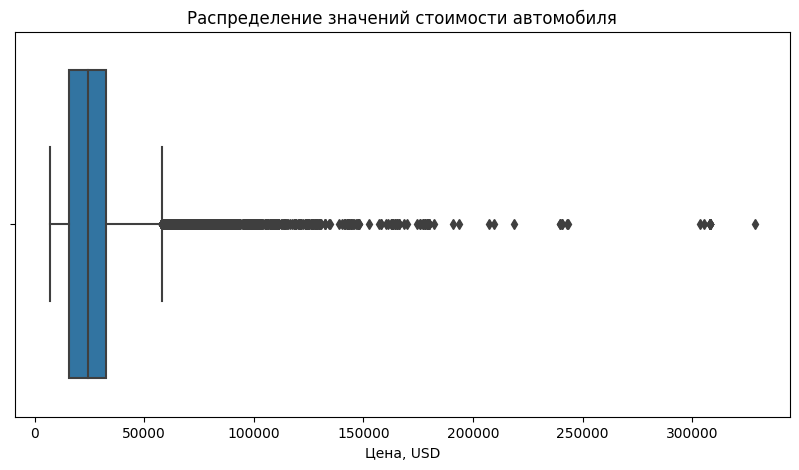

In [124]:
fig, ax = plt.subplots(figsize=(10, 5))
ax = sns.boxplot(data['Цена, USD'], orient='h')
plt.title('Распределение значений стоимости автомобиля')
plt.show();

**Все значения выглядят разумными и соответствующими условию задачи.**

#### *Разберемся со столбцом "Продажа, USD"*

In [125]:
data['Продажа, USD'].unique()

array(['28115', '32246,99', '32000', ..., '59199,84723', '60256,41026',
       '48756,92071'], dtype=object)

In [126]:
data['Продажа, USD'] = data['Продажа, USD'].str.replace(',', '.')

In [127]:
data['Продажа, USD'] = data['Продажа, USD'].astype(float)

In [128]:
data['Продажа, USD'] = round(data['Продажа, USD'], 2)

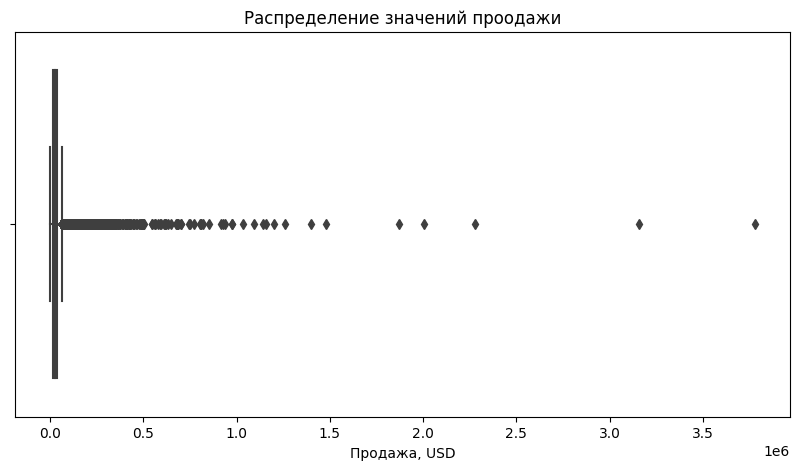

In [129]:
fig, ax = plt.subplots(figsize=(10, 5))
ax = sns.boxplot(data['Продажа, USD'], orient='h')
plt.title('Распределение значений проодажи')
plt.show();

**Все значения выглядят разумными и соответствующими условию задачи.**

#### *Разберемся со столбцом "Область"*

In [130]:
data['Область'].unique()

array(['г.Алматы', 'г.Нур-Султан', 'Восточно-Казахстанская область',
       'Западно-Казахстанская область', 'Костанайская область',
       'Павлодарская область', 'Южно-Казахстанская область',
       'Мангистауская область', 'Атырауская область',
       'Актюбинская область', 'Карагандинская область',
       'Северо-Казахстанская область', 'Акмолинская область',
       'Кызылординская область', 'Жамбылская область',
       'Туркестанская область', 'Алматинская область', 'Экспорт область'],
      dtype=object)

**Все значения выглядят разумными и соответствующими условию задачи.**

#### *Разберемся со столбцом "Сегментация 2013"*

In [131]:
data['Сегментация 2013'].unique()

array(['Легковые автомобили', 'Внедорожники', 'Коммерческие автомобили',
       'Минивэны', 'Пикапы'], dtype=object)

**Чтобы не потерять исходные данные, создадим новый столбец, в котором будут только 2 значения: Легковой транспорт и Коммерческий транспорт.**

In [132]:
def function_help(row):
    if row == 'Коммерческие автомобили':
        return 'Коммерческий транспорт'
    else:
        return 'Легковой транспорт'

In [133]:
data['Новый_сегмент'] = data['Сегментация 2013'].apply(function_help)

In [134]:
data['Новый_сегмент'].unique()

array(['Легковой транспорт', 'Коммерческий транспорт'], dtype=object)

In [135]:
data['Новый_сегмент'].isnull().sum()

0

**Все значения выглядят разумными и соответствующими условию задачи.**

#### *Разберемся со столбцом "Класс 2013"*

In [136]:
data['Класс 2013'].unique()

array(['C класс', 'D класс', 'E класс', 'F класс', 'Среднеразмерные SUV',
       'Полноразмерные SUV', 'Спортивные автомобили', 'Компактные SUV',
       'B класс', 'Субкомпактные SUV', 'Большие автобусы',
       'Крупнотоннажные грузовики', 'Микроавтобусы',
       'Малотоннажные грузовики', 'Среднетоннажные грузовики',
       'Полноразмерный Минивэн', 'Средние автобусы', 'Pick-ups',
       'Развозные автомобили', 'A класс', 'Компактвэн'], dtype=object)

**Чтобы не потерять исходные данные, создадим новый столбец, в котором будут следующие значения:**
- A класс
- B класс
- C класс
- D класс
- E класс
- F класс
- M класс
- S класс
- SUV класс
- Пикапы
- Микроавтобусы
- Большие автобусы
- Средние автобусы
- Легкие коммерческие автомобили
- Малотоннажные грузовики
- Крупнотоннажные грузовики
- Среднетоннажные грузовики

In [137]:
def function_class(row):
    if 'SUV' in row:
        return 'SUV класс'
    if row == 'Полноразмерный Минивэн':
        return 'M класс'
    if row == 'Компактвэн':
        return 'M класс'
    if row == 'Спортивные автомобили':
        return 'S класс'
    if row == 'Pick-ups':
        return 'Пикапы'
    if row == 'Развозные автомобили':
        return 'Легкие коммерческие автомобили'
    else:
        return row

In [138]:
data['Новый_класс'] = data['Класс 2013'].apply(function_class)

In [139]:
data['Новый_класс'].unique()

array(['C класс', 'D класс', 'E класс', 'F класс', 'SUV класс', 'S класс',
       'B класс', 'Большие автобусы', 'Крупнотоннажные грузовики',
       'Микроавтобусы', 'Малотоннажные грузовики',
       'Среднетоннажные грузовики', 'M класс', 'Средние автобусы',
       'Пикапы', 'Легкие коммерческие автомобили', 'A класс'],
      dtype=object)

In [140]:
data['Новый_класс'].isnull().sum()

0

**Все значения выглядят разумными и соответствующими условию задачи.**

### Промежуточный вывод: на данном этапе мы проверили и исправили некорректные значения в таблице. Нам удалось устновить следующие:
1. Практически во всех столбцах были некорректные значения.
2. Большинство некорректных значений удалось исправить с помощью моды.

## Шаг 3. Разбираемся с явными дубликатами

In [141]:
data.duplicated().sum()

18722

**На мой взгляд такое количество явных дубликатов связано с тем, что у каждой продажи отсутствует персональный id. Я считаю, что в данном случае удалять явные дубликаты неверно, так как из-за этого мы теряем большую часть данных. Соответственно, оставляем данные без изменений.**

## Шаг 4. Разбираемся с пропусками

In [142]:
# Посчитаем долю пропусков
pd.DataFrame(data.isna().mean()*100).style.set_precision(1).background_gradient('coolwarm')

,0
Год,0.0
Месяц,0.0
Компания,0.0
Бренд,0.0
Модель,0.0
Модификация,9.0
Год выпуска,1.3
Страна-производитель,0.0
Вид топлива,0.0
Объем_двигателя,10.7


#### *Разберемся со столбцом "Год выпуска"*

In [143]:
data[data['Год выпуска'].isna()]['Модель'].unique()

array(['7 серия', 'H350', 'HD 160', 'HD 65', 'HD 78', 'Universe', 'S3',
       'S5', 'XJ', 'Discovery Sport', 'Range Rover', 'Range Rover Evoque',
       'Range Rover Sport', '3', '6', 'CX-5', 'Outlander', 'Pajero IV',
       'Pajero Sport', 'Nexia R3', 'Amarok', 'Caravelle', 'Polo',
       'Tiguan', 'Touareg', 'Transporter Kasten', 'XC90', 'CX-9', 'HD 35',
       'Range Rover Velar', 'E-PACE', 'Eclipse Cross', 'XC60', 'Teramont',
       'EX8'], dtype=object)

**Оставим только те строки таблицы, где в столбце Год выпуска нет пропусков. Далее, с помощью цикла заменим пропуски соответствующим значением моды в зависимости от модели.**

In [144]:
no_na_table = data[data['Год выпуска'].notna()]

In [145]:
for t in no_na_table['Модель'].unique():
    try:
        data.loc[((data['Модель'] == t) & (data['Год выпуска'].isna())), 'Год выпуска'] = \
        no_na_table.query('Модель == @t')['Год выпуска'].mode()[0]
    except:
        pass

In [146]:
data['Год выпуска'].value_counts(dropna=False)

2019    30412
2018     9153
2017      360
2016       30
NaN         6
2014        2
2013        1
2011        1
Name: Год выпуска, dtype: int64

**К сожалению не удалось заполнить все пропуски, оставшиеся пропущенные значения оставим без изменений.**

#### *Разберемся со столбцом "Объем_двигателя"*

In [147]:
no_na_table = data[data['Объем_двигателя'].notna()]

In [148]:
for t in no_na_table['Модель'].unique():
    try:
        data.loc[((data['Модель'] == t) & (data['Объем_двигателя'].isna())), 'Объем_двигателя'] = \
        no_na_table.query('Модель == @t')['Объем_двигателя'].mode()[0]
    except:
        pass

In [149]:
# Найдем модели, для которых не удалось заполнить пропуски
data[data['Объем_двигателя'].isna()]['Модель'].value_counts()

Logan             320
65115             259
Kaptur            230
43118             188
6520               74
45143              62
Arkana             55
65116              53
CX-5               51
44108              45
SX3258DR384        43
Dokker             34
5490               32
6                  30
HF-D105            30
65117              29
43253              27
53215              26
CX-9               26
BJ1069VDJEA-F1     19
45142              19
54115              17
58815Z             15
65111              12
BWC6665GA5         10
N75                 9
BJ3253DMPKB-AD      9
Master              8
53504               7
4320                7
43502               6
EX8                 6
3                   5
53605               4
65206               4
Tipper              4
45141               3
65225               3
4308                2
Daily A             2
66052               2
Stralis             2
6606                2
X200                2
5557                2
4311      

**Согласно данным из интернета (https://www.drom.ru/catalog/renault/logan/specs/engine_capacity/?ysclid=lryupe4zqw929632894) на Logan стоит двигатель 1.6. Произведем замену согласно этим данным**

In [150]:
data.loc[((data['Модель'] == "Logan") & (data['Объем_двигателя'].isna())), 'Объем_двигателя'] = 1.6

**Отдельно разберемся с моделью 65115**

**Согласно данным из интернета (https://www.drom.ru/catalog/kamaz/65115/specs/engine_capacity/?ysclid=lrm9ajnulu157615879), у KAMAZ 65115 есть 2 исполнения : с двигателями 6.7 и 11.8. Так как далее мы будем категоризовать столбец "Объем двигателя", то все значения больше 6 в любом случае попадут в одну категорию. Соответственно, для нас не важно, каким значением заполнять пропуски для данной модели. Заполним значением 6.7.**

In [151]:
data.loc[((data['Модель'] == "65115") & (data['Объем_двигателя'].isna())), 'Объем_двигателя'] = 6.7

**Согласно данным из интернета (https://www.drom.ru/catalog/kamaz/43118/specs/engine_capacity/?ysclid=lrpbcv9qk1354158594), у KAMAZ 43118 есть 2 исполнения : от 10.8 до 11.8 л. Так как далее мы будем категоризовать столбец "Объем двигателя", то все значения больше 6 в любом случае попадут в одну категорию. Соответственно, для нас не важно, каким значением заполнять пропуски для данной модели. Заполним значением 10.8.**

In [152]:
data.loc[((data['Модель'] == "43118") & (data['Объем_двигателя'].isna())), 'Объем_двигателя'] = 10.8

**Согласно данным из интернета, у KAMAZ 6520 есть 2 исполнения : от 8.9 до 11.8 л. Так как далее мы будем категоризовать столбец "Объем двигателя", то все значения больше 6 в любом случае попадут в одну категорию. Соответственно, для нас не важно, каким значением заполнять пропуски для данной модели. Заполним значением 8.9.**

In [153]:
data.loc[((data['Модель'] == "6520") & (data['Объем_двигателя'].isna())), 'Объем_двигателя'] = 8.9

**Согласно данным из интернета, у KAMAZ 45143 есть 2 исполнения : от 6.7 до 11.8. Так как далее мы будем категоризовать столбец "Объем двигателя", то все значения больше 6 в любом случае попадут в одну категорию. Соответственно, для нас не важно, каким значением заполнять пропуски для данной модели. Заполним значением 6.7.**

In [154]:
data.loc[((data['Модель'] == "45143") & (data['Объем_двигателя'].isna())), 'Объем_двигателя'] = 6.7

**Согласно данным из интернета, у Renault Kaptur бывают либо двигатели 1.3, либо 1.6. Так как далее мы будем категоризовать столбец "Объем двигателя", то оба этих значения попадут в одну категорию (малый класс — объём двигателя до 1,2-1,8 литра). Соответственно, для нас не важно, каким значением заполнять пропуски для данной модели. Заполним значением 1.6.**


In [155]:
data.loc[((data['Модель'] == "Kaptur") & (data['Объем_двигателя'].isna())), 'Объем_двигателя'] = 1.6

**Согласно данным из интернета, у KAMAZ 65116 есть 2 исполнения : от 6.7 до 11.8. Так как далее мы будем категоризовать столбец "Объем двигателя", то все значения больше 6 в любом случае попадут в одну категорию. Соответственно, для нас не важно, каким значением заполнять пропуски для данной модели. Заполним значением 6.7.**

In [156]:
data.loc[((data['Модель'] == "65116") & (data['Объем_двигателя'].isna())), 'Объем_двигателя'] = 6.7

**Согласно данным из интернета (https://www.drom.ru/catalog/mazda/cx-5/specs/engine_capacity/?ysclid=lrpby0gg7k97115253), у Mazda CX-5 бывают либо двигатели 2.0, либо 2.5. Так как далее мы будем категоризовать столбец "Объем двигателя", то оба этих значения попадут в одну категорию (средний класс — объём двигателя до 1,8-3,5 литров). Соответственно, для нас не важно, каким значением заполнять пропуски для данной модели. Заполним значением 2.5.**

In [157]:
data.loc[((data['Модель'] == "CX-5") & (data['Объем_двигателя'].isna())), 'Объем_двигателя'] = 2.5

**Согласно данным из интернета у KAMAZ 44108 есть 2 исполнения : от 10.8 до 11.8 л. Так как далее мы будем категоризовать столбец "Объем двигателя", то все значения больше 6 в любом случае попадут в одну категорию. Соответственно, для нас не важно, каким значением заполнять пропуски для данной модели. Заполним значением 10.8.**

In [158]:
data.loc[((data['Модель'] == "44108") & (data['Объем_двигателя'].isna())), 'Объем_двигателя'] = 10.8

**Согласно данным из интернета у Shacman SX3258DR384 двигатель 9.7 л. Произведем замену согласно этим данным**

In [159]:
data.loc[((data['Модель'] == "SX3258DR384") & (data['Объем_двигателя'].isna())), 'Объем_двигателя'] = 9.7

**Согласно данным из интернета, у Renault Dokker бывают либо двигатели 1.5, либо 1.6. Так как далее мы будем категоризовать столбец "Объем двигателя", то оба этих значения попадут в одну категорию (малый класс — объём двигателя до 1,2-1,8 литра). Соответственно, для нас не важно, каким значением заполнять пропуски для данной модели. Заполним значением 1.6.**

In [160]:
data.loc[((data['Модель'] == "Dokker") & (data['Объем_двигателя'].isna())), 'Объем_двигателя'] = 1.6

**Согласно данным из интернета у KAMAZ 5490 двигатель 12л. Произведем замену согласно этим данным**

In [161]:
data.loc[((data['Модель'] == "5490") & (data['Объем_двигателя'].isna())), 'Объем_двигателя'] = 12.0

**Согласно данным из интернета у Renault Arkana бывают либо двигатели 1.3, либо 1.6. Так как далее мы будем категоризовать столбец "Объем двигателя", то оба этих значения попадут в одну категорию (малый класс — объём двигателя до 1,2-1,8 литра). Соответственно, для нас не важно, каким значением заполнять пропуски для данной модели. Заполним значением 1.6.**

In [162]:
data.loc[((data['Модель'] == "Arkana") & (data['Объем_двигателя'].isna())), 'Объем_двигателя'] = 1.6

**Согласно данным из интернета, у Mazda 6 бывают либо двигатели 2.0, либо 2.5. Так как далее мы будем категоризовать столбец "Объем двигателя", то оба этих значения попадут в одну категорию (средний класс — объём двигателя до 1,8-3,5 литров). Соответственно, для нас не важно, каким значением заполнять пропуски для данной модели. Заполним значением 2.5.**

In [163]:
data.loc[((data['Модель'] == "6") & (data['Объем_двигателя'].isna())), 'Объем_двигателя'] = 2.5

**К сожалению у Renault Kaptur бывают либо двигатели 1.6 (категория малый класс 1.2-1.8), либо 2 (средний класс — объём двигателя до 1,8-3,5 литров). Соответственно, нет возможности заполнить данные значения, оставляем их без изменений.**
**У остальных моделей количество пропусков составляет меньше 30, что на мой взгляд уже не является критичным для нашего проекта. Соответственно, оставляем их без изменений.**

#### *Разберемся со столбцом "Коробка передач"*

In [164]:
no_na_table = data[data['Коробка передач'].notna()]

In [165]:
for t in no_na_table['Модель'].unique():
    try:
        data.loc[((data['Модель'] == t) & (data['Коробка передач'].isna())), 'Коробка передач'] = \
        no_na_table.query('Модель == @t')['Коробка передач'].mode()[0]
    except:
        pass

In [166]:
# Найдем модели, для которых не удалось заполнить пропуски
data[data['Коробка передач'].isna()]['Модель'].value_counts()

Logan             320
Kaptur            230
NMR                89
D-MAX              73
Arkana             55
CX-5               51
SX3258DR384        43
Dokker             34
NPR                30
HF-D105            30
6                  30
CX-9               26
BJ1069VDJEA-F1     19
TG                 11
HFF6124G03EV3      10
BWC6665GA5         10
BJ3253DMPKB-AD      9
Master              8
4320                7
R-Series            7
EX8                 6
3                   5
Tipper              4
NQR                 3
S-Series            2
5557                2
NPS                 2
Daily A             2
P-Series            2
G-Series            1
Koleos              1
iev                 1
NMS85               1
4320-1951-60        1
4320-1951-40        1
Daily V             1
32551               1
HD 160              1
Setra               1
Name: Модель, dtype: int64

In [167]:
data[data['Модель'] == 'Kaptur']['Тип привода'].value_counts()

Series([], Name: Тип привода, dtype: int64)

In [168]:
data[data['Модель'] == 'Kaptur']['Объем_двигателя'].value_counts()

1.6    230
Name: Объем_двигателя, dtype: int64

In [169]:
data[data['Модель'] == 'Kaptur']['Год выпуска'].value_counts()

2019    131
2018     99
Name: Год выпуска, dtype: int64

**Согласно данным из интернета (https://www.drom.ru/catalog/renault/kaptur/specs/transmission/?ysclid=lrqd5w2jqn821880953) на Renault Kaptur поколение 04.2016 - 08.2020 1.6 литра,Shacman SX3258DR384, Renault Dokker, Isuzu NPR, Ankai HF-D105, Isuzu NMR  стоит механическая коробка передач. Произведем замену согласно этим данным**

In [170]:
list_2 = ['Kaptur', 'SX3258DR384', 'Dokker', 'NPR', 'HF-D105', 'NMR']
data.loc[((data['Модель'].isin(list_2)) & (data['Коробка передач'].isna())), 'Коробка передач'] = 'механическая'

In [171]:
 data[data['Модель'] == 'CX-5']['Тип привода'].value_counts()

Series([], Name: Тип привода, dtype: int64)

In [172]:
data[data['Модель'] == 'CX-5']['Объем_двигателя'].value_counts()

2.5    51
Name: Объем_двигателя, dtype: int64

In [173]:
data[data['Модель'] == 'CX-5']['Год выпуска'].value_counts()

2019    47
2018     4
Name: Год выпуска, dtype: int64

**Согласно данным из интернета (https://www.drom.ru/catalog/mazda/cx-5/specs/transmission/?ysclid=lrqdmxailx322585457) на Renault Kaptur поколение Mazda CX-5 2016 11.2016 - 03.2022 2.5 литра стоит автоматическая коробка передач. Произведем замену согласно этим данным.**

In [174]:
data.loc[((data['Модель'] == "CX-5") & (data['Коробка передач'].isna())), 'Коробка передач'] = 'автоматическая'

**К сожалению для остальных моделей не представляется возможным заполнить пропуски, так как у одной и той же модели есть исполнения с разными коробками передач.**

In [175]:
data['Коробка передач'].value_counts(dropna=False)

автоматическая    29218
механическая      10124
NaN                 623
Name: Коробка передач, dtype: int64

#### *Разберемся со столбцом "Вид топлива"*

In [176]:
no_na_table = data[(data['Вид топлива'].notna()) & data['Вид топлива'] != 'nan']

In [177]:
len(data.loc[data['Вид топлива'] == 'nan'])

3140

In [178]:
for t in no_na_table['Модель'].unique():
    try:
        data.loc[((data['Модель'] == t) & (data['Вид топлива'].isna())), 'Вид топлива'] = \
        no_na_table.query('Модель == @t')['Вид топлива'].mode()[0]
    except:
        pass

In [179]:
for t in no_na_table['Модель'].unique():
    try:
        data.loc[(data['Модель'] == t) & (data['Вид топлива'] == 'nan'), 'Вид топлива'] = \
        no_na_table.query('Модель == @t')['Вид топлива'].mode()[0]
    except:
        pass

In [180]:
len(data.loc[data['Вид топлива'] == 'nan'])

2101

In [181]:
data['Вид топлива'].replace('nan', pd.NA, inplace=True)

In [182]:
data[data['Вид топлива'].isna()]['Модель'].value_counts().nlargest(10)

Duster         650
Sandero        435
Logan          320
Kaptur         230
Arkana          55
CX-5            51
SX3258DR384     43
HD 78           34
Dokker          34
HF-D105         30
Name: Модель, dtype: int64

In [183]:
data[data['Модель'] == 'Duster']['Объем_двигателя'].value_counts()

2.0    701
1.6      6
Name: Объем_двигателя, dtype: int64

In [184]:
data[data['Модель'] == 'Duster']['Тип привода'].value_counts()

4WD    63
FWD     6
Name: Тип привода, dtype: int64

In [185]:
data[data['Модель'] == 'Duster']['Год выпуска'].value_counts()

2019    583
2018    124
Name: Год выпуска, dtype: int64

**Согласно данным из интернета (https://www.drom.ru/catalog/renault/duster/specs/fuel_consumption/?ysclid=lrqi76h09b922841358) на Renault Duster 1.6-2.0 литров,Sandero, Logan, Kaptur, Dokker, Mazda CX-5, 6, стоит бензиновый двигатель. Произведем замену согласно этим данным.**

In [186]:
list_1 = ['Duster', 'Kaptur', 'Sandero', 'Logan', 'CX-5', 'Dokker', '6']
data.loc[((data['Модель'].isin(list_1)) & (data['Вид топлива'].isna())), 'Вид топлива'] = "Бензин"

**Согласно данным из интернета (https://www.drom.ru/catalog/renault/logan/specs/fuel_consumption/?ysclid=lrqiip8vi1806168898) на Shacman SX3258DR384, Hyundai HD78 стоит двигатель c дизельным топливом. Произведем замену согласно этим данным.**

In [187]:
list_2 = ['SX3258DR384', 'HD 78']
data.loc[((data['Модель'].isin(list_2)) & (data['Вид топлива'].isna())), 'Вид топлива'] = 'Дизель'

**У остальных моделей количество пропусков составляет меньше 30, что на мой взгляд уже не является критичным для нашего проекта. Соответственно, оставляем их без изменений**

In [188]:
data['Вид топлива'].value_counts()

Бензин           37639
Дизель            2028
Электричество       14
Гибрид              10
Name: Вид топлива, dtype: int64

#### *Разберемся со столбцом "Тип привода"*

In [189]:
data['Тип привода'].unique()

array(['FWD', '4WD', 'RWD', '2WD', nan], dtype=object)

In [190]:
data['Тип привода'] = data.groupby('Модель')['Тип привода'].transform(lambda x: x.fillna(x.mode()[0]) if len(x.mode()) >= 1 else x)

In [191]:
# Найдем модели, для которых не удалось заполнить пропуски
data[data['Тип привода'].isna()]['Модель'].value_counts()

65115             259
Kaptur            230
43118             188
6520               74
45143              62
Arkana             55
CX-5               51
44108              45
SX3258DR384        43
Dokker             34
5490               32
6                  30
HF-D105            30
65117              29
43253              27
53215              26
CX-9               26
45142              19
BJ1069VDJEA-F1     19
54115              17
58815Z             15
65111              12
TG                 11
BWC6665GA5         10
BJ3253DMPKB-AD      9
Master              8
53504               7
R-Series            7
4320                7
EX8                 6
43502               6
3                   5
65206               4
53605               4
Tipper              4
65225               3
Daily A             2
4308                2
S-Series            2
6606                2
66052               2
P-Series            2
5557                2
4320-1951-60        1
4311                1
iev       

In [192]:
data['Тип привода'].unique()

array(['FWD', '4WD', 'RWD', '2WD', nan], dtype=object)

**Согласно данным из интернета на Kamaz 65115, 6520, 45143, 5490 и на модели SX3258DR384 стоит задний привод. Произведем замену согласно этим данным**

In [193]:
list_1 = ['65115', '6520', '45143', 'SX3258DR384', '5490', '65117', '43253', '53215']
data.loc[((data['Модель'].isin(list_1)) & (data['Тип привода'].isna())), 'Тип привода'] = "RWD"

**Согласно данным из интернета на Kamaz 43118, 44108, Mazda CX-5 стоит полный привод. Произведем замену согласно этим данным**

In [194]:
list_2 = ['43118', '44108', 'CX-5']
data.loc[((data['Модель'].isin(list_2)) & (data['Тип привода'].isna())), 'Тип привода'] = "4WD"

**Согласно данным из интернета на Renault Dokker, Mazda 6 стоит передний привод. Произведем замену согласно этим данным**

In [195]:
list_3 = ['Dokker', '6']
data.loc[((data['Модель'] == "Dokker") & (data['Тип привода'].isna())), 'Тип привода'] = "FWD"

In [196]:
# Найдем модели, для которых не удалось заполнить пропуски
data[data['Тип привода'].isna()]['Модель'].value_counts()

Kaptur            230
Arkana             55
HF-D105            30
6                  30
CX-9               26
BJ1069VDJEA-F1     19
45142              19
54115              17
58815Z             15
65111              12
TG                 11
BWC6665GA5         10
BJ3253DMPKB-AD      9
Master              8
4320                7
R-Series            7
53504               7
EX8                 6
43502               6
3                   5
65206               4
Tipper              4
53605               4
65225               3
Daily A             2
6606                2
66052               2
5557                2
S-Series            2
4308                2
P-Series            2
Setra               1
Daily V             1
32551               1
5299                1
4320-1951-40        1
iev                 1
4311                1
4320-1951-60        1
G-Series            1
HD 160              1
Koleos              1
Name: Модель, dtype: int64

**К сожалению, пропуски для Renault Arkana заполнить не представляется возможным, так как у нее есть исполнения с одинаковым объемом двигателя, но при этом разным приводом (https://www.drom.ru/catalog/renault/arkana/specs/drive_type/?ysclid=lrqk5d72ym607200133). У остальных моделей количество пропусков составляет меньше 30, что на мой взгляд уже не является критичным для нашего проекта. Соответственно, оставляем их без изменений.**

#### *Разберемся со столбцом "Количество"*

**Чтобы пропущенные значения не искажали картину при дальнейшем анализе, удалим их.**

In [197]:
check_before = len(data['Количество'])
check_before

39965

In [198]:
data.dropna(subset=['Количество'], inplace=True)
check_after = check_before - len(data['Количество'])
check_after

6

In [199]:
# Посчитаем процент данных, который мы удалили
round(100 * (check_after / check_before), 2)

0.02

**Вывод: мы удалили меньше 1% всех данных.**

#### *Разберемся со столбцом "Тип клиента"*

In [200]:
data['Тип клиента'].unique()

array(['физическое лицо', 'юридическое лицо', nan], dtype=object)

**Пропуски в данном столбце заполним следующим образом: если клиент покупал только легковой транспорт и при этом покупка меньше трех машин, то такого клиента будем относить к физическим лицам, а всех остальных - к юридическим.**

In [201]:
def replace_type(row):
    if pd.isna(row['Тип клиента']):
        if row['Количество'] < 3 and row['Новый_сегмент'] == 'Легковой транспорт':
            return 'физическое лицо'
        else:
            return 'юридическое лицо'
    else:
        return row['Тип клиента']

data['Тип клиента'] = data.apply(replace_type, axis=1)

In [202]:
data['Тип клиента'].unique()

array(['физическое лицо', 'юридическое лицо'], dtype=object)

**Устранили пропуски в данном столбце**

In [203]:
# Посчитаем долю пропусков после всех операций по их заполнению 
pd.DataFrame(data.isna().mean()*100).style.set_precision(1).background_gradient('coolwarm')

,0
Год,0.0
Месяц,0.0
Компания,0.0
Бренд,0.0
Модель,0.0
Модификация,9.0
Год выпуска,0.0
Страна-производитель,0.0
Вид топлива,0.7
Объем_двигателя,0.8


### Промежуточный вывод: на данном этапе мы проверили и исправили пропущенные значения в таблице. Нам удалось устновить следующие:
1. Практически во всех столбцах были пропущенные значения. Мы заполнили пропуски в следующих столбцах: Год выпуска, Объем_двигателя, Коробка передач, Вид топлива, Количество, Тип клиента.
2. Большинство пропущенных значений удалось заменить с помощью моды. 

## Шаг 5. Исследовательский анализ данных

#### *Для начала уберем из таблицы столбцы, которые мы не будем использовать в анализе.*

In [204]:
# Список столбцов, которые нужно удалить
columns_to_remove = ['Сегмент', 'Регион', 'Наименование дилерского центра',
                     'Форма расчета', 'Сегментация Eng', 'Локализация производства']

data_new = data.drop(columns=columns_to_remove)

#### *Проведем категоризацию столбца с объемом двигателя*.
Разобъем значения из данного столбца на 5 категорий:
- особо малый класс — объём двигателя до 1,2 литра
- малый класс — объём двигателя от 1,2 до 1,8 литров
- средний класс — объём двигателя от 1,8 до 3,5 литров
- большой класс — объём двигателя от 3,5 до 6 литров
- особо большой класс - объём двигателя свыше 6 литров


In [205]:
def categorize_engine(row):
    try:
        if row <= 1.2:
            return 'особо малый класс (менее 1,2 литра)'
        elif 1.2 < row <= 1.8:
            return 'малый класс (от 1,2 до 1,8 литров)'
        elif 1.8 < row <= 3.5:
            return 'средний класс (от 1,8 до 3,5 литров)'
        elif 3.5 < row <= 6.0:
            return 'большой класс (от 3,5 до 6 литров)'
        elif row > 6.0:
            return 'особо большой класс (более 6 литров)'
    except:
        pass

In [206]:
data_new['Тип_двигателя'] = data_new['Объем_двигателя'].apply(categorize_engine)

In [207]:
data_new['Тип_двигателя'].unique()

array(['малый класс (от 1,2 до 1,8 литров)',
       'средний класс (от 1,8 до 3,5 литров)',
       'большой класс (от 3,5 до 6 литров)',
       'особо большой класс (более 6 литров)', None,
       'особо малый класс (менее 1,2 литра)'], dtype=object)

#### *Проверим, машины с какой датой производства преобладают в нашей таблице*.

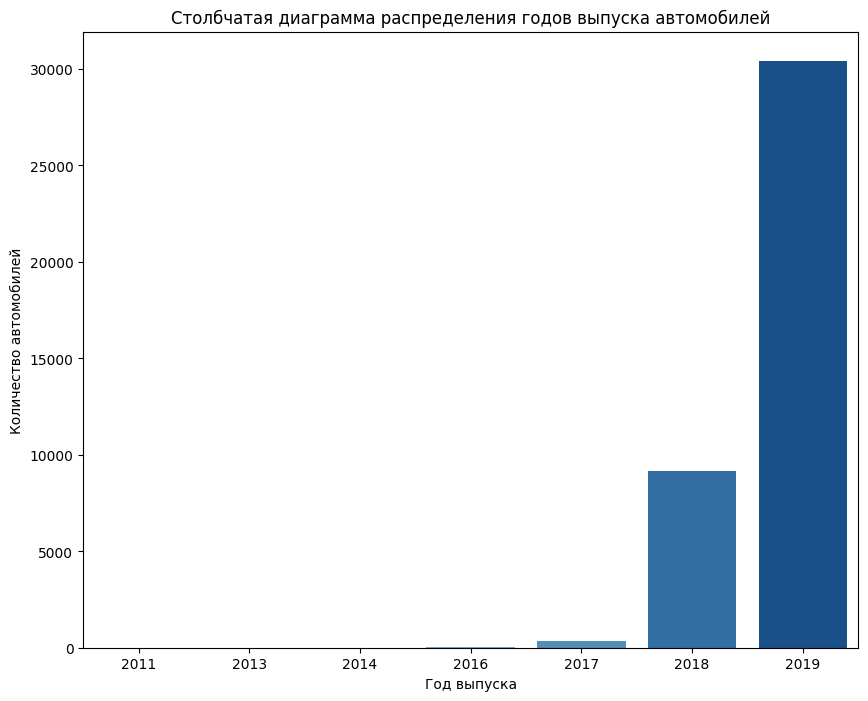

In [208]:
# Для лучшей наглядности построим столбчатую диаграмму

fig, ax = plt.subplots(figsize=(10, 8))

ax = sns.countplot(x = "Год выпуска", data = data_new.sort_values(by='Год выпуска', ascending=True), palette = "Blues")
plt.xlabel('Год выпуска')
plt.ylabel('Количество автомобилей')
plt.title('Столбчатая диаграмма распределения годов выпуска автомобилей')
plt.show();

**Мы видим, что в таблице преобладают машины 2019 года.**

#### *Проверим, какие страны-производители преобладают в нашей таблице*.

In [209]:
country = data_new.groupby('Страна-производитель', as_index=False)['Модель'].agg('count')

In [210]:
# Создадим функцию для построения столбчатой диаграммы
def function_seaborn(table, x, y):
    fig, ax = plt.subplots(figsize=(15, 8))
    ax = sns.barplot(x = x, y=y,
                 data = table.sort_values(by=x, ascending=False))
    plt.ylabel(f'{y}')
    plt.xlabel('Количество автомобилей')
    plt.title(f'Столбчатая диаграмма распределения {y}')
    plt.ticklabel_format(useOffset=False,style='plain', axis='x')
    plt.show();


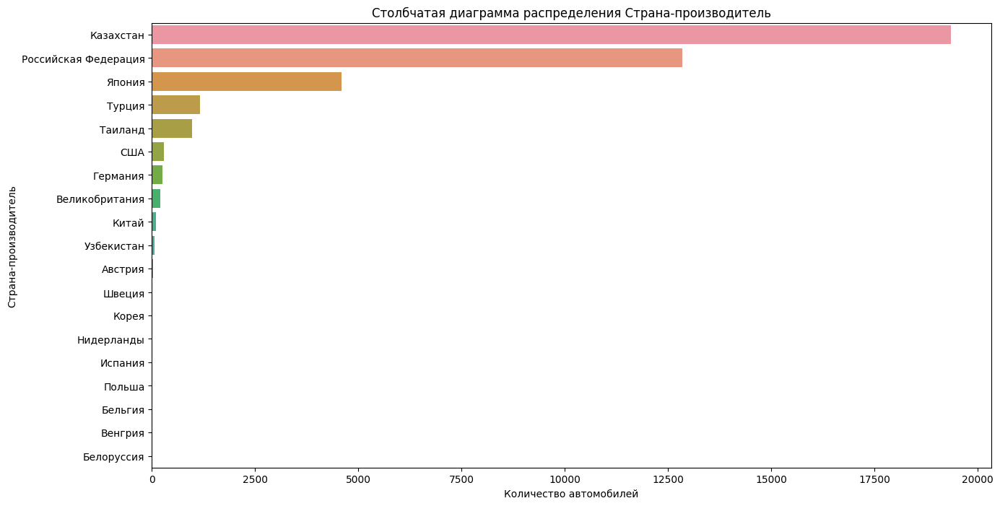

In [211]:
function_seaborn(table=country, x='Модель', y='Страна-производитель')

**Мы видим, что в таблице преобладают машины, произведенные в Казахстане и России.**

#### *Проверим, машины с каким типом топлива преобладают в нашей таблице*.

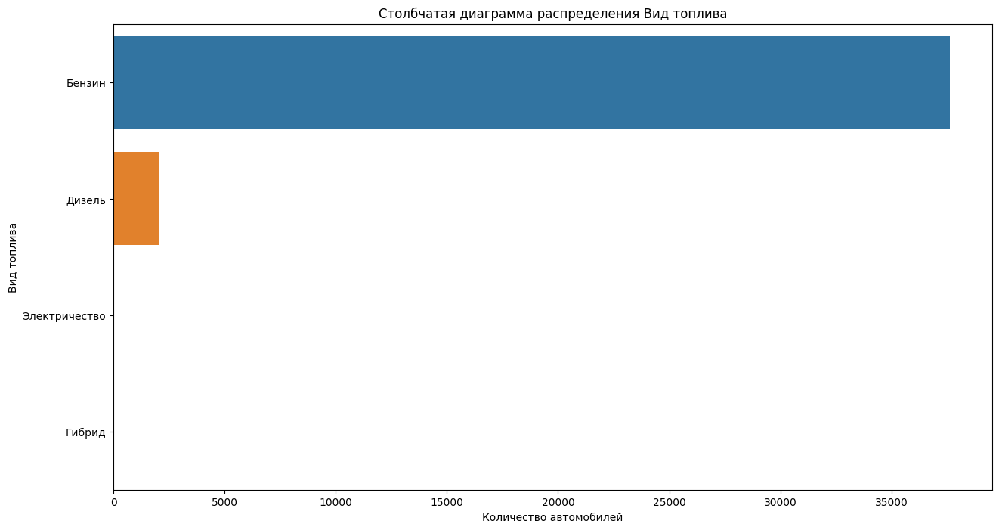

In [212]:
fuel = data_new.groupby('Вид топлива', as_index=False)['Модель'].agg('count')

function_seaborn(table=fuel, x='Модель', y='Вид топлива')

**Мы видим, что в таблице преобладают машины с бензиновыми двигателями.**

#### *Проверим, машины с каким объемом двигателя преобладают в нашей таблице*.

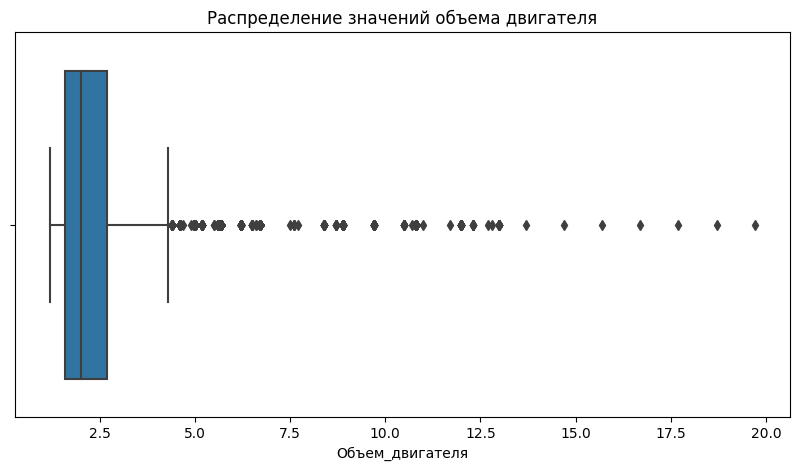

In [213]:
fig, ax = plt.subplots(figsize=(10, 5))
ax = sns.boxplot(data_new.query('Объем_двигателя > 0')['Объем_двигателя'], orient='h')
plt.title('Распределение значений объема двигателя')
plt.show();

**Мы видим, что большая часть значений находится в диапазоне от 1 до 2.5 литров. Также мы видим большое количество выбросов. На мой взгляд, удалять их нельзя так как данные, относящиеся к коммерческому транспорту и удалив их, мы не сможем корректно проанализировать рынок. Поэтому оставим данные значения без изменений.**

#### *Проверим, машины с каким типом привода преобладают в нашей таблице*.

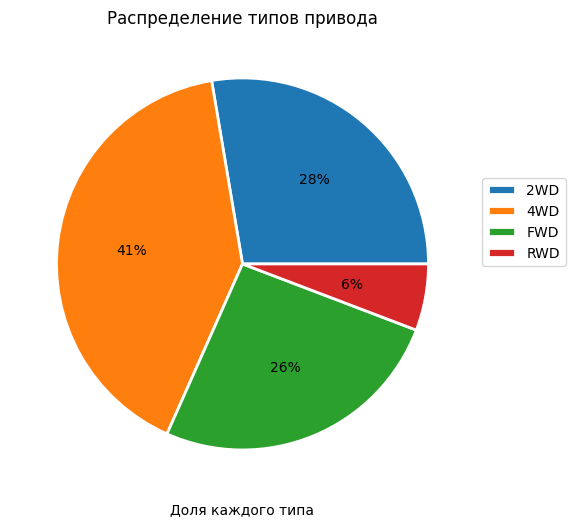

In [214]:
car_drive = data_new.groupby('Тип привода', as_index=False)['Модель'].agg('count')

values= car_drive['Модель']
keys = car_drive['Тип привода']
fig, ax = plt.subplots(figsize=(6, 10))
plt.pie(values,
        labels=keys,
        labeldistance=None,
        autopct='%.0f%%', wedgeprops={'linewidth': 2.0, 'edgecolor': 'white'})
plt.legend()
plt.legend(bbox_to_anchor=(1, 0.7))
plt.title('Распределение типов привода')
plt.xlabel("Доля каждого типа")
plt.show();

**Мы видим, что в таблице преобладают машины с полным приводом.**

#### *Проверим, машины с каким типом трансмисии преобладают в нашей таблице*.

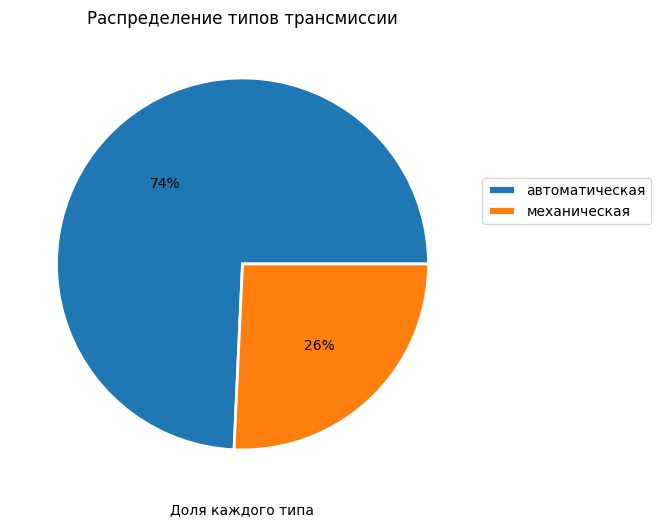

In [215]:
transmission = data_new.groupby('Коробка передач', as_index=False)['Модель'].agg('count')

values= transmission['Модель']
keys = transmission['Коробка передач']
fig, ax = plt.subplots(figsize=(6, 10))
plt.pie(values,
        labels=keys,
        labeldistance=None,
        autopct='%.0f%%', wedgeprops={'linewidth': 2.0, 'edgecolor': 'white'})
plt.legend()
plt.legend(bbox_to_anchor=(1, 0.7))
plt.title('Распределение типов трансмиссии')
plt.xlabel("Доля каждого типа")
plt.show();

**Мы видим, что в таблице преобладают машины с автоматической трансмиссии.**

#### *Проверим, какие клиенты преобладают в нашей таблице*.

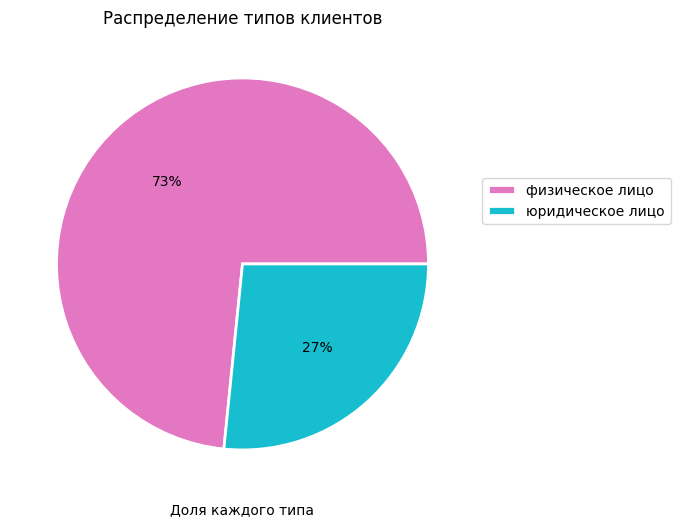

In [216]:
clients = data_new.groupby('Тип клиента', as_index=False)['Модель'].agg('count')

values= clients['Модель']
keys = clients['Тип клиента']
colors = ['tab:pink', 'tab:cyan']
fig, ax = plt.subplots(figsize=(6, 10))
plt.pie(values,
        labels=keys,
        labeldistance=None,
        autopct='%.0f%%', wedgeprops={'linewidth': 2.0, 'edgecolor': 'white'}, colors=colors)
plt.legend()
plt.legend(bbox_to_anchor=(1, 0.7))
plt.title('Распределение типов клиентов')
plt.xlabel("Доля каждого типа")
plt.show();

**Мы видим, что в таблице преобладают физические лица.**

**Проверим, какой тип клиента приносит больше денег**

In [217]:
clients_money = data_new.groupby('Тип клиента', as_index=False)['Продажа, USD'].agg('sum')
clients_money

,Тип клиента,"Продажа, USD"
0,физическое лицо,8.298901e+08
1,юридическое лицо,5.193044e+08


**Мы видим, что физические лица приносят больше денег чем юридические. Это связано с тем, что в нашей таблице гораздо больше физических чем юридических лиц.**

#### *Проверим, какое количество автомобилей как правило фигурирует в заказе*.

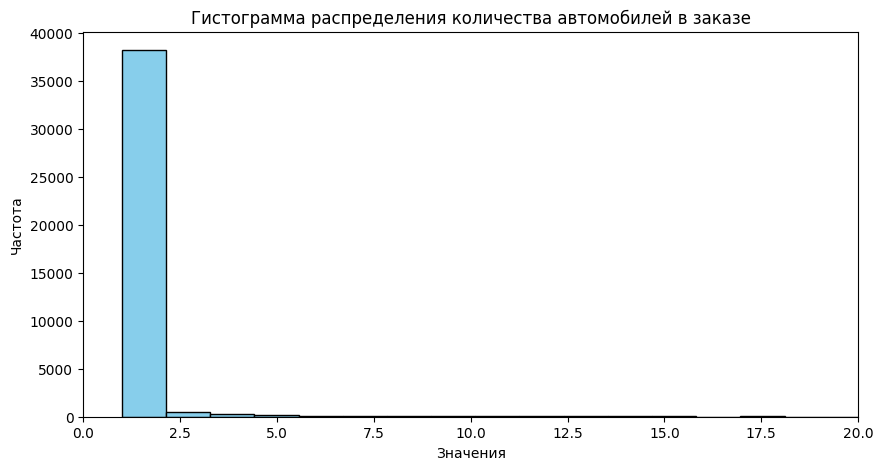

In [218]:
data_new['Количество'].hist(figsize=[10, 5], bins=100, color='skyblue', edgecolor='black', grid=False)
plt.xlabel('Значения')
plt.ylabel('Частота')
plt.title('Гистограмма распределения количества автомобилей в заказе')
plt.xlim (0, 20)
plt.show()

**Мы видим, что как правило в заказе фигурирует от 1 до 2 автомобилей.**

#### *Проверим, машины с какой ценой преобладают в нашей таблице*.

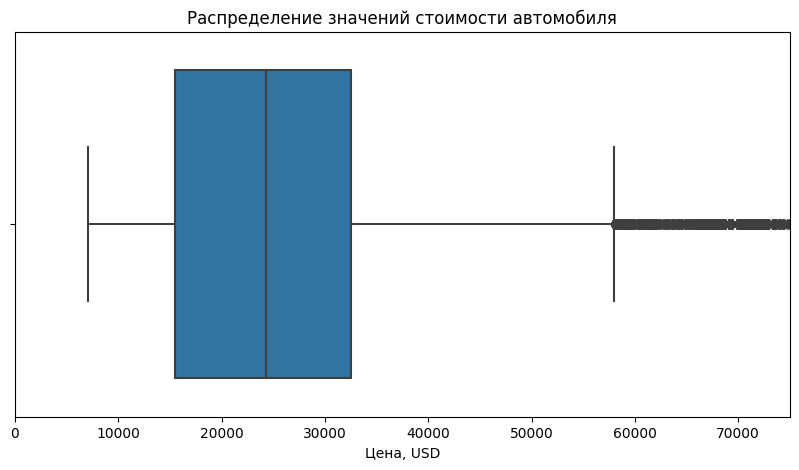

In [219]:
fig, ax = plt.subplots(figsize=(10, 5))
ax = sns.boxplot(data_new['Цена, USD'], orient='h')
plt.title('Распределение значений стоимости автомобиля')
plt.xlim (0, 75000)
plt.show();

**Мы видим, что большая часть значений стоимости автомобиля находится в диапазоне от 6000 до 58000 долларов. Также мы видим большое количество выбросов. На мой взгляд, удалять их нельзя так как данные, относящиеся к коммерческому транспорту и удалив их, мы не сможем корректно проанализировать рынок. Поэтому оставим данные значения без изменений.**

#### *Проверим,  какие сегменты преобладают в нашей таблице*.

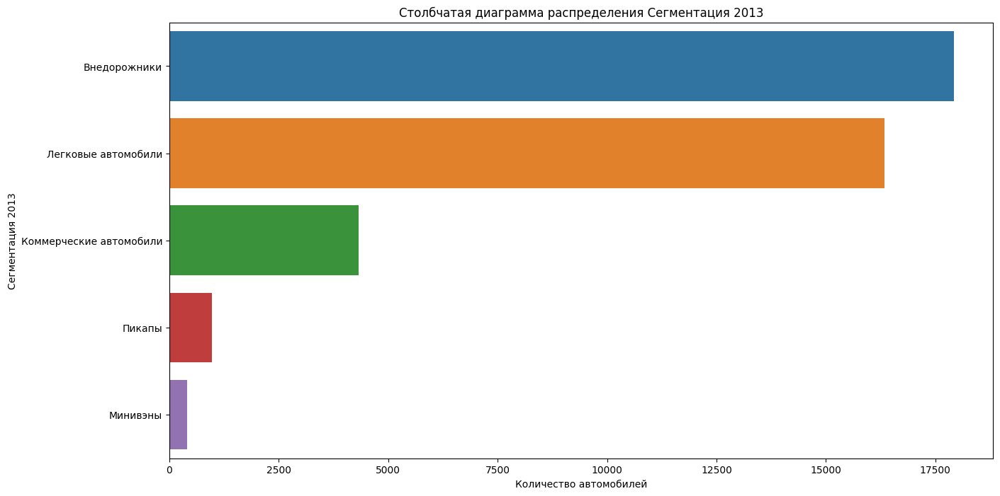

In [220]:
segment = data_new.groupby('Сегментация 2013', as_index=False)['Модель'].agg('count')

function_seaborn(table=segment, x='Модель', y='Сегментация 2013')

**Мы видим, что в таблице преобладают внедорожники и легковые автомобили.**

**Проверим, какой сегмент приносит больше денег**

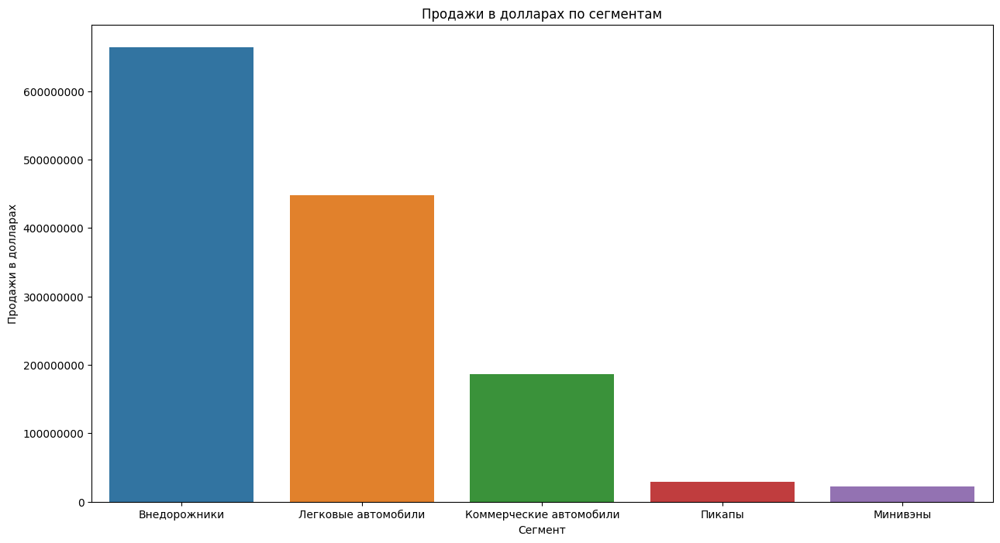

In [221]:
segment_money= data_new.groupby('Сегментация 2013', as_index=False)['Продажа, USD'].agg('sum')

fig, ax = plt.subplots(figsize=(15, 8))

ax = sns.barplot(x = "Сегментация 2013", y='Продажа, USD',
                 data = segment_money.sort_values(by='Продажа, USD', ascending=False))
plt.xlabel('Сегмент')
plt.ylabel('Продажи в долларах')
plt.title('Продажи в долларах по сегментам')
plt.ticklabel_format(useOffset=False,style='plain', axis='y')
plt.show();

**Мы видим, что сегменты внедорожники и легковые автомобили являются самыми прибыльными.**

#### *Проверим, какие классы преобладают в нашей таблице*.

In [222]:
class_name = data_new.groupby('Новый_класс', as_index=False)['Модель'].agg('count')

In [223]:
class_money= data_new.groupby('Новый_класс', as_index=False)['Продажа, USD'].agg('sum')

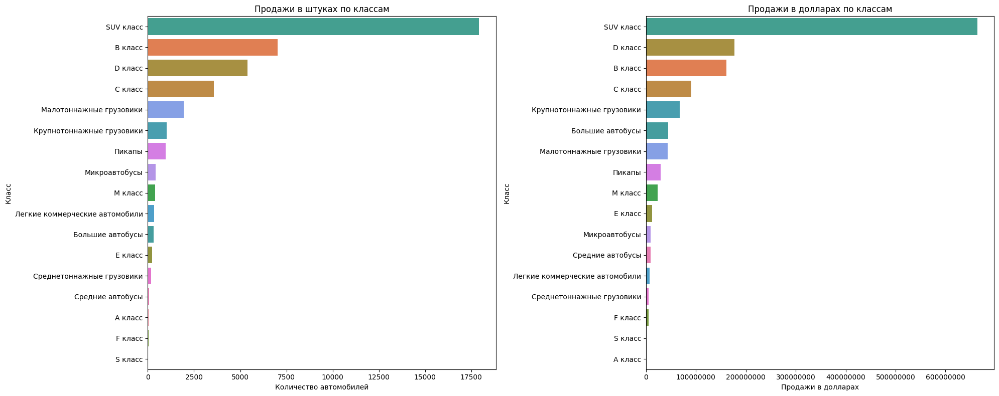

In [224]:
class_names = class_money['Новый_класс'].unique()
class_colors = sns.color_palette("husl", n_colors=len(class_names))

class_color_dict = dict(zip(class_names, class_colors))

plt.figure(figsize=(20, 8))
ax1 = plt.subplot(1, 2, 1)
ax1 = sns.barplot(y = "Новый_класс", x='Модель',
                 data = class_name.sort_values(by='Модель', ascending=False), palette=class_color_dict)
plt.xlabel('Количество автомобилей')
plt.ylabel('Класс')
plt.title('Продажи в штуках по классам')
plt.ticklabel_format(useOffset=False,style='plain', axis='x')


ax2 = plt.subplot(1, 2, 2)
ax2 = sns.barplot(y = "Новый_класс", x='Продажа, USD',
                 data = class_money.sort_values(by='Продажа, USD', ascending=False), palette=class_color_dict)
plt.xlabel('Продажи в долларах')
plt.ylabel('Класс')
plt.title('Продажи в долларах по классам')
plt.ticklabel_format(useOffset=False,style='plain', axis='x')
plt.tight_layout()
plt.show();

**Мы видим, что автомобили SUV класса являются самыми прибыльными. Также можно говорить о том, что автомобили данного класса преобладают в нашей таблице.**

#### *Оценим количество брендов, обычно представленных в портфеле автодилеров*.

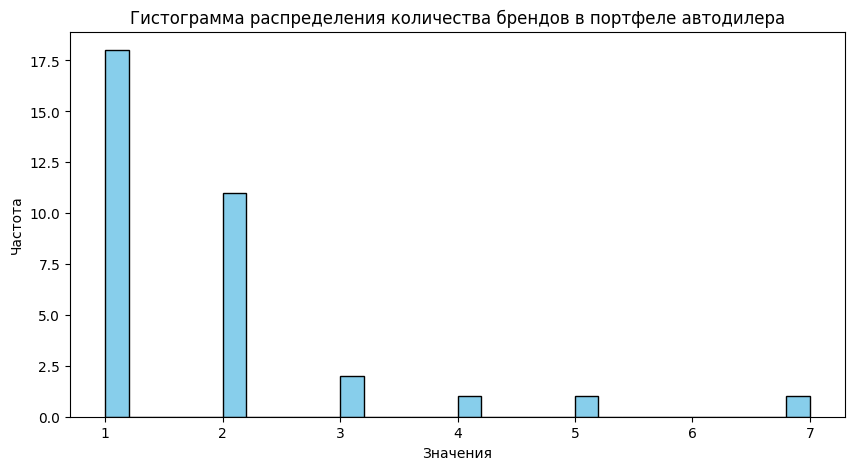

In [225]:
brand_per_company = data_new.groupby('Компания', as_index=False)['Бренд'].agg('nunique')
brand_per_company['Бренд'].hist(figsize=[10, 5], bins=30, color='skyblue', edgecolor='black', grid=False)
plt.xlabel('Значения')
plt.ylabel('Частота')
plt.title('Гистограмма распределения количества брендов в портфеле автодилера')
plt.show()

**Мы видим, что как правило в портфеле автодилера фигурирует от 1 до 2 брендов.**

#### *Найдем самые дешевые и дорогие бренды в нашей таблице*.

In [226]:
brand_expensive = data_new.groupby('Бренд', as_index=False)['Цена, USD'].agg('median')
brand_expensive.sort_values(by='Цена, USD', ascending=False).head()

,Бренд,"Цена, USD"
30,Nefaz,123251.160
21,Land Rover,116486.760
24,MAN,101048.940
36,Scania,101046.385
5,Daewoo,97460.015


**Мы видим, что в список топ-5 самых дорогих брендов попал Land Rover, относящийся к легковым автомобилям, что немного неожиданно.**

In [227]:
brand_expensive.sort_values(by='Цена, USD', ascending=True).head()

,Бренд,"Цена, USD"
34,Ravon,9893.93
4,Chevrolet,10523.30
20,Lada,11600.00
23,Lifan,12145.79
35,Renault,12635.54


**Список топ-5 самых дешевых брендов выглядит логично и действительно состоит из наиболее дешевых брендов, представленных на рынке.**

#### *Найдем сколько моделей у каждого бренда автомобилей*.

In [228]:
model_per_brand = data_new.groupby('Бренд', as_index=False)['Модель'].agg('nunique')
model_per_brand.sort_values(by='Модель', ascending=False)

,Бренд,Модель
18,KAMAZ,24
2,BMW,14
26,Mercedes-Benz,14
42,Volkswagen,13
12,Hyundai Truck & Bus,10
41,UAZ,10
9,GAZ,9
19,Kia,9
16,Jac,9
1,Audi,9


**Мы видим, что больше всего моделей у Камаза, а меньше всего у MAN, Shacman, Nefaz, Dong Feng, Yutong.**

### Промежуточный вывод: на данном этапе мы провели исследовательский анализ данных. Нам удалось установить следующее:
1. в таблице преобладают машины 2019 года.
2. в таблице преобладают машины, произведенные в Казахстане и России.
3. в таблице преобладают машины с бензиновыми двигателями.
4. большая часть значений объема двигателя находится в диапазоне от 1 до 2.5 литров. Также в данном столбце было обнаружено большое количество выбросов. Было решено не удалять их, чтобы корректно проанализировать рынок.
5. в таблице преобладают машины с полным приводом.
6. в таблице преобладают машины с автоматической трансмиссии.
7. в таблице преобладают клиенты - физические лица.
8. физические лица приносят больше денег чем юридические.
9. как правило в заказе фигурирует от 1 до 2 автомобилей.
10. большая часть значений стоимости автомобиля находится в диапазоне от 6000 до 58000 долларов. Также в данном столбце было обнаружено большое количество выбросов. Было решено не удалять их, чтобы корректно проанализировать рынок.
11. сегменты внедорожники и легковые автомобили являются самыми прибыльными.
12. автомобили SUV класса являются самыми прибыльными.
13. как правило в портфеле автодилера фигурирует от 1 до 2 брендов.
14. топ-5 самых дешевых по цене брендов: Chevrolet, Ravon, Lada, Lifan, Renault.
15. топ-5 самых дорогих по цене брендов: Nefaz, Land Rover,MAN, Scania, Daewoo.

In [405]:
data['Новая_модель'] = data['Бренд'] + ' ' + data['Модель']

In [409]:
columns_start = data.columns.tolist()

In [407]:
# создаем список новых названий колонок
columns_end = ['year', 'month', 'company', 'brand', 'model', 'modification', 'release_year', 
               'manufacturing_country', 'fuel_type',
         'engine_volume', 'transmission_type', 'drive_type', 
               'segment', 'region', 'dealer', 'client_type', 'payment_type',
         'quantity', 'price_usd', 'sell_price_usd', 'state', 'segment_2013', 'class_2013', 
               'segment_eng', 'product_localization', 'new_segment', 'new_class', 'new_model']

In [410]:
change_col_dict = dict(zip(columns_start, columns_end))

In [411]:
data_for_dashboard = data.rename(columns=change_col_dict)

In [415]:
#data_for_dashboard.to_excel('data_for_dashboard_.xlsx', index=False)

## Шаг 6. Анализ рынка легковых автомобилей

### Рассчитаем емкость рынка автомобилей: в денежном и количественном выражениях

In [229]:
data_new['Продажа, USD'] = round(data_new['Продажа, USD'], 0)
light_vehicles = data_new.query('Новый_сегмент == "Легковой транспорт"')

In [230]:
light_vehicles['Количество'].sum()

48629.0

In [231]:
light_vehicles['Продажа, USD'].sum()

1163382413.0

**Вывод: фактическая емкость рынка легковых автомобилей Казахстана в 2019 году на сентябрь составляет 48 629 штук и 1 163 382 320 долларов соответственно.**

In [232]:
round(light_vehicles['Количество'].sum() + 0.4 * (light_vehicles['Количество'].sum()), 0)

68081.0

In [233]:
light_vehicles['Продажа, USD'].sum() + 0.4 * light_vehicles['Продажа, USD'].sum()

1628735378.2

**Вывод: прогноз емкости рынка легковых автомобилей Казахстана на конец 2019 года составляет 68 081 штук и 1 628 735 248 долларов соответственно.**

### Найдем марки лидеры на рынке автомобилей

In [234]:
top_brands = light_vehicles.pivot_table(index='Бренд',
                                              values='Продажа, USD',
                                              aggfunc='sum').reset_index()
top_brands.sort_values(by='Продажа, USD', ascending=False)

,Бренд,"Продажа, USD"
26,Toyota,402499843.0
5,Hyundai,229307492.0
11,Lada,107847480.0
13,Lexus,77376345.0
10,Kia,45669700.0
19,Nissan,40012763.0
1,BMW,28735769.0
8,Jac,26595440.0
28,Volkswagen,25149709.0
23,Renault,24184905.0


In [235]:
# Сохраним названия брендов с лучшими продажами в отдельный список
best_brands_light = light_vehicles.pivot_table(index='Бренд',
                                              values='Продажа, USD',
                                              aggfunc='sum').reset_index().nlargest(10, 'Продажа, USD')['Бренд'].tolist()
best_brands_light

['Toyota',
 'Hyundai',
 'Lada',
 'Lexus',
 'Kia',
 'Nissan',
 'BMW',
 'Jac',
 'Volkswagen',
 'Renault']

In [236]:
# Все бренды, не относящиеся к топам переименуем в остальные
top_brands.loc[~top_brands['Бренд'].isin(best_brands_light), 'Бренд'] = "Остальные"

In [237]:
top_brands.sort_values(by='Продажа, USD', ascending=False)

,Бренд,"Продажа, USD"
26,Toyota,402499843.0
5,Hyundai,229307492.0
11,Lada,107847480.0
13,Lexus,77376345.0
10,Kia,45669700.0
19,Nissan,40012763.0
1,BMW,28735769.0
8,Jac,26595440.0
28,Volkswagen,25149709.0
23,Renault,24184905.0


In [238]:
pastel_colors = px.colors.qualitative.Pastel

fig = go.Figure(data=[go.Pie(labels=top_brands['Бренд'],
                            values=top_brands['Продажа, USD'],
                            hole=0.5,
                            textinfo='label+value+percent',
                            marker=dict(colors=pastel_colors))])

fig.update_layout(title={'text': "Марки лидеры среди легковых автомобилей по продажам в долларах"},
                  height=800,
                  width=800)

fig.show()


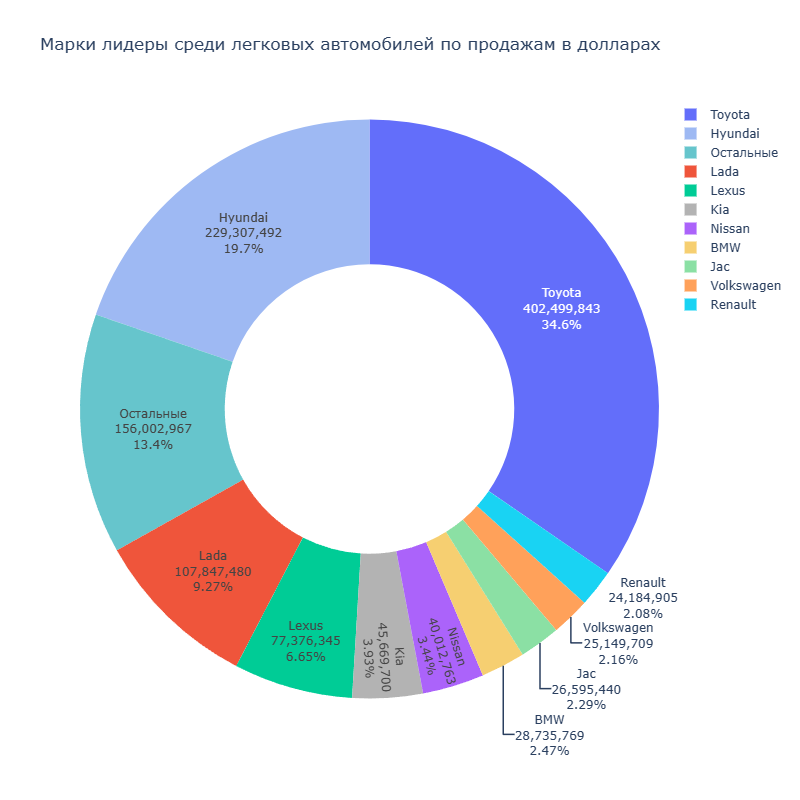

In [239]:
top_brands_count = light_vehicles.pivot_table(index='Бренд',
                                              values='Количество',
                                              aggfunc='sum').reset_index()

best_brands_count = light_vehicles.pivot_table(index='Бренд',
                                              values='Количество',
                                              aggfunc='sum').reset_index().nlargest(10, 'Количество')['Бренд'].tolist()

top_brands_count.loc[~top_brands_count['Бренд'].isin(best_brands_count), 'Бренд'] = "Остальные"

top_brands_count

,Бренд,Количество
0,Остальные,52.0
1,Остальные,438.0
2,Остальные,72.0
3,Остальные,648.0
4,Остальные,3.0
5,Hyundai,10168.0
6,Остальные,96.0
7,Остальные,73.0
8,Jac,1907.0
9,Остальные,37.0


In [240]:
fig = go.Figure(data=[go.Pie(labels=top_brands_count['Бренд'],
                            values=top_brands_count['Количество'],
                            hole=0.5,
                            textinfo='label+value+percent',
                            marker=dict(colors=pastel_colors))])

fig.update_layout(title={'text': "Марки лидеры среди легковых автомобилей по продажам в штуках"},
                  height=800,
                  width=800)

fig.show()


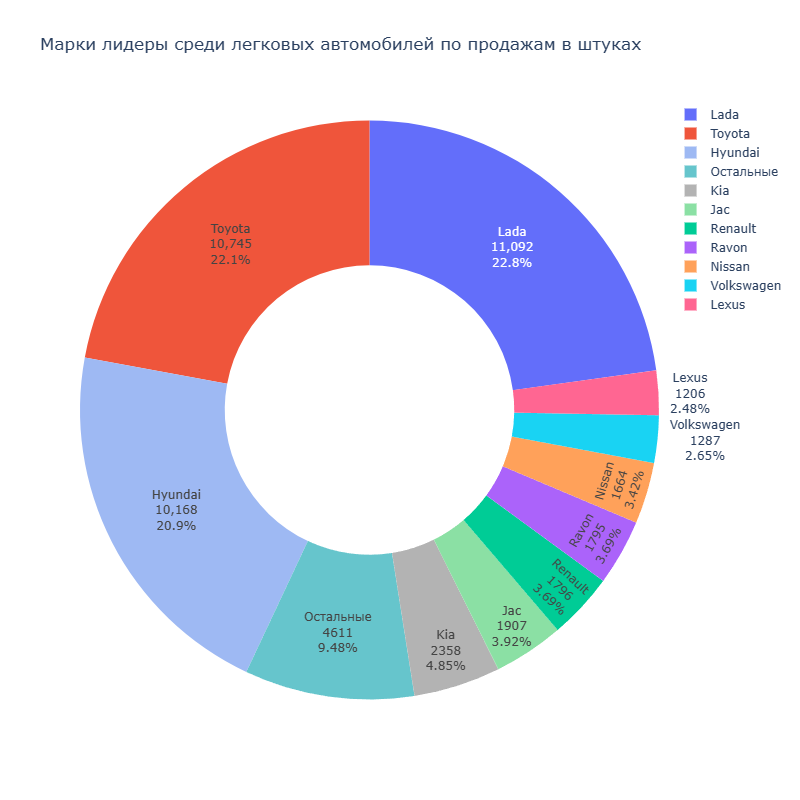

**Вывод: Lada, Toyota и Hyundai - лидеры рынка легковых автомобилей, как по продажам в штуках, так и в долларах.**

### Проанализируем динамику рынка: общую и по сегментам

#### *Общая динамика рынка*

**Напишем функцию, которая будет сортировать значения в таблице в календарном порядке.**

In [241]:
def order_months(df, month_column):
    month_order = {'Январь': 1, 'Февраль': 2, 'Март': 3,
                   'Апрель': 4, 'Май': 5, 'Июнь': 6, 'Июль': 7, 'Август': 8, 'Сентябрь': 9}

    # Преобразование столбца 'Месяц' в числовой порядок
    df[month_column] = df[month_column].map(month_order)

    # Сортировка DataFrame по столбцу 'Месяц'
    df = df.sort_values(by=month_column)

    # Восстановление исходного порядка месяцев
    df[month_column] = df[month_column].map({v: k for k, v in month_order.items()})

    return df  # Добавлено для возврата измененного DataFrame

In [242]:
dynamic_total = light_vehicles.pivot_table(index='Месяц',
                                              values=['Продажа, USD', 'Количество'],
                                              aggfunc='sum').reset_index()

dynamic_total = order_months(dynamic_total, 'Месяц')
dynamic_total

,Месяц,Количество,"Продажа, USD"
8,Январь,4163.0,103406985.0
7,Февраль,4125.0,100106421.0
5,Март,4525.0,109685397.0
1,Апрель,5351.0,132852565.0
4,Май,5688.0,137049244.0
3,Июнь,5910.0,144339583.0
2,Июль,6908.0,157158929.0
0,Август,5973.0,138678260.0
6,Сентябрь,5986.0,140105029.0


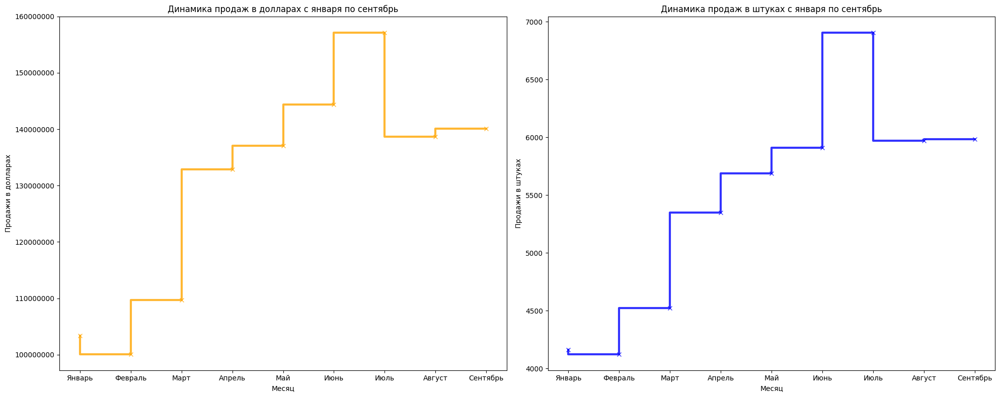

In [243]:
plt.figure(figsize=(20, 8))
ax1 = plt.subplot(1, 2, 1)
ax1 = plt.step(x=dynamic_total['Месяц'], y=dynamic_total['Продажа, USD'], marker='x', linewidth=3, alpha=0.8, color='orange')
plt.xlabel('Месяц')
plt.ylabel('Продажи в долларах')
plt.title('Динамика продаж в долларах с января по сентябрь')
plt.ticklabel_format(useOffset=False,style='plain', axis='y')


ax2 = plt.subplot(1, 2, 2)
ax2 = plt.step(x=dynamic_total['Месяц'], y=dynamic_total['Количество'], marker='x', linewidth=3, alpha=0.8, color='blue')
plt.xlabel('Месяц')
plt.ylabel('Продажи в штуках')
plt.title('Динамика продаж в штуках с января по сентябрь')
plt.ticklabel_format(useOffset=False,style='plain', axis='y')

plt.tight_layout()
plt.show();

**Вывод: мы видим, что пик продаж пришелся на июль, в первом квартале продаж практически не было, что логично из-за новогодних праздников и в целом начала года.**

#### *Общая динамика рынка с учетом прогноза по четвертому кварталу*

**Согласно прогнозу, продажи в 4 квартале должны составить порядка 40% от продаж за предыдущие 9 месяцев.**

In [244]:
forecast = 0.4 * light_vehicles['Продажа, USD'].sum()
forecast_2 = 0.4 * light_vehicles['Количество'].sum()

In [245]:
month_order = {'Январь': 1, 'Февраль': 2, 'Март': 3,
                   'Апрель': 4, 'Май': 5, 'Июнь': 6, 'Июль': 7, 'Август': 8, 'Сентябрь': 9}
dynamic_total['Номер месяца'] = dynamic_total['Месяц'].map(month_order)
# Функция для определения номера квартала по месяцу
def get_quarter(month):
    return (month - 1) // 3 + 1

# Добавляем столбец с номером квартала
dynamic_total['Квартал'] = dynamic_total['Номер месяца'].apply(get_quarter)
dynamic_total.loc[ len(dynamic_total.index )] = ['Четвертый квартал', forecast_2, forecast, 'Четвертый квартал', 4]
dynamic_total

,Месяц,Количество,"Продажа, USD",Номер месяца,Квартал
8,Январь,4163.0,103406985.0,1,1
7,Февраль,4125.0,100106421.0,2,1
5,Март,4525.0,109685397.0,3,1
1,Апрель,5351.0,132852565.0,4,2
4,Май,5688.0,137049244.0,5,2
3,Июнь,5910.0,144339583.0,6,2
2,Июль,6908.0,157158929.0,7,3
0,Август,5973.0,138678260.0,8,3
6,Сентябрь,5986.0,140105029.0,9,3
9,Четвертый квартал,19451.6,465352965.2,Четвертый квартал,4


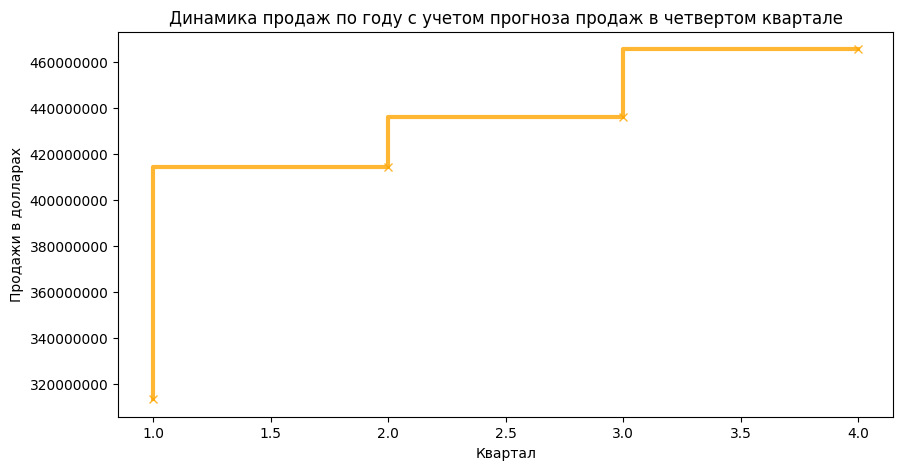

In [246]:
quarterly_sales = dynamic_total.pivot_table(index='Квартал',
                                              values='Продажа, USD',
                                              aggfunc='sum').reset_index()
plt.figure(figsize=(10, 5))
plt.step(x=quarterly_sales['Квартал'], y=quarterly_sales['Продажа, USD'], marker='x', linewidth=3, alpha=0.8, color='orange')
plt.xlabel('Квартал')
plt.ylabel('Продажи в долларах')
plt.title('Динамика продаж по году с учетом прогноза продаж в четвертом квартале')
plt.ticklabel_format(useOffset=False,style='plain', axis='y')
plt.show()

**Вывод: с учетом прогноза продаж в 4 квартале, по году должен наблюдаться уверенный рост продаж от квартала к кварталу.**

#### *Динамика рынка по классам автомобилей*

In [247]:
dynamic_segment_light = light_vehicles.pivot_table(index=['Месяц', 'Новый_класс'],
                                              values=['Продажа, USD', 'Количество'],
                                              aggfunc='sum').reset_index()

dynamic_segment_light  = order_months(dynamic_segment_light , 'Месяц')

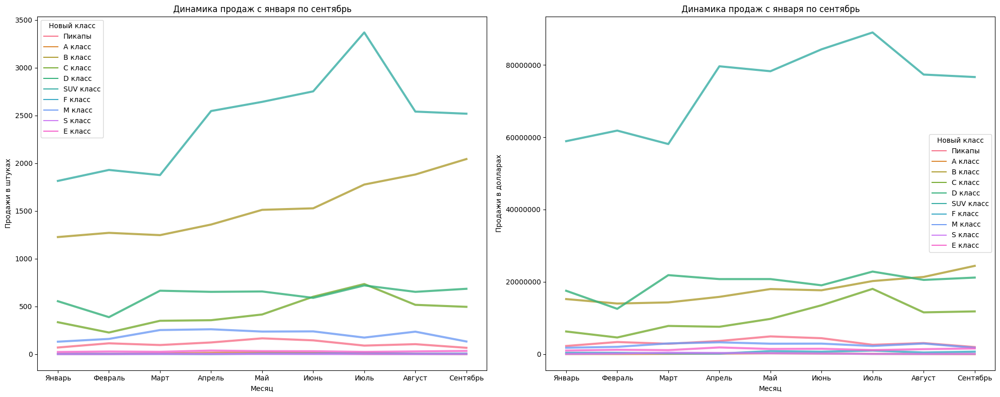

In [248]:
class_names = dynamic_segment_light['Новый_класс'].unique()
class_colors = sns.color_palette("husl", n_colors=len(class_names))

class_color_dict = dict(zip(class_names, class_colors))

plt.figure(figsize=(20, 8))
ax1 = plt.subplot(1, 2, 1)
ax1 = sns.lineplot(y='Количество', x='Месяц', data=dynamic_segment_light, hue='Новый_класс', linewidth=3, alpha=0.8, 
                   palette=class_color_dict)
plt.xlabel('Месяц')
plt.ylabel('Продажи в штуках')
plt.title('Динамика продаж с января по сентябрь')
plt.ticklabel_format(useOffset=False, style='plain', axis='y')
plt.legend(title='Новый класс')


ax2 = plt.subplot(1, 2, 2)
ax2 = sns.lineplot(y='Продажа, USD', x='Месяц', data=dynamic_segment_light, hue='Новый_класс', linewidth=3, alpha=0.8,
                  palette=class_color_dict)
plt.xlabel('Месяц')
plt.ylabel('Продажи в долларах')
plt.title('Динамика продаж с января по сентябрь')
plt.ticklabel_format(useOffset=False, style='plain', axis='y')
plt.legend(title='Новый класс')

plt.tight_layout()
plt.show();

**Вывод: мы видим, что все классы ведут себя примерно одинаково с точки зрения динамики продаж, у всех с весны начинается рост с пиком в июле. SUV класс-безоговорочный лидер рынка.**

#### *Динамика рынка по типам привода*

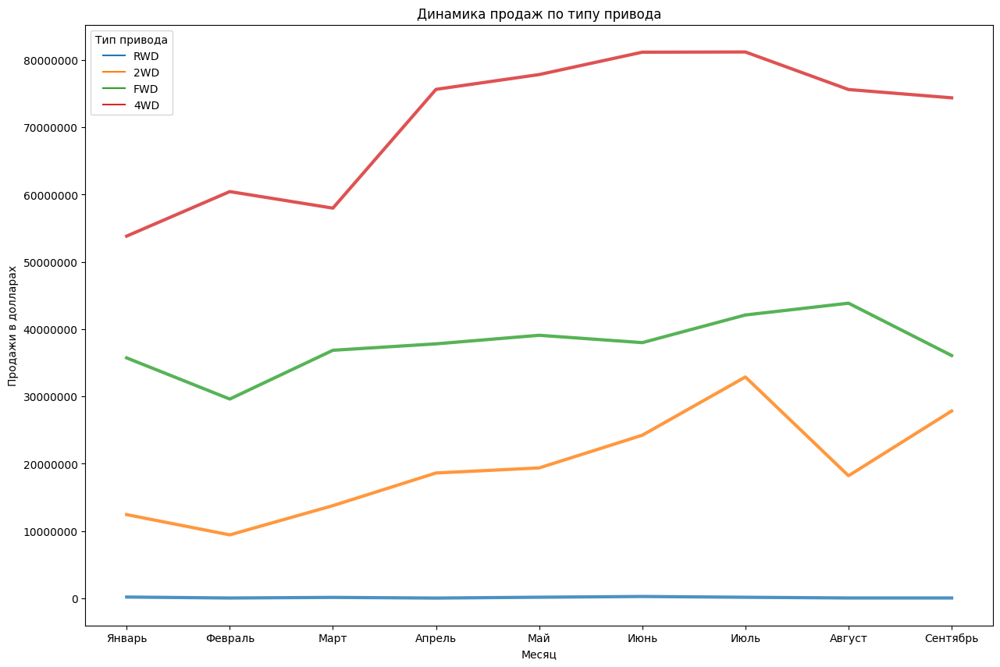

In [249]:
dynamic_car_drive = light_vehicles.pivot_table(index=['Месяц', 'Тип привода'],
                                              values='Продажа, USD',
                                              aggfunc='sum').reset_index()

dynamic_car_drive = order_months(dynamic_car_drive, 'Месяц')


fig, ax = plt.subplots(figsize=(15, 10))
ax=sns.lineplot(y='Продажа, USD', x='Месяц', data=dynamic_car_drive, hue='Тип привода', linewidth=3, alpha=0.8)
plt.xlabel('Месяц')
plt.ylabel('Продажи в долларах')
plt.title('Динамика продаж по типу привода')
plt.ticklabel_format(useOffset=False, style='plain', axis='y')
plt.legend(title='Тип привода')
plt.show()

**Вывод: мы видим, что динамика у всех типов привода примерно одинаковая, различие в том, что у заднеприводных автомобилей пик продаж наблюдается в августе, а не в июле, как у остальных. Автомомбили с полным приводом - лидеры рынка по продажам.**

#### *Динамика рынка по типам коробки передач*

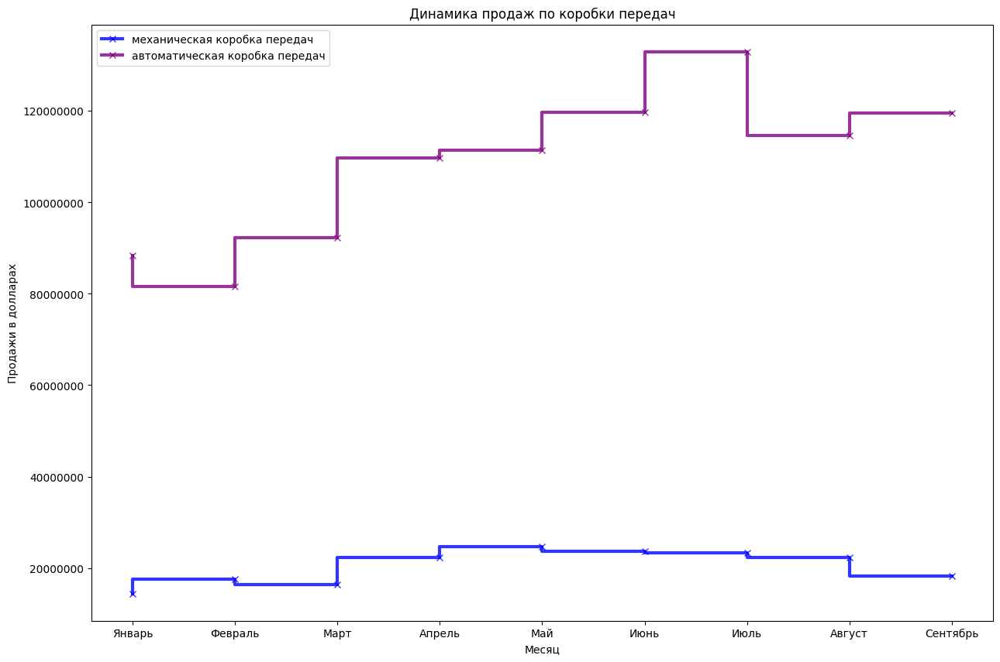

In [250]:
dynamic_transmission = light_vehicles.pivot_table(index=['Месяц', 'Коробка передач'],
                                              values='Продажа, USD',
                                              aggfunc='sum').reset_index()

dynamic_transmission = order_months(dynamic_transmission, 'Месяц')


plt.figure(figsize=(15, 10))
plt.step(x=dynamic_transmission[dynamic_transmission['Коробка передач'] == 'механическая']['Месяц'],
         y=dynamic_transmission[dynamic_transmission['Коробка передач'] == 'механическая']['Продажа, USD'],
         marker='x', linewidth=3, alpha=0.8, color='blue', label='механическая коробка передач')
plt.step(x=dynamic_transmission[dynamic_transmission['Коробка передач'] == 'автоматическая']['Месяц'],
         y=dynamic_transmission[dynamic_transmission['Коробка передач'] == 'автоматическая']['Продажа, USD'],
         marker='x', linewidth=3, alpha=0.8, color='purple', label='автоматическая коробка передач')
plt.legend()
plt.xlabel('Месяц')
plt.ylabel('Продажи в долларах')
plt.title('Динамика продаж по коробки передач')
plt.ticklabel_format(useOffset=False,style='plain', axis='y')
plt.show()

**Вывод: мы видим, что у моделей с механической коробкой передач нет ярко выраженного пика продаж, у моделей с автоматической коробкой передач пик приходится на июль. Также можно заметить, что на рынке легковых автомобилей доминируют модели с АКПП, что логично.**

#### *Динамика рынка по объемам двигателя*

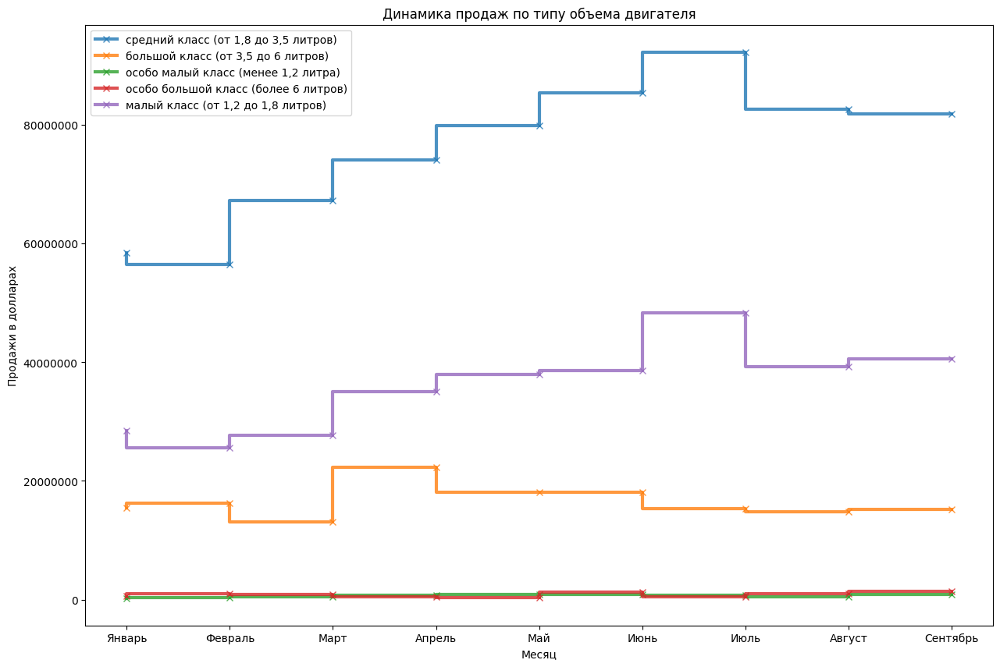

In [251]:
dynamic_engine = light_vehicles.pivot_table(index=['Месяц', 'Тип_двигателя'],
                                              values='Продажа, USD',
                                              aggfunc='sum').reset_index()

dynamic_engine = order_months(dynamic_engine, 'Месяц')


plt.figure(figsize=(15, 10))
for t in dynamic_engine['Тип_двигателя'].unique():
    plt.step(x=dynamic_engine[dynamic_engine['Тип_двигателя'] == t]['Месяц'],
             y=dynamic_engine[dynamic_engine['Тип_двигателя'] == t]['Продажа, USD'],
             marker='x', linewidth=3, alpha=0.8, label=t)
plt.legend()
plt.xlabel('Месяц')
plt.ylabel('Продажи в долларах')
plt.title('Динамика продаж по типу объема двигателя')
plt.ticklabel_format(useOffset=False,style='plain', axis='y')
plt.show()

**Вывод: мы видим, что средний класс объема двигателя абсолютный лидер по продажам, почти у всех классов пик продаж приходится на июль кроме большого класса.**

### Проанализируем продажи автомобилей в разрезе брендов

#### *Проанализируем продажи автомобилей в штуках в разрезе бренд - модель*

**Будем рассматривать только топ-10 брендов по продажам**

In [252]:
brands_count = light_vehicles.pivot_table(index='Бренд',
                                          values='Количество',
                                          aggfunc='sum').reset_index().nlargest(10, 'Количество')['Бренд'].tolist()
brands_count

['Lada',
 'Toyota',
 'Hyundai',
 'Kia',
 'Jac',
 'Renault',
 'Ravon',
 'Nissan',
 'Volkswagen',
 'Lexus']

In [253]:
brands_model_count = light_vehicles.loc[light_vehicles['Бренд'].isin(brands_count)].pivot_table(index=['Бренд', 'Модель'],
                                                                                               values='Количество',
                                                                                               aggfunc='sum').reset_index()
brands_model_count.head()

,Бренд,Модель,Количество
0,Hyundai,Accent,2211.0
1,Hyundai,Creta,1775.0
2,Hyundai,Elantra,2062.0
3,Hyundai,Santa Fe,639.0
4,Hyundai,Sonata,188.0


**Так как моделей очень много, внутри каждого бренда проранжируем все модели по продажам и визуализировать будем только топ-5 моделей каждого бренда.**

In [254]:
brands_model_count["rank"] = brands_model_count.groupby("Бренд")["Количество"].rank(ascending=False)

In [255]:
unique_colors = sns.color_palette("husl", 50)

# Преобразование цветов в формат '#RRGGBB'
marker_color = ['#%02x%02x%02x' % (int(r * 255), int(g * 255), int(b * 255)) for r, g, b in unique_colors]

fig = px.bar(brands_model_count.query('rank < 6').sort_values(by='rank'),
             y='Бренд',
             x='Количество',
             color='Модель',
             color_discrete_sequence=marker_color,
            text='Модель')

# Настройка layout
fig.update_layout(
    title='Бренды-лидеры по продажам и их модели',
    xaxis_title='Продажи в штуках',
    yaxis_title='Бренд',
    yaxis={'categoryorder':'total ascending'},
    height=800,
    width=1000
)

fig.show()

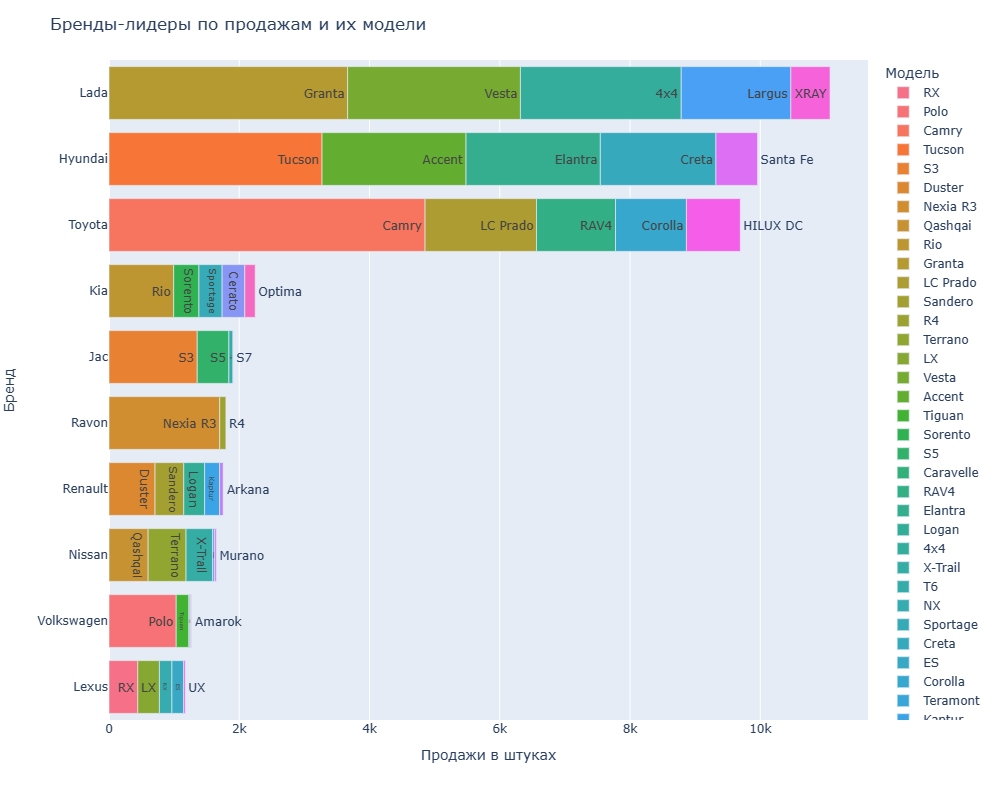

**Вывод: мы видим, что у лидера рынка по продажам в штуках Lada лучше всего продаются модели Granta и Vesta, у Toyota - Camry и LC Prado, а у Hyundai - Tucson, Accent и Elantra.**

#### *Проанализируем продажи автомобилей в долларах в разрезе бренд - модель*

**Будем рассматривать только топ-10 брендов по продажам**

In [256]:
brands_sales = light_vehicles.loc[light_vehicles['Бренд'].isin(best_brands_light)].pivot_table(index=['Бренд', 'Модель'],
                                              values='Продажа, USD',
                                 aggfunc='sum').reset_index()
brands_sales.head()

,Бренд,Модель,"Продажа, USD"
0,BMW,3 серия,122712.0
1,BMW,5 серия,2234831.0
2,BMW,6 серия,53491.0
3,BMW,7 серия,857866.0
4,BMW,8 серия,132584.0


**Так как моделей очень много, внутри каждого бренда проранжируем все модели по продажам и визуализировать будем только топ-5 моделей каждого бренда.**

In [257]:
brands_sales["rank"] = brands_sales.groupby("Бренд")["Продажа, USD"].rank(ascending=False)

In [258]:
unique_colors = sns.color_palette("husl", 50)

# Преобразование цветов в формат '#RRGGBB'
marker_color = ['#%02x%02x%02x' % (int(r * 255), int(g * 255), int(b * 255)) for r, g, b in unique_colors]

fig = px.bar(brands_sales.query('rank < 6').sort_values(by='rank'),
             y='Бренд',
             x='Продажа, USD',
             color='Модель',
             color_discrete_sequence=marker_color,
            text='Модель')

# Настройка layout
fig.update_layout(
    title='Бренды-лидеры по продажам и их модели',
    xaxis_title='Продажи в долларах',
    yaxis_title='Бренд',
    yaxis={'categoryorder':'total ascending'},
    height=800,
    width=1000
)

fig.show()

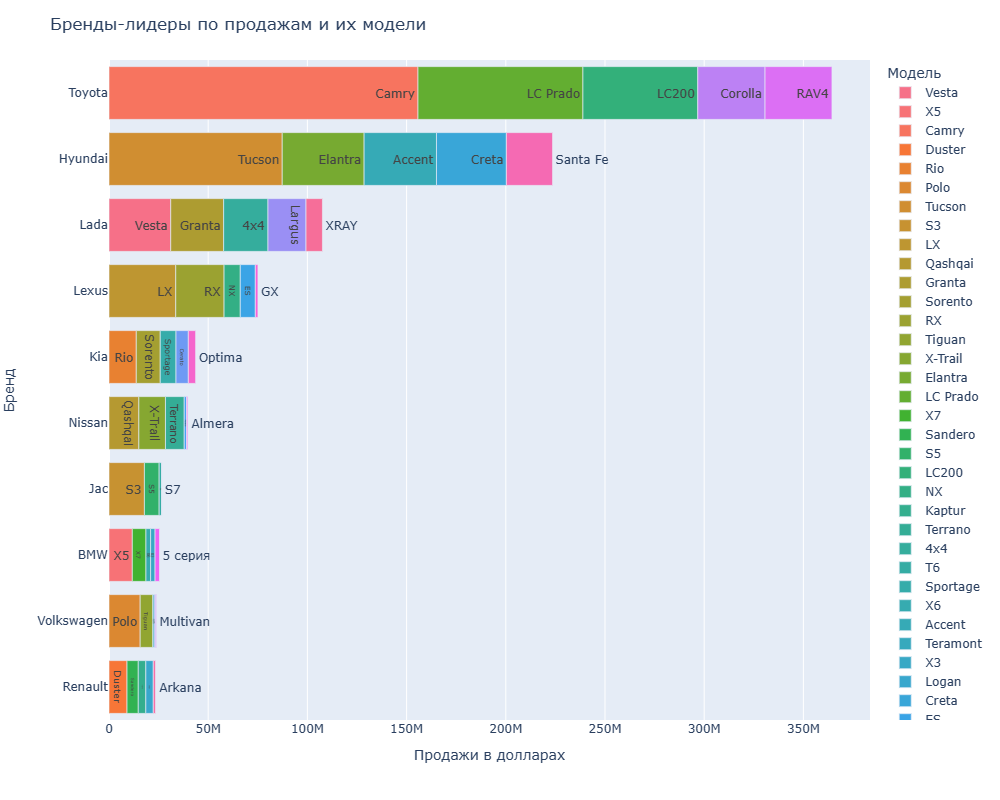

**Вывод: мы видим, что у лидера рынка по продажам в долларах Toyota самые прибыльные модели это Camry и LC Prado, а у Hyundai - Tucson, Accent и Elantra.**

#### *Проанализируем продажи автомобилей в штуках в разрезе бренд - класс автомобиля*

In [259]:
# Создадим функцию, которая будет строить столбчатую диаграмму с учетом столбца rank
def function_plotly(table, x, y, color, color_discrete_map, text, title, xaxis_title):
    fig = px.bar(table.sort_values(by='rank'),
             y=y,
             x=x,
             color=color,
             color_discrete_map=color_discrete_map,
            text=text)
    
    fig.update_layout(
    title=title,
    xaxis_title=xaxis_title,
    yaxis_title=y,
    yaxis={'categoryorder':'total ascending'},
    height=800,
    width=1000)

    fig.show();

In [260]:
class_sales_count_light =\
light_vehicles.loc[light_vehicles['Бренд'].isin(brands_count)].pivot_table(index=['Бренд', 'Новый_класс'],
                                              values='Количество',
                                 aggfunc='sum').reset_index()

class_sales_count_light["rank"] = class_sales_count_light.groupby("Бренд")["Количество"].rank(ascending=False)

In [261]:
class_colors = {
    'D класс': '#1f77b4',
    'E класс': '#ff7f0e',
    'F класс': '#2ca02c',
    'S класс': '#d62728',
    'SUV класс': '#9467bd',
    'B класс': '#8c564b',
    'C класс': '#e377c2',
    'M класс': '#7f7f7f',
    'A класс': '#bcbd22',
    'Пикапы': '#17becf'
}

function_plotly(table=class_sales_count_light, x='Количество', y='Бренд', 
                color='Новый_класс', color_discrete_map=class_colors, 
                text='Количество', 
                title='Бренды-лидеры по продажам и классы автомобилей, в которых они представлены', 
                xaxis_title='Продажи в штуках')

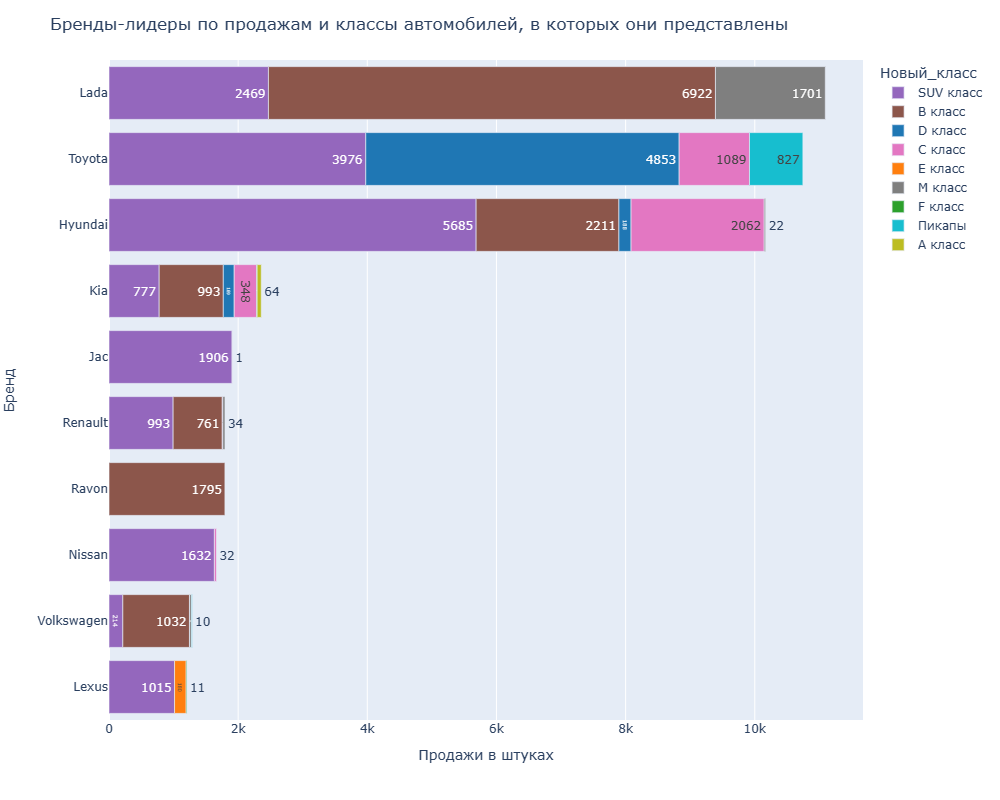

**Вывод: мы видим, что у всех лидеров рынка присутствуют в портфеле автомобили SUV класса, у лидера по продажам в штуках Lada в отличие от других лидеров рынка Toyota и Hyundai, ставка явно сделана на автомобили B класса, что логично, так как они дешевле. Что интересно, у Toyota очень хорошо продаются автомобили D класса, чего не наблюдается у других брендов.**

#### *Проанализируем продажи автомобилей в долларах в разрезе бренд - класс автомобиля*

In [262]:
class_sales_light =\
light_vehicles.loc[light_vehicles['Бренд'].isin(best_brands_light)].pivot_table(index=['Бренд', 'Новый_класс'],
                                              values='Продажа, USD',
                                 aggfunc='sum').reset_index()

class_sales_light["rank"] = class_sales_light.groupby("Бренд")["Продажа, USD"].rank(ascending=False)

In [263]:
function_plotly(table=class_sales_light, x='Продажа, USD', y='Бренд', 
                color='Новый_класс', color_discrete_map=class_colors, 
                text='Продажа, USD', 
                title='Бренды-лидеры по продажам в долларах и классы автомобилей, в которых они представлены', 
                xaxis_title='Продажи в долларах')

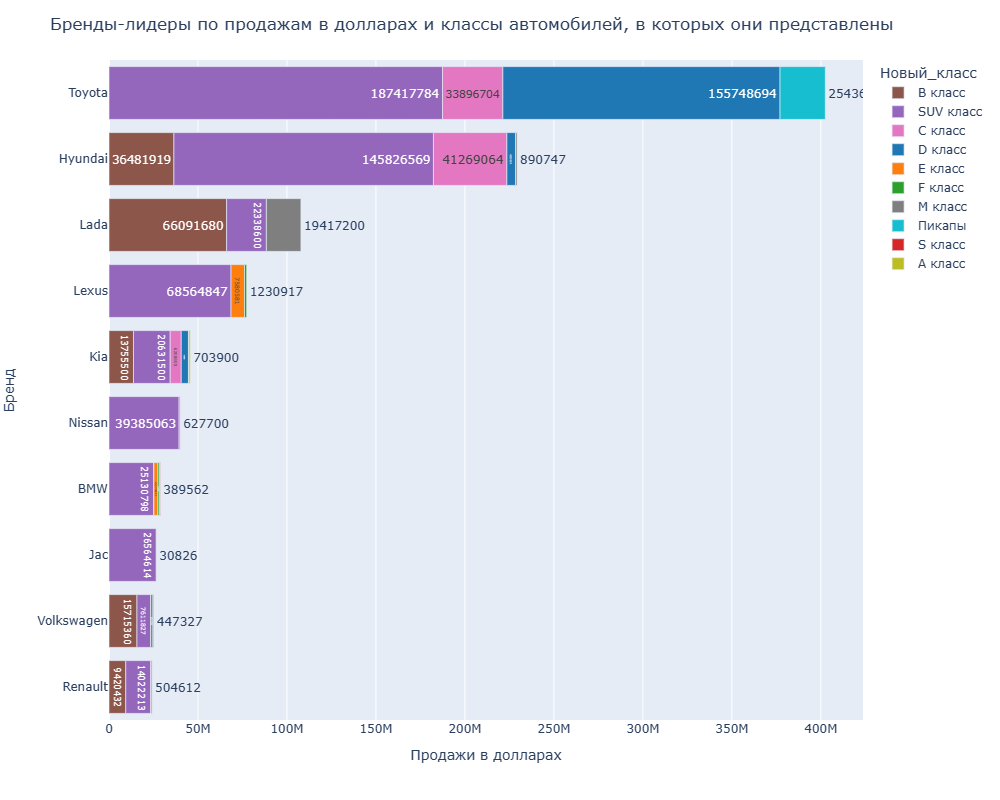

**Вывод: мы видим, что у всех лидеров рынка присутствуют в портфеле автомобили SUV класса, также у Toyota очень хорошо продаются автомобили D класса, чего не наблюдается у других брендов.**

#### *Проанализируем продажи автомобилей в разрезе бренд - тип привода*

In [264]:
# Создадим функцию, которая будет строить столбчатую диаграмму без учета столбца rank
def function_plotly_without_rank(table, x, y, color, color_discrete_map, text, title, xaxis_title):
    fig = px.bar(table,
             y=y,
             x=x,
             color=color,
             color_discrete_map=color_discrete_map,
            text=text)
    
    fig.update_layout(
    title=title,
    xaxis_title=xaxis_title,
    yaxis_title=y,
    yaxis={'categoryorder':'total ascending'},
    height=800,
    width=1000)

    fig.show();

In [265]:
car_drive_sales_light =\
light_vehicles.loc[light_vehicles['Бренд'].isin(best_brands_light)].pivot_table(index=['Бренд', 'Тип привода'],
                                              values='Продажа, USD',
                                 aggfunc='sum').reset_index()

In [266]:
class_colors = {
    '4WD': '#e377c2',
    'FWD': '#7f7f7f',
    '2WD': '#bcbd22',
    'RWD': '#17becf'
}

function_plotly_without_rank(table=car_drive_sales_light,
                             x='Продажа, USD', y='Бренд',
                             color='Тип привода', 
                             color_discrete_map=class_colors, 
                             text='Продажа, USD', 
                             title='Бренды-лидеры по продажам и типы привода', 
                             xaxis_title='Продажи в долларах')

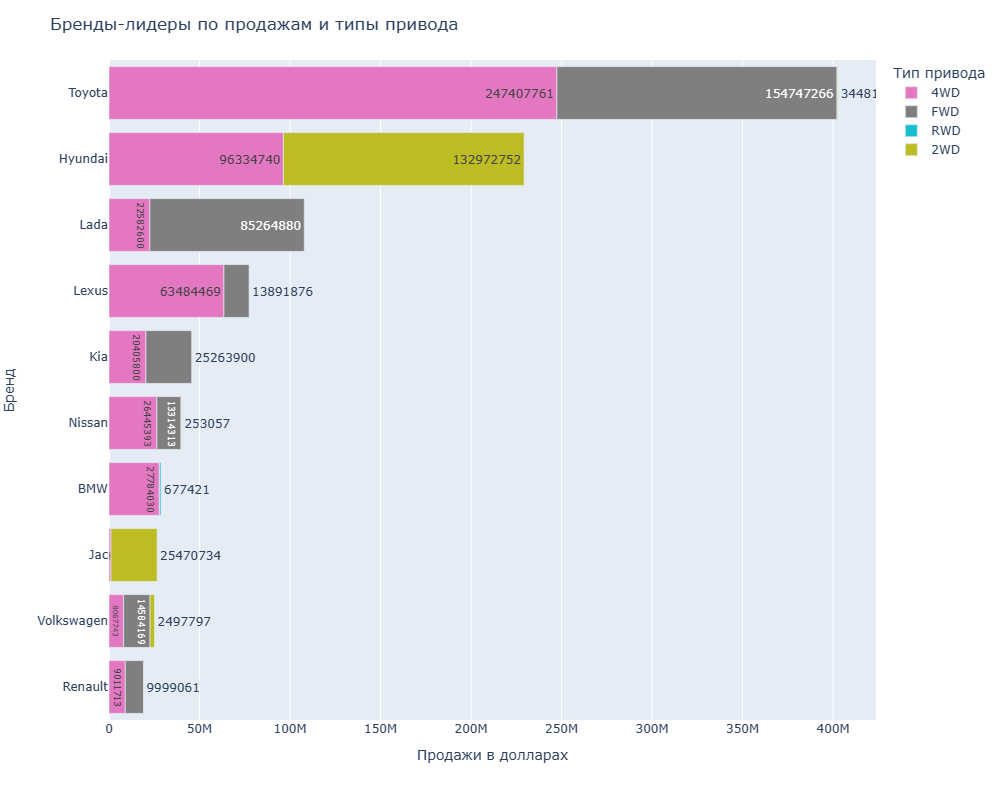

**Вывод: мы видим, что практически у всех лидеров рынка присутствуют в портфеле полноприводные и переднеприводные автомобили, кроме Hundai у которого, помимо полноприводных, представлены еще и автомобили с подключаемым полныи приводом.**

#### *Проанализируем продажи автомобилей в разрезе бренд - тип коробки передач*

In [267]:
transmission_sales_light = light_vehicles.loc[light_vehicles['Бренд'].isin(best_brands_light)].pivot_table(index=['Бренд',
                                                                                                      'Коробка передач'],
                                              values='Продажа, USD',
                                 aggfunc='sum').reset_index()


In [268]:
class_colors = {
    'механическая': '#17becf',
    'автоматическая': '#ff7f0e'
}

function_plotly_without_rank(table=transmission_sales_light,
                             x='Продажа, USD', y='Бренд',
                             color='Коробка передач', 
                             color_discrete_map=class_colors, 
                             text='Продажа, USD', 
                             title='Бренды-лидеры по продажам и типы трансмиссии', 
                             xaxis_title='Продажи в долларах')

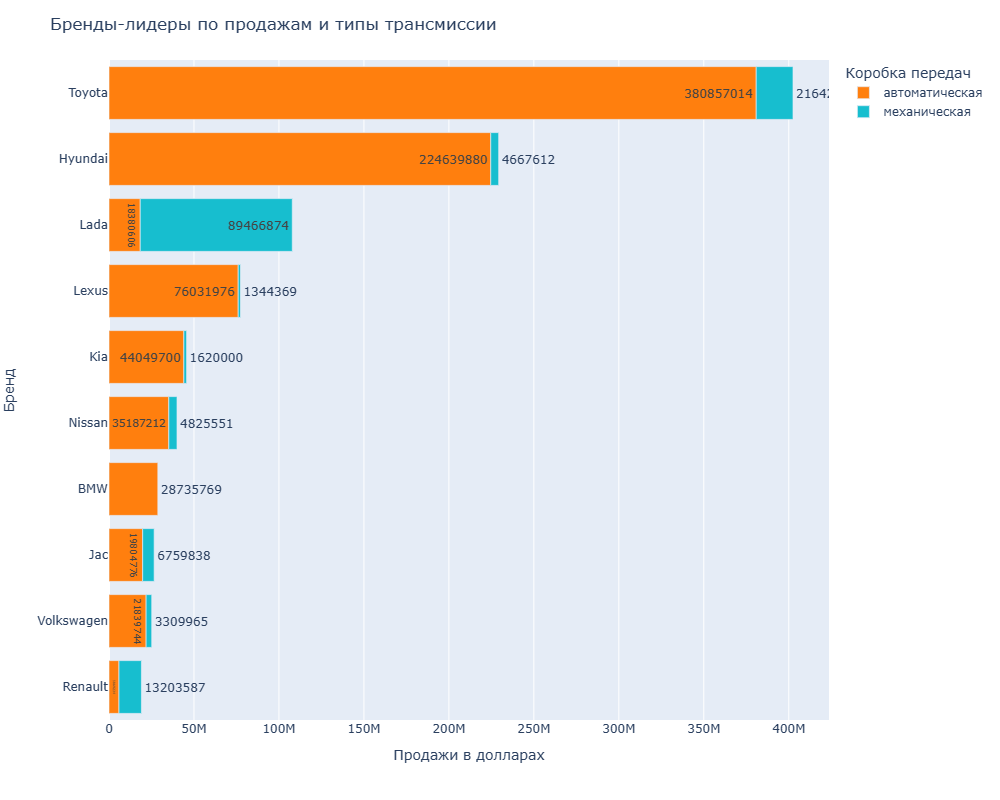

**Вывод: мы видим, что практически у всех лидеров рынка, кроме Lada и Renault в портфеле преобладают автомобили с автоматической коробкой передач.**

#### *Проанализируем продажи автомобилей в разрезе бренд - объем двигателя*

In [269]:
engine_sales_light = light_vehicles.loc[light_vehicles['Бренд'].isin(best_brands_light)].pivot_table(index=['Бренд',
                                                                                               'Тип_двигателя'],
                                              values='Продажа, USD',
                                 aggfunc='sum').reset_index()
engine_sales_light["rank"] = engine_sales_light.groupby("Бренд")["Продажа, USD"].rank(ascending=False)

In [270]:
tones_palette = {'большой класс': 'blue', 'малый класс': 'orange', 'особо большой класс': 'red',
                 'средний класс': 'green', 'особо малый класс': 'purple'}

function_plotly(table=engine_sales_light, x='Продажа, USD', y='Бренд', 
                color='Тип_двигателя', 
                color_discrete_map=tones_palette, 
                text='Продажа, USD', 
                title='Бренды-лидеры по продажам и типы объема двигателя', 
                xaxis_title='Продажи в долларах')

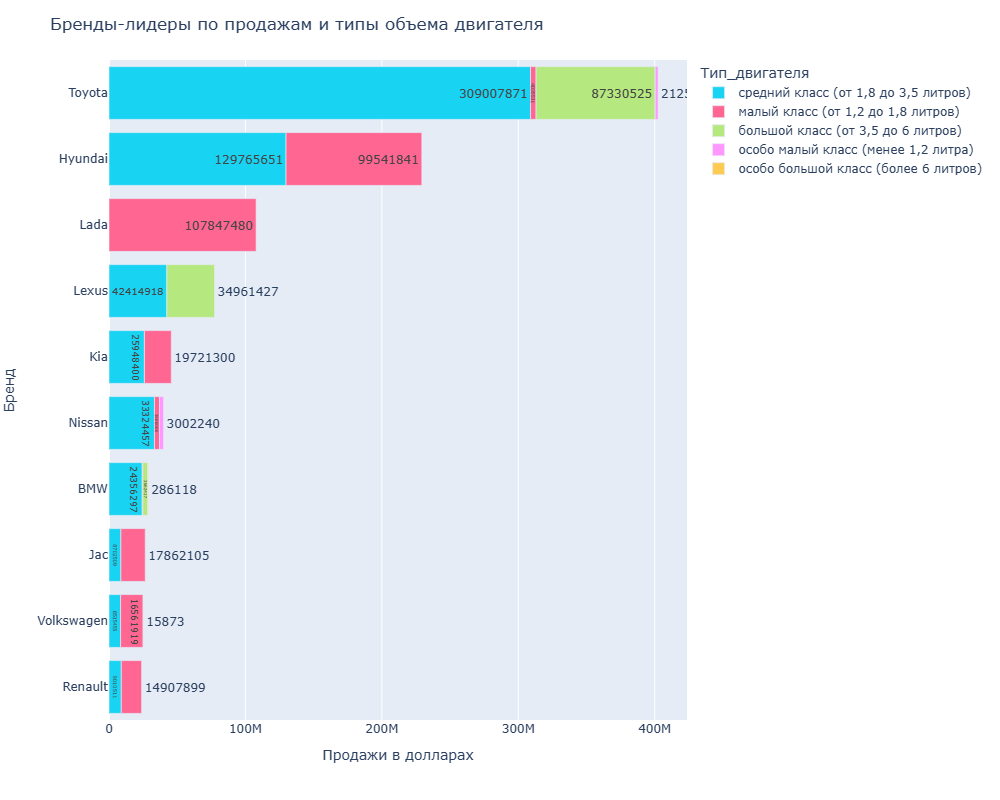

**Вывод: мы видим, что практически у всех лидеров рынка, кроме Lada, Renault, Jac, Volkswagen в портфеле преобладают автомобили со средним классом объема двигателя. Также видна разница в подходе у лидеров рынка Toyota и Hyundai - у Toyota также представлены автомобили с большим классом двигателя, а у Hyundai с малым. Lada специализируется только на автомобилях с малым классом двигателей.**

### Проанализируем продажи по регионам

#### *Проанализируем общие продажи по регионам*

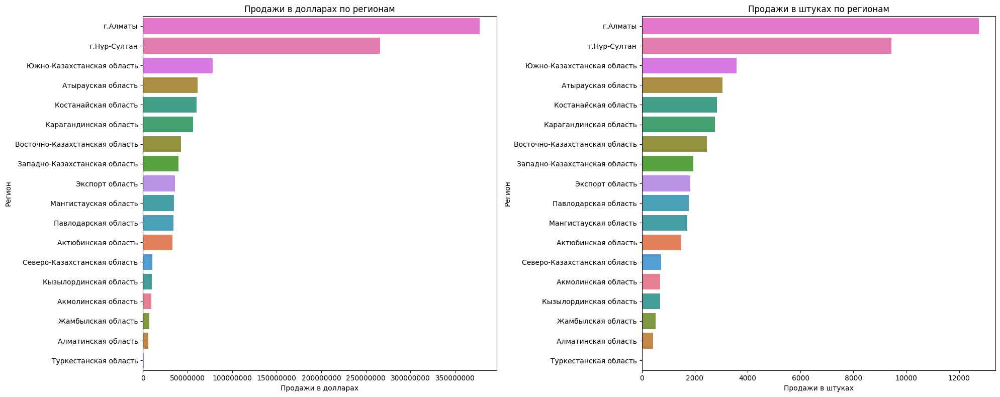

In [271]:
region_sales = light_vehicles.groupby('Область', as_index=False)['Продажа, USD'].agg('sum')
region_sales_count = light_vehicles.groupby('Область', as_index=False)['Количество'].agg('sum')

region_names = region_sales['Область'].unique()
region_colors = sns.color_palette("husl", n_colors=len(region_names))

region_color_dict = dict(zip(region_names, region_colors))



plt.figure(figsize=(20, 8))
ax1 = plt.subplot(1, 2, 1)
ax1 = sns.barplot(y = "Область", x='Продажа, USD',
                 data =region_sales.sort_values(by='Продажа, USD', ascending=False), palette=region_color_dict)
plt.xlabel('Продажи в долларах')
plt.ylabel('Регион')
plt.title('Продажи в долларах по регионам')
plt.ticklabel_format(useOffset=False,style='plain', axis='x')


ax2 = plt.subplot(1, 2, 2)
ax2 = sns.barplot(y = "Область", x='Количество',
                 data =region_sales_count.sort_values(by='Количество', ascending=False), palette=region_color_dict)
plt.xlabel('Продажи в штуках')
plt.ylabel('Регион')
plt.title('Продажи в штуках по регионам')
plt.ticklabel_format(useOffset=False,style='plain', axis='x')

plt.tight_layout()
plt.show();

**Вывод: мы видим, что практически все продажи происходят в двух самых крупных городах - Алматы и Нурсултан, что логично.**

#### *Проанализируем продажи по регионам в разрезе брендов*

In [272]:
region_brands_sales_light = light_vehicles.pivot_table(index=['Область', 'Бренд'],
                                              values='Продажа, USD',
                                 aggfunc='sum').reset_index()

region_brands_sales_light["rank"] = region_brands_sales_light.groupby("Область")["Продажа, USD"].rank(ascending=False)

fig = px.bar(region_brands_sales_light.query('rank < 6').sort_values(by='rank'),
             y='Область',
             x='Продажа, USD',
             color='Бренд',
            text='Продажа, USD')

# Настройка layout
fig.update_layout(
    title='Регионы и бренды-лидеры по продажам',
    xaxis_title='Продажи в долларах',
    yaxis_title='Регион',
    yaxis={'categoryorder':'total ascending'},
    height=800,
    width=1000
)

fig.show()

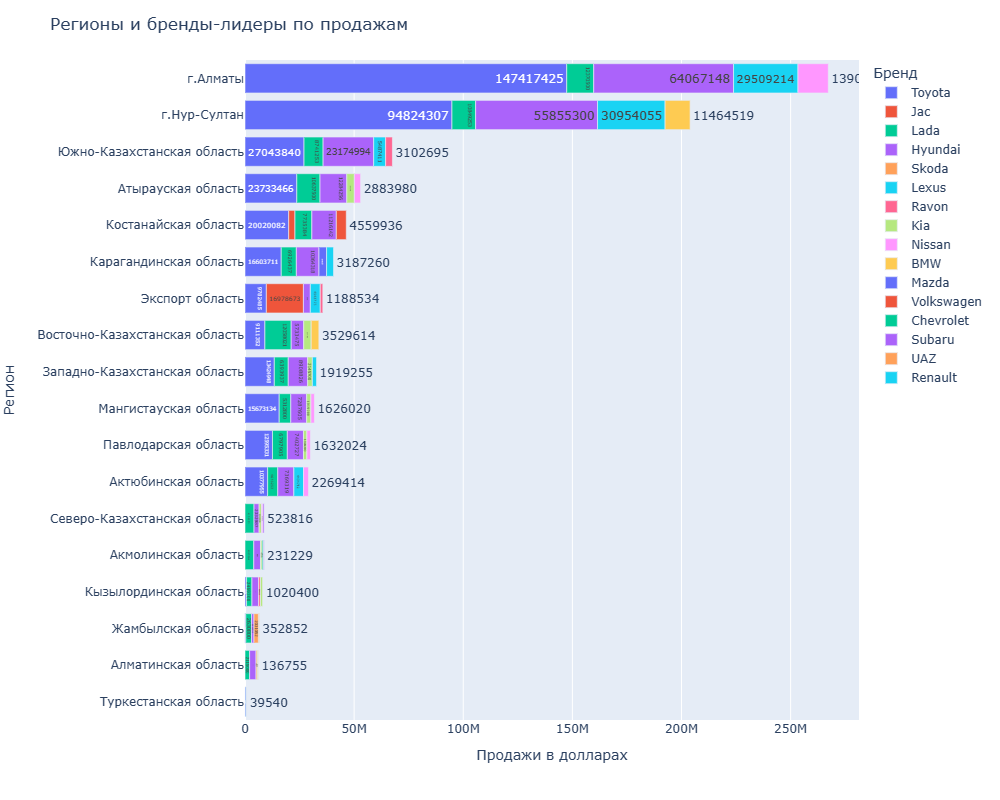

**Вывод: мы видим, что практически во всех регионах Toyota и Hyundai лидеры по продажам, что логично. Различия между городами Нурсултан и Алматы в том, что в Нурсултане в список топ брендов входит BMW, но не входит Nissan и наоборот.**

#### *Проанализируем продажи по регионам в разрезе классов автомобилей*

In [273]:
region_class_sales_light = light_vehicles.pivot_table(index=['Область', 'Новый_класс'],
                                              values='Продажа, USD',
                                 aggfunc='sum').reset_index()
region_class_sales_light["rank"] = region_class_sales_light.groupby("Область")["Продажа, USD"].rank(ascending=False)

class_colors = {
    'D класс': '#1f77b4',
    'E класс': '#ff7f0e',
    'F класс': '#2ca02c',
    'S класс': '#d62728',
    'SUV класс': '#9467bd',
    'B класс': '#8c564b',
    'C класс': '#e377c2',
    'M класс': '#7f7f7f',
    'A класс': '#bcbd22',
    'Пикапы': '#17becf'
}

function_plotly(table=region_class_sales_light, x='Продажа, USD', y='Область', 
                color='Новый_класс', 
                color_discrete_map=class_colors, 
                text='Продажа, USD', 
                title='Регионы и классы автомобилей', 
                xaxis_title='Продажи в долларах')

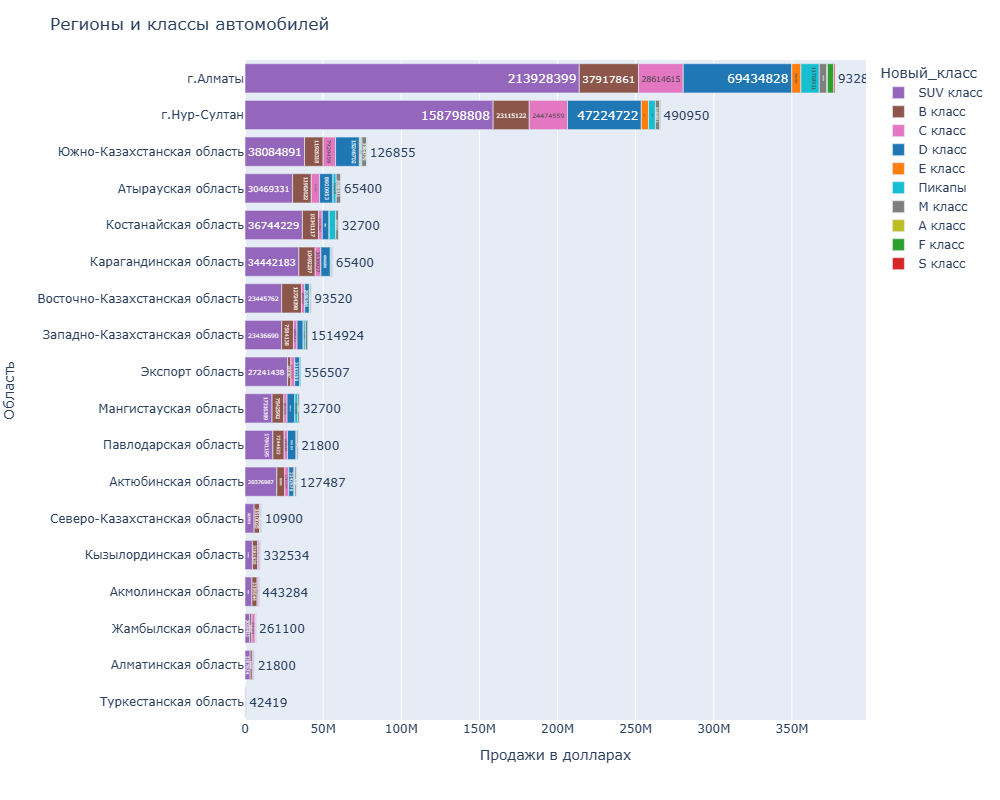

**Вывод: мы видим, что во всех регионах доминируют продажи автомобилей SUV класса.**

#### *Проанализируем продажи по регионам в разрезе типов привода*

In [274]:
region_car_drive_sales_light = light_vehicles.pivot_table(index=['Область', 'Тип привода'],
                                              values='Продажа, USD',
                                 aggfunc='sum').reset_index()

In [275]:
class_colors = {
    '4WD': '#e377c2',
    'FWD': '#7f7f7f',
    '2WD': '#bcbd22',
    'RWD': '#17becf'
}

function_plotly_without_rank(table=region_car_drive_sales_light,
                             x='Продажа, USD', y='Область',
                             color='Тип привода', 
                             color_discrete_map=class_colors, 
                             text='Продажа, USD', 
                             title='Регионы и типы привода', 
                             xaxis_title='Продажи в долларах')

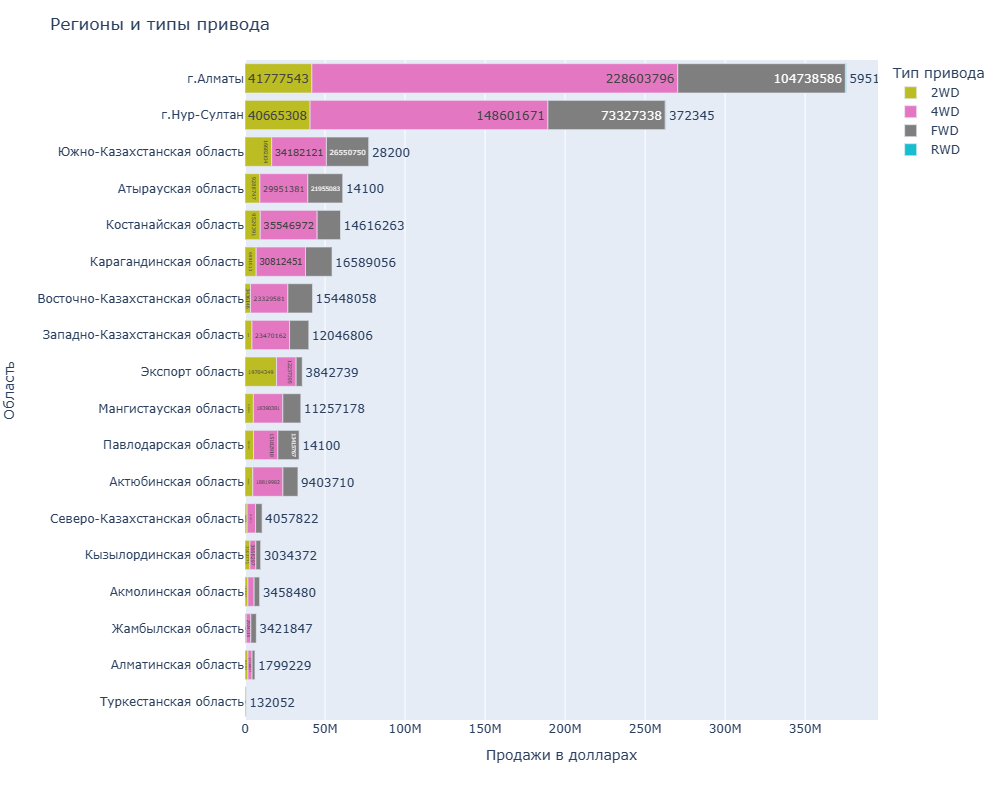

**Вывод: мы видим, что во всех регионах доминируют полноприводные автомобили.**

#### *Проанализируем продажи по регионам в разрезе объемов двигателя*

**Будем сравнивать между собой Нурсултан и Алмату**

In [276]:
region_engine_sales = light_vehicles.pivot_table(index=['Область', 'Тип_двигателя'],
                                              values='Продажа, USD',
                                 aggfunc='sum').reset_index()
region_engine_sales = region_engine_sales.query("Область in ['г.Нур-Султан', 'г.Алматы']")
region_engine_sales

,Область,Тип_двигателя,"Продажа, USD"
64,г.Алматы,"большой класс (от 3,5 до 6 литров)",64292114.0
65,г.Алматы,"малый класс (от 1,2 до 1,8 литров)",69700956.0
66,г.Алматы,особо большой класс (более 6 литров),7358286.0
67,г.Алматы,"особо малый класс (менее 1,2 литра)",2229491.0
68,г.Алматы,"средний класс (от 1,8 до 3,5 литров)",233720382.0
69,г.Нур-Султан,"большой класс (от 3,5 до 6 литров)",38638118.0
70,г.Нур-Султан,"малый класс (от 1,2 до 1,8 литров)",54124073.0
71,г.Нур-Султан,особо большой класс (более 6 литров),21072.0
72,г.Нур-Султан,"особо малый класс (менее 1,2 литра)",1090757.0
73,г.Нур-Султан,"средний класс (от 1,8 до 3,5 литров)",170914432.0


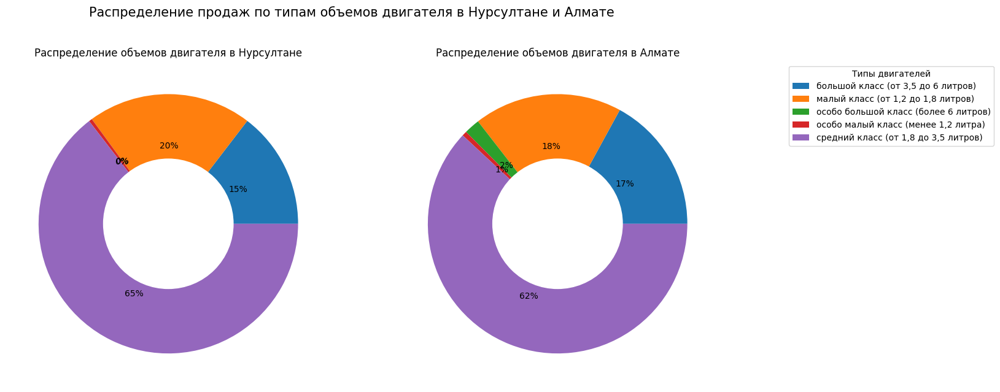

In [277]:
values_1 = region_engine_sales.query('Область == "г.Нур-Султан"')['Продажа, USD'].tolist()
labels_1 = region_engine_sales.query('Область == "г.Нур-Султан"')['Тип_двигателя'].tolist()

values_2 = region_engine_sales.query('Область == "г.Алматы"')['Продажа, USD'].tolist()
labels_2 = region_engine_sales.query('Область == "г.Алматы"')['Тип_двигателя'].tolist()

plt.figure(figsize=(15, 10))
plt.suptitle('Распределение продаж по типам объемов двигателя в Нурсултане и Алмате', fontsize=15, y=0.85)

plt.subplot(1, 2, 1)
plt.pie(values_1, autopct='%.0f%%', labels=None)
plt.title('Распределение объемов двигателя в Нурсултане')
circle_1 = plt.Circle((0, 0), 0.5, color='white')
p = plt.gcf()
p.gca().add_artist(circle_1)

plt.subplot(1, 2, 2)
plt.pie(values_2, autopct='%.0f%%', labels=None)
plt.title('Распределение объемов двигателя в Алмате')
circle_2 = plt.Circle((0, 0), 0.5, color='white')
p = plt.gcf()
p.gca().add_artist(circle_2)
# Добавление легенды
plt.legend(labels_1, title='Типы двигателей', loc='upper left', bbox_to_anchor=(1.2, 1))

plt.show()


**Вывод: мы видим, что принципиальной разницы между городами нет, везде доминирует продажи автомобилей со средним классом двигателей.**

### Проверим гипотезу о том,что стоимость автомобиля зависит от уровня развития региона (средней заработной платы по региону)

In [278]:
# Посчитаем для каждого региона медианную стоимость автомобиля
price_light = light_vehicles.pivot_table(index='Область',values='Цена, USD', aggfunc='median').reset_index()

In [279]:
# К заданию прилагались данные о средней зарплате в регионах Казахстана за 2019 год
salary_dict = {
    'г.Алматы': 224158,
    'г.Нур-Султан': 226796,
    'Восточно-Казахстанская область': 162182,
    'Западно-Казахстанская область': 183914,
    'Костанайская область': 145890,
    'Павлодарская область': 160670,
    'Южно-Казахстанская область': 110254,
    'Мангистауская область': 294099,
    'Атырауская область': 351103,
    'Актюбинская область': 156595,
    'Карагандинская область': 172239,
    'Северо-Казахстанская область': 130233,
    'Акмолинская область': 140272,
    'Кызылординская область': 152085,
    'Жамбылская область': 127043,
    'Туркестанская область': 123853,
    'Алматинская область': 136212
}

salary = pd.DataFrame(list(salary_dict.items()), columns=['Область', 'Зарплата'])

In [280]:
price_light_salary = pd.merge(price_light, salary, left_on='Область', right_on='Область', how='left')
price_light_salary = price_light_salary.query('Область != "Экспорт область"')
price_light_salary

,Область,"Цена, USD",Зарплата
0,Акмолинская область,13800.000,140272.0
1,Актюбинская область,23237.035,156595.0
2,Алматинская область,18153.220,136212.0
3,Атырауская область,24083.740,351103.0
4,Восточно-Казахстанская область,18130.920,162182.0
5,Жамбылская область,12805.555,127043.0
6,Западно-Казахстанская область,24267.740,183914.0
7,Карагандинская область,20081.635,172239.0
8,Костанайская область,21008.680,145890.0
9,Кызылординская область,13800.000,152085.0


**Проверим корреляцию между стоимостью автомобиля и средней заработной платой по региону**

Для этого будем использовать коэффициент корреляции Пирсона. Он помогает определить наличие линейной связи между величинами и принимает значения от -1 до 1. Чем ближе коэффициент корреляции Пирсона к крайним значениям 1 или -1, тем теснее линейная взаимосвязь. Если значение близко к нулю, значит, линейная связь слабая либо отсутствует вовсе.

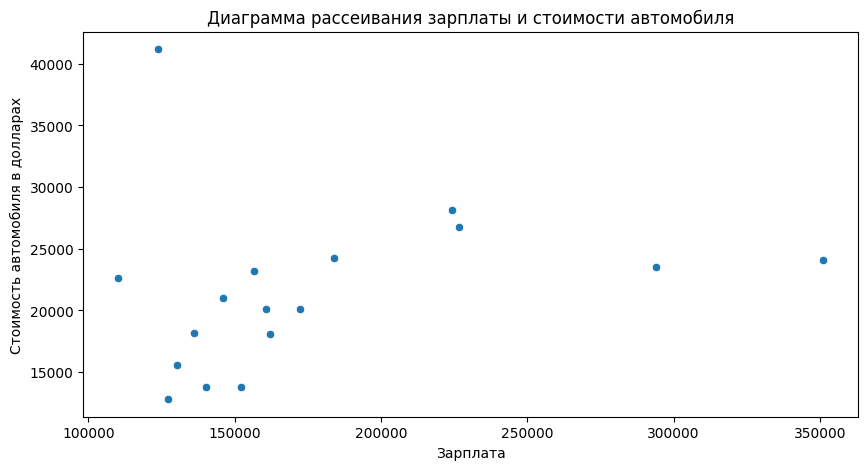

In [281]:
fig, ax = plt.subplots(figsize=(10, 5))
ax = sns.scatterplot(y='Цена, USD', x='Зарплата', data=price_light_salary)
ax.grid(False)
plt.title('Диаграмма рассеивания зарплаты и стоимости автомобиля')
plt.xlabel('Зарплата')
plt.ylabel('Стоимость автомобиля в долларах')
plt.show()

In [282]:
# Для проверки посчитаем коэффициент корреляции
print(price_light_salary['Цена, USD'].corr(price_light_salary['Зарплата']))

0.22082949949594063


**Вывод: мы видим, что нет связи между ценой автомобиля и средней зарплатой в соответствующем регионе.**

### Проанализируем продажи автоцентров

#### *Проанализируем общие продажи автоцентров*

In [283]:
dealer_light = light_vehicles.pivot_table(index='Компания',values='Продажа, USD', aggfunc='sum').reset_index()
dealer_count_light = light_vehicles.pivot_table(index='Компания',values='Количество', aggfunc='sum').reset_index()

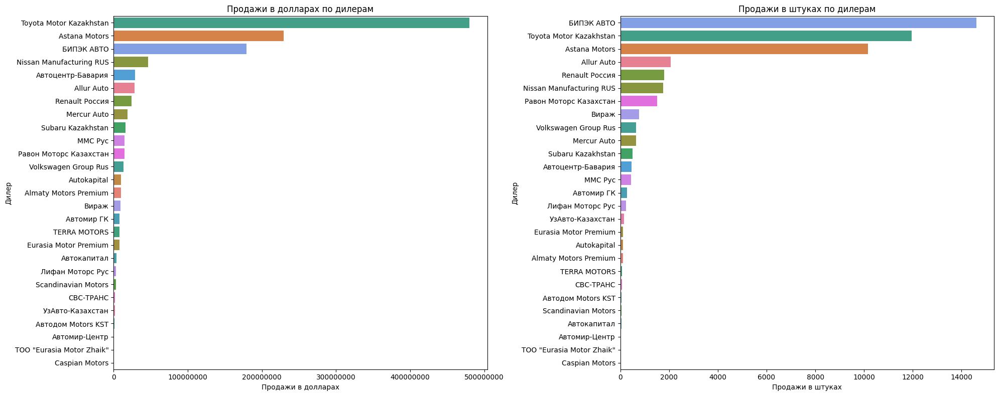

In [284]:
brands = dealer_light['Компания'].unique()
brand_colors = sns.color_palette("husl", n_colors=len(brands))

brand_color_dict = dict(zip(brands, brand_colors))

plt.figure(figsize=(20, 8))
ax1 = plt.subplot(1, 2, 1)
ax1 = sns.barplot(y = "Компания", x='Продажа, USD',
                 data =dealer_light.sort_values(by='Продажа, USD', ascending=False), palette=brand_color_dict)
ax.grid(False)
plt.xlabel('Продажи в долларах')
plt.ylabel('Дилер')
plt.title('Продажи в долларах по дилерам')
plt.ticklabel_format(useOffset=False,style='plain', axis='x')


ax2 = plt.subplot(1, 2, 2)
ax2 = sns.barplot(y = "Компания", x='Количество',
                 data =dealer_count_light.sort_values(by='Количество', ascending=False), palette=brand_color_dict)
ax.grid(False)
plt.xlabel('Продажи в штуках')
plt.ylabel('Дилер')
plt.title('Продажи в штуках по дилерам')
plt.ticklabel_format(useOffset=False,style='plain', axis='x')

plt.tight_layout()
plt.show();

**Вывод: мы видим, что на рынке доминируют три компании: Astana Motors , Toyota Motor Kazakhstan, БИПЭК АВТО.**

#### *Выделим топ-10 дилеров по продажам в долларах и посчитаем для них долю рынка*

In [285]:
# Сохраним названия брендов с лучшими продажами в отдельный список
best_dealers_light = light_vehicles.pivot_table(index='Компания',
                                          values='Продажа, USD',
                                          aggfunc='sum').reset_index().nlargest(10, 'Продажа, USD')['Компания'].tolist()
best_dealers_light

['Toyota Motor Kazakhstan',
 'Astana Motors',
 'БИПЭК АВТО',
 'Nissan Manufacturing RUS',
 'Автоцентр-Бавария',
 'Allur Auto',
 'Renault Россия',
 'Mercur Auto',
 'Subaru Kazakhstan',
 'ММС Рус']

In [286]:
# Всех дилеров, не относящихся к топам переименуем в остальные
dealer_light.loc[~dealer_light['Компания'].isin(best_dealers_light), 'Компания'] = "Остальные"

In [287]:
pastel_colors = px.colors.qualitative.Pastel

fig = go.Figure(data=[go.Pie(labels=dealer_light['Компания'],
                            values=dealer_light['Продажа, USD'],
                            hole=0.5,
                            textinfo='label+value+percent',
                            marker=dict(colors=pastel_colors))])

fig.update_layout(title={'text': "Дилеры лидеры рынка легковых автомобилей"},
                  height=800,
                  width=800)

fig.show()


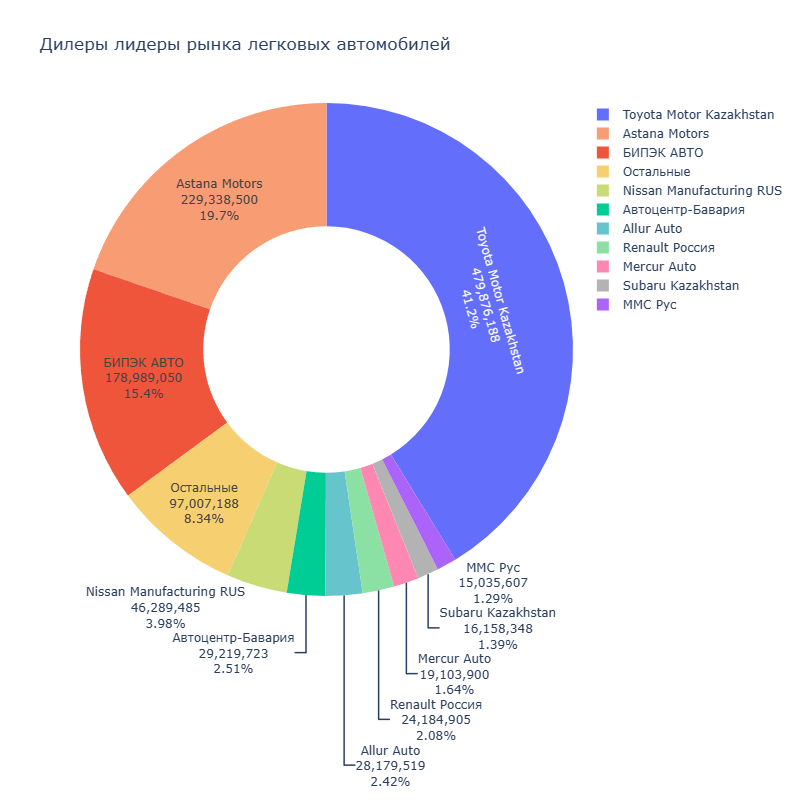

**Вывод: Toyota Motor Kazakhstan - безоговорочный лидер рынка легковых автомобилей.**

#### *Проанализируем динамику продаж топ-10 дилеров*

In [288]:
best = light_vehicles.loc[light_vehicles['Компания'].isin(best_dealers_light)]

In [289]:
best = best.pivot_table(index=['Месяц', 'Компания'], values='Продажа, USD',
                                              aggfunc='sum').reset_index()
best['Месяц'] = best['Месяц'].map(month_order)

best=best.sort_values(by='Месяц')
# Восстанавливаем исходный порядок месяцев
best['Месяц'] = best['Месяц'].map({v: k for k, v in month_order.items()})

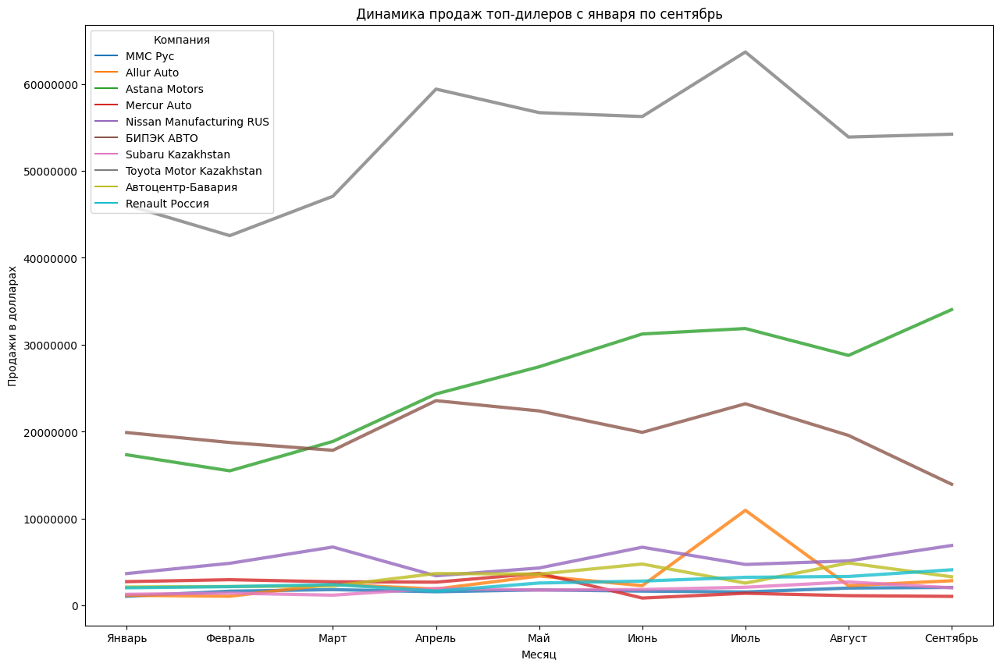

In [290]:
fig, ax = plt.subplots(figsize=(15, 10))
ax = sns.lineplot(y='Продажа, USD', x='Месяц', data=best, hue='Компания', linewidth=3, alpha=0.8)
plt.xlabel('Месяц')
plt.ylabel('Продажи в долларах')
plt.title('Динамика продаж топ-дилеров с января по сентябрь')
plt.ticklabel_format(useOffset=False, style='plain', axis='y')
plt.legend(title='Компания')
ax.grid(False)
plt.show()

**Вывод: у большинства дилеров наблюдается пик продаж в июле и апреле.**

#### *Проанализируем какими брендами занимаются дилеры*

In [291]:
brand_dealer_light = light_vehicles.pivot_table(index=['Бренд', 'Компания'], values='Продажа, USD',
                                              aggfunc='sum').reset_index()

**Визуализируем полученные данные. Объем круга равен объему продаж: чем больше круг, тем выше продажи**

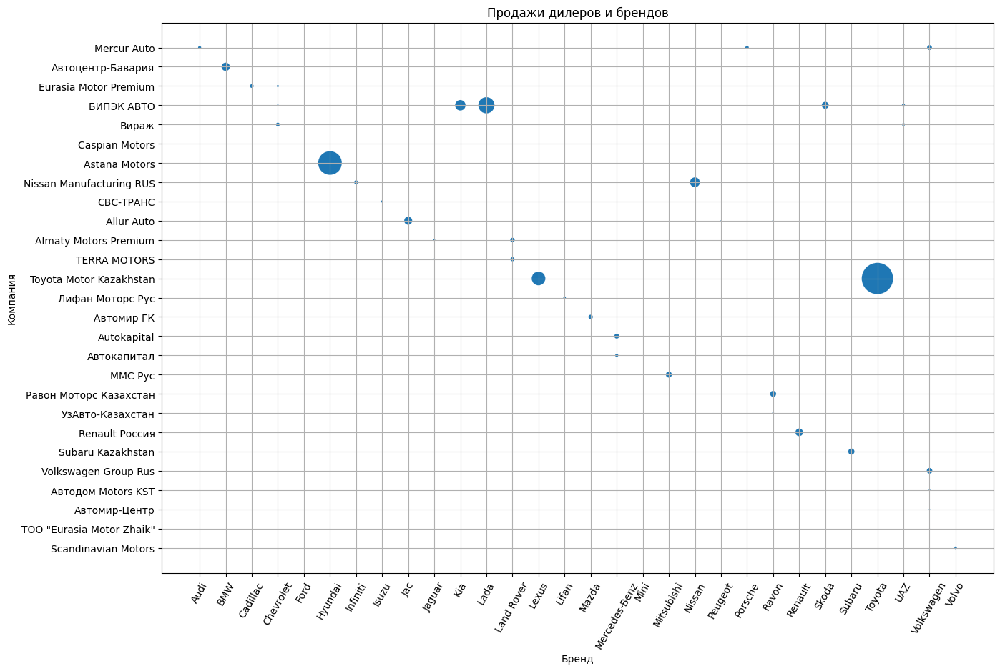

In [292]:
fig, ax = plt.subplots(figsize=(15, 10))
ax = sns.scatterplot(x='Бренд', y='Компания', data=brand_dealer_light , size='Продажа, USD', legend=False, sizes=(0, 1000))
plt.xlabel('Бренд')
plt.ylabel('Компания')
plt.title('Продажи дилеров и брендов')
plt.xticks(rotation=60)
ax.grid(True)
plt.show()

**Вывод: мы видим трех основных игроков на рынке и бренды за счет которых они развивают свои продажи**:
- Toyota Motor Kazakhstan - занимаются брендами Toyota и Lexus
- Astana Motors - занимаются брендом Hyundai
- БИПЭК АВТО - занимаются брендами Kia, Lada и Renault

#### *Проанализируем в каких регионах торгуют дилеры, представленные в таблице*

In [293]:
region_dealer_light = light_vehicles.pivot_table(index=['Область', 'Компания'], values='Продажа, USD',
                                              aggfunc='sum').reset_index()

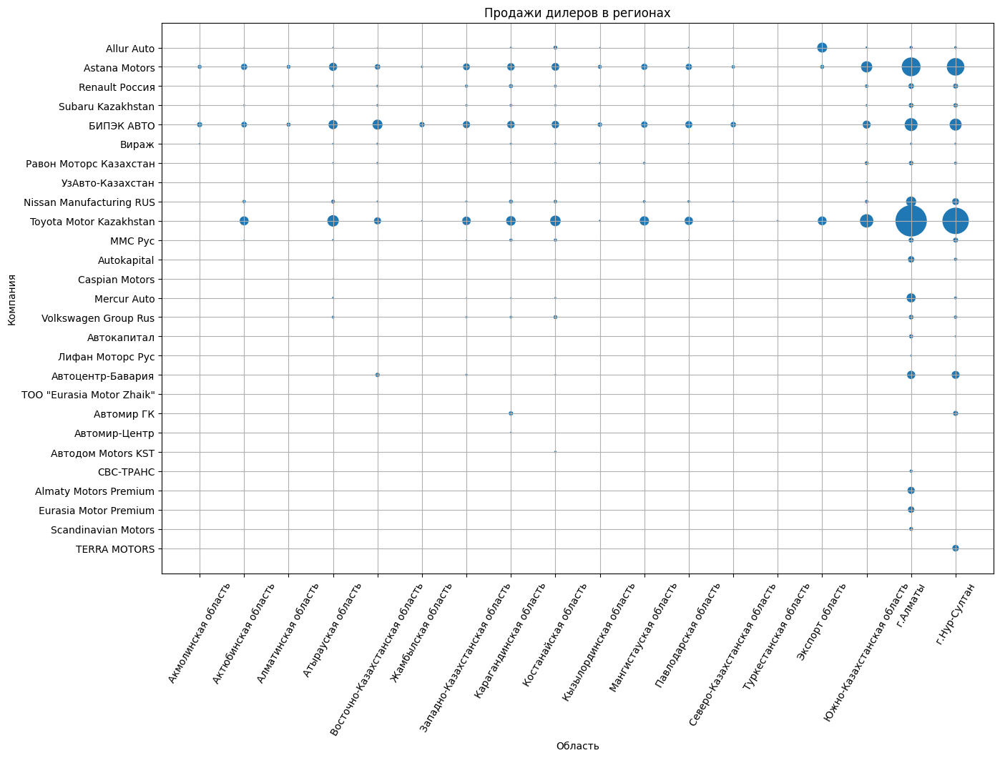

In [294]:
fig, ax = plt.subplots(figsize=(15, 10))
ax = sns.scatterplot(x='Область', y='Компания', data=region_dealer_light, size='Продажа, USD', legend=False, sizes=(0, 1000))
plt.xlabel('Область')
plt.ylabel('Компания')
plt.title('Продажи дилеров в регионах')
plt.xticks(rotation=60)
ax.grid(True)
plt.show()

**Вывод: мы видим, что все три основных игрока на рынке продают автомобили по всей стране и имеют наибольшие продажи в Алмате и Нурсултане, что логично.
Соответственно, Алмата и Нурсултан - самые насыщенные регионы с точки зрения представленности дилеров.**

### Выделим модели-лидеры на рынке

In [295]:
light_vehicles['Новое_значение'] = light_vehicles['Бренд'] + ' ' + light_vehicles['Модель']

In [296]:
models = light_vehicles.pivot_table(index='Новое_значение', values='Продажа, USD',
                                              aggfunc='sum').reset_index()
models = models.sort_values(by='Продажа, USD', ascending=False).head(10)
models

,Новое_значение,"Продажа, USD"
150,Toyota Camry,155748694.0
40,Hyundai Tucson,87315626.0
154,Toyota LC Prado,83134048.0
155,Toyota LC200,57893775.0
36,Hyundai Elantra,41269064.0
34,Hyundai Accent,36481919.0
35,Hyundai Creta,35222303.0
151,Toyota Corolla,33896704.0
156,Toyota RAV4,33725122.0
83,Lexus LX,33640552.0


In [297]:
models_count = light_vehicles.pivot_table(index='Новое_значение', values='Количество',
                                              aggfunc='sum').reset_index()
models_count = models_count.sort_values(by='Количество', ascending=False).head(10)
models_count

,Новое_значение,Количество
150,Toyota Camry,4853.0
68,Lada Granta,3664.0
40,Hyundai Tucson,3271.0
71,Lada Vesta,2653.0
67,Lada 4x4,2469.0
34,Hyundai Accent,2211.0
36,Hyundai Elantra,2062.0
35,Hyundai Creta,1775.0
154,Toyota LC Prado,1711.0
131,Ravon Nexia R3,1700.0


In [298]:
labels_1 = models['Новое_значение'].tolist()
labels_2 = models_count['Новое_значение'].tolist()

# Получение списка уникальных компаний
unique_models = pd.Series(list(set(labels_1) | set(labels_2)))

# Создание словаря цветов только для уникальных компаний
colors = sns.color_palette("husl", n_colors=len(unique_models))
models_color_dict = dict(zip(unique_models, colors))

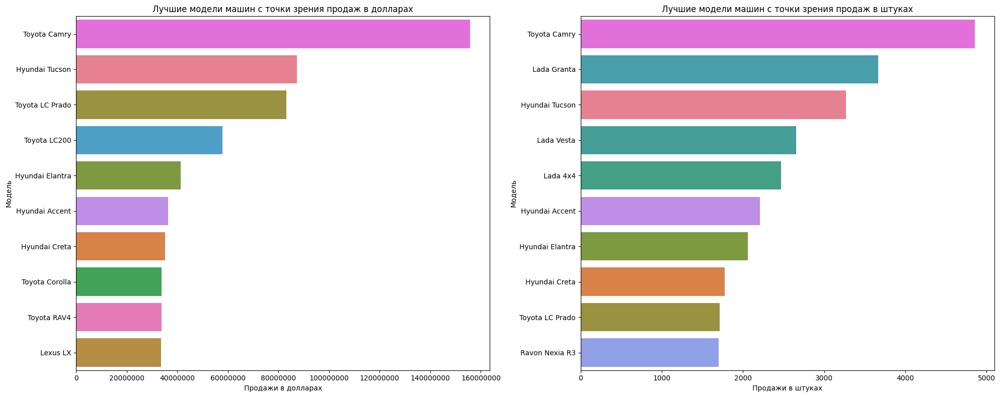

In [299]:
plt.figure(figsize=(20, 8))
ax1 = plt.subplot(1, 2, 1)
ax1 = sns.barplot(y = "Новое_значение", x='Продажа, USD',
                 data =models.sort_values(by='Продажа, USD', ascending=False), palette=models_color_dict)
ax.grid(False)
plt.xlabel('Продажи в долларах')
plt.ylabel('Модель')
plt.title('Лучшие модели машин с точки зрения продаж в долларах')
plt.ticklabel_format(useOffset=False,style='plain', axis='x')


ax2 = plt.subplot(1, 2, 2)
ax2 = sns.barplot(y = "Новое_значение", x='Количество',
                 data = models_count.sort_values(by='Количество', ascending=False), palette=models_color_dict)
ax.grid(False)
plt.xlabel('Продажи в штуках')
plt.ylabel('Модель')
plt.title('Лучшие модели машин с точки зрения продаж в штуках')
plt.ticklabel_format(useOffset=False,style='plain', axis='x')

plt.tight_layout()
plt.show();

**Вывод: Toyota Camry - безоговорочный лидер рынка легковых автомобилей по продажам в долларах и штуках. В лидеры по продажам в штуках добавились модели Lada, в остальном в лидерах по-прежнему модели Toyota и Hyundai, что логично.**

#### *Проанализируем стоимость брендов легковых автомобилей*

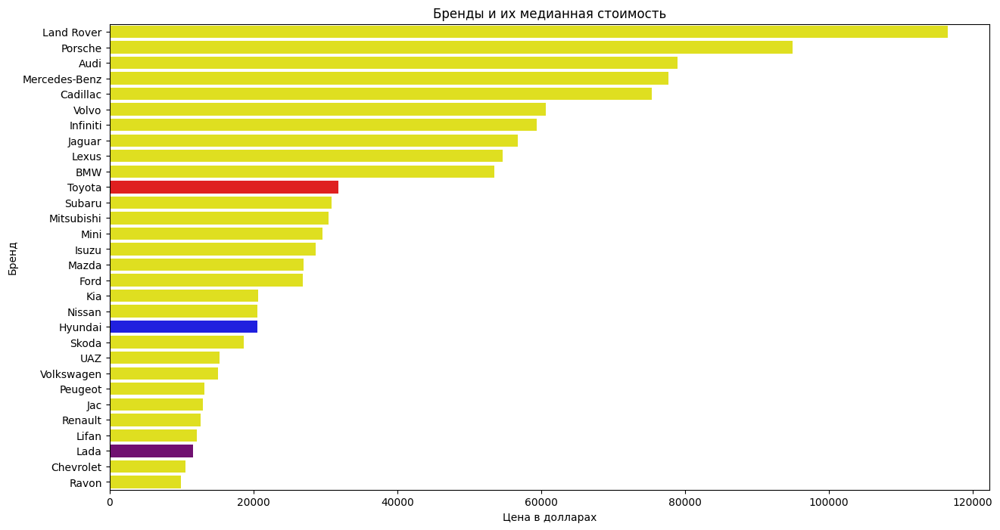

In [300]:
price_light = light_vehicles.pivot_table(index='Бренд', values='Цена, USD', aggfunc='median').reset_index()

brand_palette = {brand: 'yellow' for brand in price_light['Бренд'].unique()}
brand_palette['Toyota'] = 'red'
brand_palette['Hyundai'] = 'blue'
brand_palette['Lada'] = 'purple'

# Строим график
fig, ax = plt.subplots(figsize=(15, 8))
ax = sns.barplot(y="Бренд", x='Цена, USD',
                 data=price_light.sort_values(by='Цена, USD', ascending=False),
                 palette=brand_palette)

ax.grid(False)
plt.xlabel('Цена в долларах')
plt.ylabel('Бренд')
plt.title('Бренды и их медианная стоимость')
plt.ticklabel_format(useOffset=False, style='plain', axis='x')
plt.show();

**Вывод: мы видим, что Lada является одним из лидеров рынка, в том числе из-за своей сравнительно невысокой цены. Toyota, Hyundai - скорее умеренные по цене бренды. Также надо отметить, что подобное сравнение достаточно условное, так как каждый бренд занимается своими классами автомобилей, значительно отличающиеся друг от друга по специфике и цене.**

### Промежуточный вывод: на данном этапе мы провели анализ рынка легковых автомобилей. Нам удалось установить следующее:
1. фактическая емкость рынка легковых автомобилей Казахстана в 2019 году на сентябрь составляет 48 629 штук и 1 163 382 320 долларов соответственно.
2. Lada, Toyota и Hyundai - лидеры рынка легковых автомобилей, как по продажам в штуках, так и в долларах.
3. пик продаж пришелся на июль, в первом квартале продаж практически не было, что логично из-за новогодних праздников и в целом начала года.
4. все классы ведут себя примерно одинаково с точки зрения динамики продаж, у всех с весны начинается рост с пиком в июле. SUV класс-безоговорочный лидер рынка.
5. динамика у всех типов привода примерно одинаковая, различие в том, что у заднеприводных автомобилей пик продаж наблюдается в августе, а не в июле, как у остальных. Автомомбили с полным приводом - лидеры рынка по продажам.
6. у моделей с механической коробкой передач нет ярко выраженного пика продаж, у моделей с автоматической коробкой передач пик приходится на июль. Также можно заметить, что на рынке легковых автомобилей доминируют модели с АКПП, что логично.
7. средний класс объема двигателя абсолютный лидер по продажам, почти у всех классов пик продаж приходится на июль кроме большого класса.
8. у лидера рынка по продажам в штуках Lada лучше всего продаются модели Granta и Vesta, у Toyota - Camry и LC Prado, а у Hyundai - Tucson, Accent и Elantra.
9. у лидера рынка по продажам в долларах Toyota самые прибыльные модели это Camry и LC Prado, а у Hyundai - Tucson, Accent и Elantra.
10. у всех лидеров рынка присутствуют в портфеле автомобили SUV класса, у лидера по продажам в штуках Lada в отличие от других лидеров рынка Toyota и Hyundai, ставка явно сделана на автомобили B класса, что логично, так как они дешевле. Что интересно, у Toyota очень хорошо продаются автомобили D класса, чего не наблюдается у других брендов.
11. практически у всех лидеров рынка присутствуют в портфеле полноприводные и переднеприводные автомобили, кроме Hundai у которого, помимо полноприводных, представлены еще и автомобили с подключаемым полныи приводом.
12. практически у всех лидеров рынка, кроме Lada и Renault в портфеле преобладают автомобили с автоматической коробкой передач.
13. практически у всех лидеров рынка, кроме Lada, Renault, Jac, Volkswagen в портфеле преобладают автомобили со средним классом объема двигателя. Также видна разница в подходе у лидеров рынка Toyota и Hyundai - у Toyota также представлены автомобили с большим классом двигателя, а у Hyundai с малым. Lada специализируется только на автомобилях с малым классом двигателей.
14. практически все продажи происходят в двух самых крупных городах - Алматы и Нурсултан, что логично.
15. нет связи между ценой автомобиля и средней зарплатой в соответствующем регионе.
16. на рынке доминируют три компании: Astana Motors , Toyota Motor Kazakhstan, БИПЭК АВТО. Toyota Motor Kazakhstan - безоговорочный лидер рынка легковых автомобилей.
- Toyota Motor Kazakhstan - занимаются брендами Toyota и Lexus
- Astana Motors - занимаются брендом Hyundai
- БИПЭК АВТО - занимаются брендами Kia, Lada и Renault
17. все три основных игрока на рынке продают автомобили по всей стране и имеют наибольшие продажи в Алмате и Нурсултане, что логично. Соответственно, Алмата и Нурсултан - самые насыщенные регионы с точки зрения представленности дилеров.
18. Toyota Camry - безоговорочный лидер рынка легковых автомобилей по продажам в штуках и долларах


## Шаг 7. Анализ рынка коммерческих автомобилей

### Рассчитаем емкость рынка автомобилей: в денежном и количественном выражениях

In [301]:
commercial_vehicles = data_new.query('Новый_сегмент == "Коммерческий транспорт"')

In [302]:
commercial_vehicles['Количество'].sum()

5246.0

In [303]:
commercial_vehicles['Продажа, USD'].sum()

185811897.0

**Вывод: фактическая емкость рынка коммерческих автомобилей Казахстана в 2019 году на сентябрь составляет 5 246 штук и 185 811 884 долларов соответственно.**

In [304]:
round(commercial_vehicles['Количество'].sum() + 0.4 * (commercial_vehicles['Количество'].sum()), 0)

7344.0

In [305]:
round(commercial_vehicles['Продажа, USD'].sum() + 0.4 * commercial_vehicles['Продажа, USD'].sum(), 0)

260136656.0

**Вывод: прогнозная емкость рынка коммерческих автомобилей Казахстана в 2019 году на сентябрь составляет 7 344 штук и 260 136 638 долларов соответственно.**

### Найдем марки лидеры на рынке автомобилей

In [306]:
top_brands_commercial = commercial_vehicles.pivot_table(index='Бренд',
                                              values='Продажа, USD',
                                              aggfunc='sum').reset_index()

best_brands_commercial = commercial_vehicles.pivot_table(index='Бренд',
                                              values='Продажа, USD',
                                              aggfunc='sum').reset_index().nlargest(10, 'Продажа, USD')['Бренд'].tolist()

top_brands_commercial.loc[~top_brands_commercial['Бренд'].isin(best_brands_commercial), 'Бренд'] = "Остальные"

In [307]:
fig = go.Figure(data=[go.Pie(labels=top_brands_commercial['Бренд'],
                            values=top_brands_commercial['Продажа, USD'],
                            hole=0.5,
                            textinfo='label+value+percent',
                            marker=dict(colors=pastel_colors))])

fig.update_layout(title={'text': "Марки лидеры среди коммерческих автомобилей по продажам в долларах"},
                  height=800,
                  width=800)

fig.show()

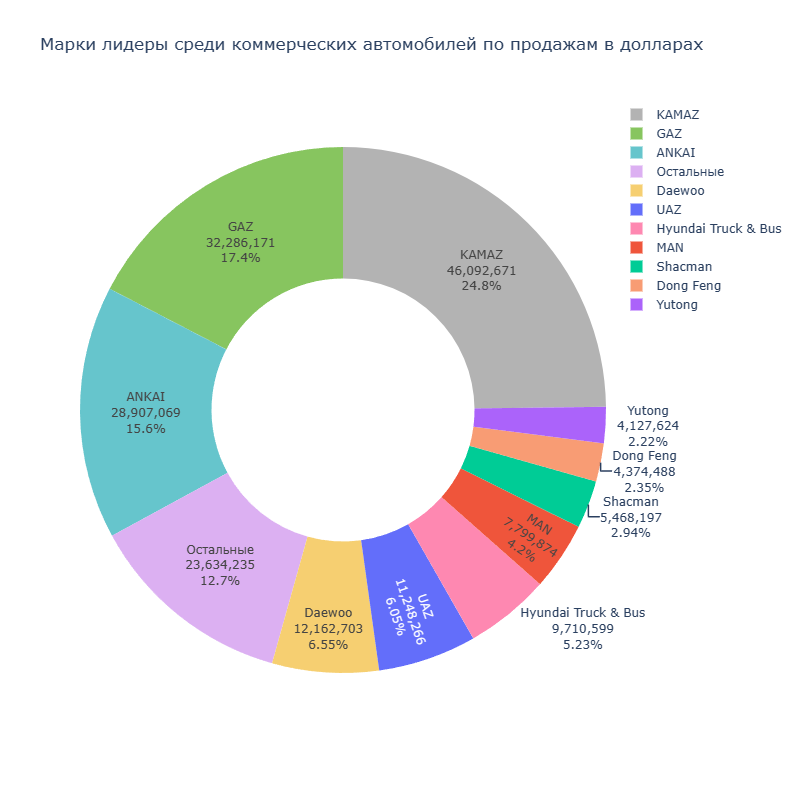

In [308]:
top_brands_count_commercial = commercial_vehicles.pivot_table(index='Бренд',
                                              values='Количество',
                                              aggfunc='sum').reset_index()

best_brands_count_commercial = commercial_vehicles.pivot_table(index='Бренд',
                                              values='Количество',
                                              aggfunc='sum').reset_index().nlargest(10, 'Количество')['Бренд'].tolist()

top_brands_count_commercial.loc[~top_brands_count_commercial['Бренд'].isin(best_brands_count_commercial), 'Бренд'] = "Остальные"

In [309]:
fig = go.Figure(data=[go.Pie(labels=top_brands_count_commercial['Бренд'],
                            values=top_brands_count_commercial['Количество'],
                            hole=0.5,
                            textinfo='label+value+percent',
                            marker=dict(colors=pastel_colors))])

fig.update_layout(title={'text': "Марки лидеры среди коммерческих автомобилей по продажам в штуках"},
                  height=800,
                  width=800)

fig.show()

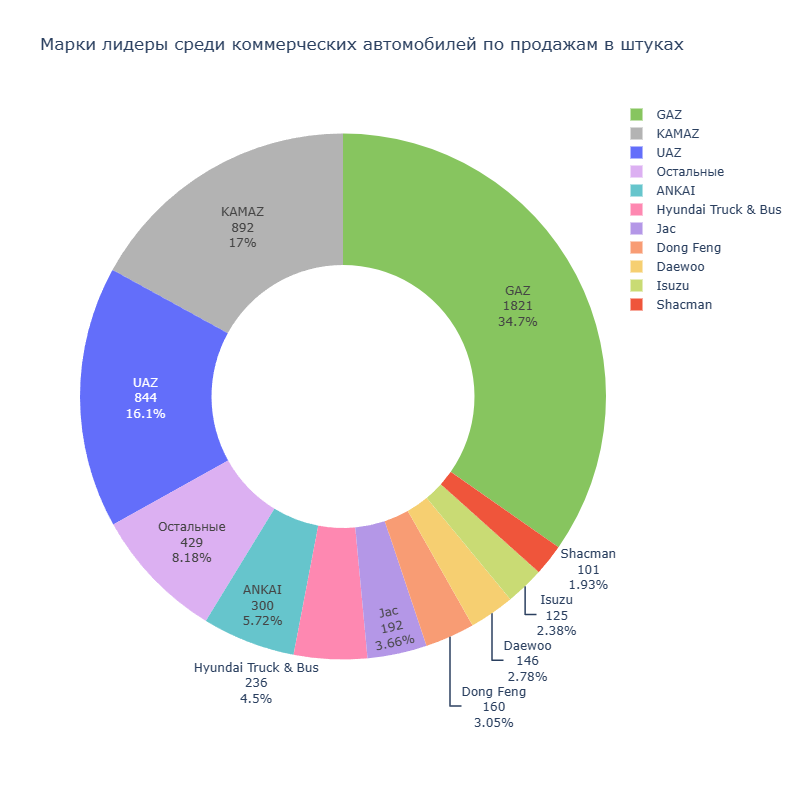

**Вывод: GAZ и KAMAZ доминируют на рынке коммерческих автомобилей, как по продажам в штуках, так и в долларах.**

### Проанализируем динамику рынка: общую и по сегментам

#### *Общая динамика рынка*

In [310]:
dynamic_total = commercial_vehicles.pivot_table(index='Месяц',
                                              values=['Продажа, USD', 'Количество'],
                                              aggfunc='sum').reset_index()

dynamic_total = order_months(dynamic_total, 'Месяц')

dynamic_total

,Месяц,Количество,"Продажа, USD"
8,Январь,354.0,10461058.0
7,Февраль,368.0,10240291.0
5,Март,530.0,18381536.0
1,Апрель,517.0,13246767.0
4,Май,750.0,27076066.0
3,Июнь,549.0,18424548.0
2,Июль,870.0,46020985.0
0,Август,653.0,19544172.0
6,Сентябрь,655.0,22416474.0


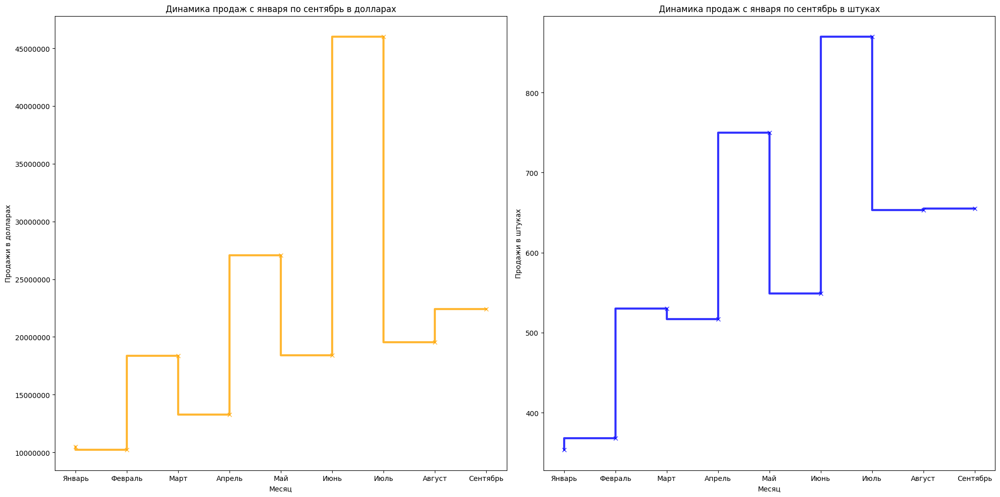

In [311]:
plt.figure(figsize=(20, 10))
ax1 = plt.subplot(1, 2, 1)
ax1 = plt.step(x=dynamic_total['Месяц'], y=dynamic_total['Продажа, USD'], marker='x', linewidth=3, alpha=0.8, color='orange')
plt.xlabel('Месяц')
plt.ylabel('Продажи в долларах')
plt.title('Динамика продаж с января по сентябрь в долларах')
plt.ticklabel_format(useOffset=False,style='plain', axis='y')


ax2 = plt.subplot(1, 2, 2)
ax2 = plt.step(x=dynamic_total['Месяц'], y=dynamic_total['Количество'], marker='x', linewidth=3, alpha=0.8, color='blue')
plt.xlabel('Месяц')
plt.ylabel('Продажи в штуках')
plt.title('Динамика продаж с января по сентябрь в штуках')
plt.ticklabel_format(useOffset=False,style='plain', axis='y')

plt.tight_layout()
plt.show()

**Вывод: динамика продаж в штуках и долларах в целом совпадают - наблюдается рост продаж с пиком в июле и последующим снижением в августе и сентябре.**

#### *Динамика рынка по классам автомобилей*

In [312]:
dynamic_segment_commercial = commercial_vehicles.pivot_table(index=['Месяц', 'Новый_класс'],
                                              values=['Продажа, USD', 'Количество'],
                                              aggfunc='sum').reset_index()

In [313]:
dynamic_segment_commercial = order_months(dynamic_segment_commercial, 'Месяц')

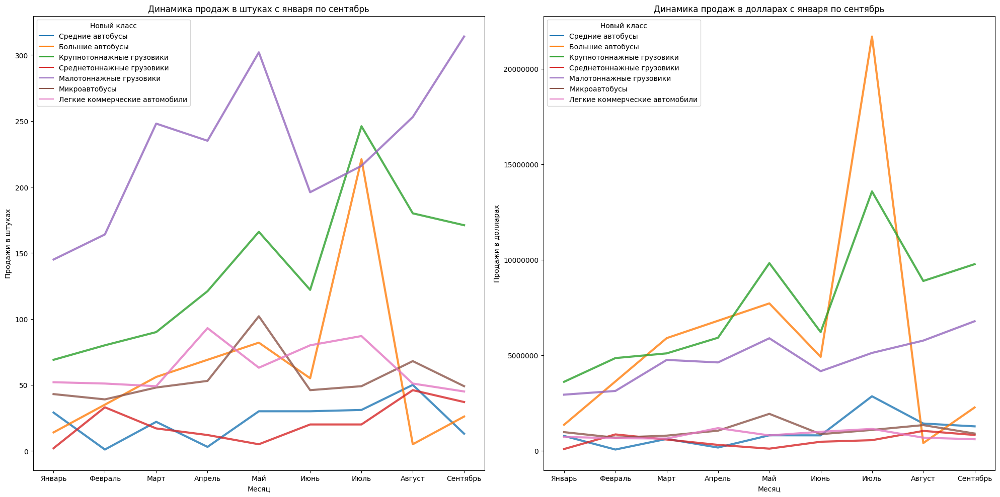

In [314]:
plt.figure(figsize=(20, 10))
ax1 = plt.subplot(1, 2, 1)
ax1 = sns.lineplot(y='Количество', x='Месяц', data=dynamic_segment_commercial, hue='Новый_класс', linewidth=3, alpha=0.8)
plt.xlabel('Месяц')
plt.ylabel('Продажи в штуках')
plt.title('Динамика продаж в штуках с января по сентябрь')
plt.ticklabel_format(useOffset=False, style='plain', axis='y')
plt.legend(title='Новый класс')


ax2 = plt.subplot(1, 2, 2)
ax2 = sns.lineplot(y='Продажа, USD', x='Месяц', data=dynamic_segment_commercial, hue='Новый_класс', linewidth=3, alpha=0.8)
plt.xlabel('Месяц')
plt.ylabel('Продажи в долларах')
plt.title('Динамика продаж в долларах с января по сентябрь')
plt.ticklabel_format(useOffset=False, style='plain', axis='y')
plt.legend(title='Новый класс')

plt.tight_layout()
plt.show()

**Вывод: мы видим, что в июле произошел резкий рост продаж класса больших автобусов, при этом по году наиболее стабильные продажи в штуках и долларах демонстрируют малотоннажные и крупнотонажные грузовики.
В целом классы лидеры рынка это большие автобусы, малотоннажные и крупнотонажные грузовики.**

#### *Динамика рынка по типам трансмиссии*

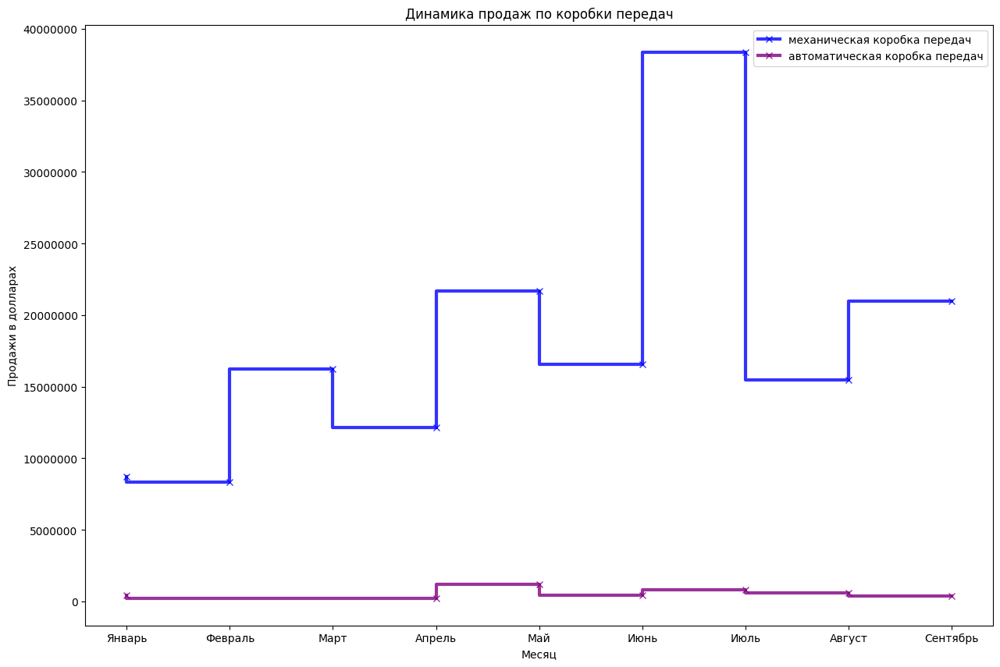

In [315]:
dynamic_transmission_commercial = commercial_vehicles.pivot_table(index=['Месяц', 'Коробка передач'],
                                              values='Продажа, USD',
                                              aggfunc='sum').reset_index()

dynamic_transmission_commercial = order_months(dynamic_transmission_commercial, 'Месяц')

plt.figure(figsize=(15, 10))
plt.step(x=dynamic_transmission_commercial[dynamic_transmission_commercial['Коробка передач'] == 'механическая']['Месяц'],
         y=dynamic_transmission_commercial[dynamic_transmission_commercial['Коробка передач'] == 'механическая']['Продажа, USD'],
         marker='x', linewidth=3, alpha=0.8, color='blue', label='механическая коробка передач')
plt.step(x=dynamic_transmission_commercial[dynamic_transmission_commercial['Коробка передач'] == 'автоматическая']['Месяц'],
         y=dynamic_transmission_commercial[dynamic_transmission_commercial['Коробка передач'] == 'автоматическая']['Продажа, USD'],
         marker='x', linewidth=3, alpha=0.8, color='purple', label='автоматическая коробка передач')
plt.legend()
plt.xlabel('Месяц')
plt.ylabel('Продажи в долларах')
plt.title('Динамика продаж по коробки передач')
plt.ticklabel_format(useOffset=False,style='plain', axis='y')
plt.show()

**Вывод: в коммерческом сегменте доминируют автомобили с механической коробкой передач, что логично.**

### Проанализируем продажи автомобилей в разрезе брендов

#### *Проанализируем продажи автомобилей в штуках в разрезе бренд - модель*

**Будем рассматривать только топ-10 брендов по продажам**

In [316]:
brands_model_count_commercial = \
commercial_vehicles.loc[commercial_vehicles['Бренд'].isin(best_brands_count_commercial)].pivot_table(index=['Бренд', 'Модель'],
                                                                                               values='Количество',
                                                                                               aggfunc='sum').reset_index()

In [317]:
brands_model_count_commercial["rank"] = brands_model_count_commercial.groupby("Бренд")["Количество"].rank(ascending=False)

In [318]:
unique_colors = sns.color_palette("husl", 50)

# Преобразование цветов в формат '#RRGGBB'
marker_color = ['#%02x%02x%02x' % (int(r * 255), int(g * 255), int(b * 255)) for r, g, b in unique_colors]

fig = px.bar(brands_model_count_commercial.sort_values(by='rank'),
             y='Бренд',
             x='Количество',
             color='Модель',
             color_discrete_sequence=marker_color,
            text='Модель')

# Настройка layout
fig.update_layout(
    title='Бренды-лидеры по продажам и их модели',
    xaxis_title='Продажи в штуках',
    yaxis_title='Бренд',
    yaxis={'categoryorder':'total ascending'},
    height=800,
    width=1000
)

fig.show()

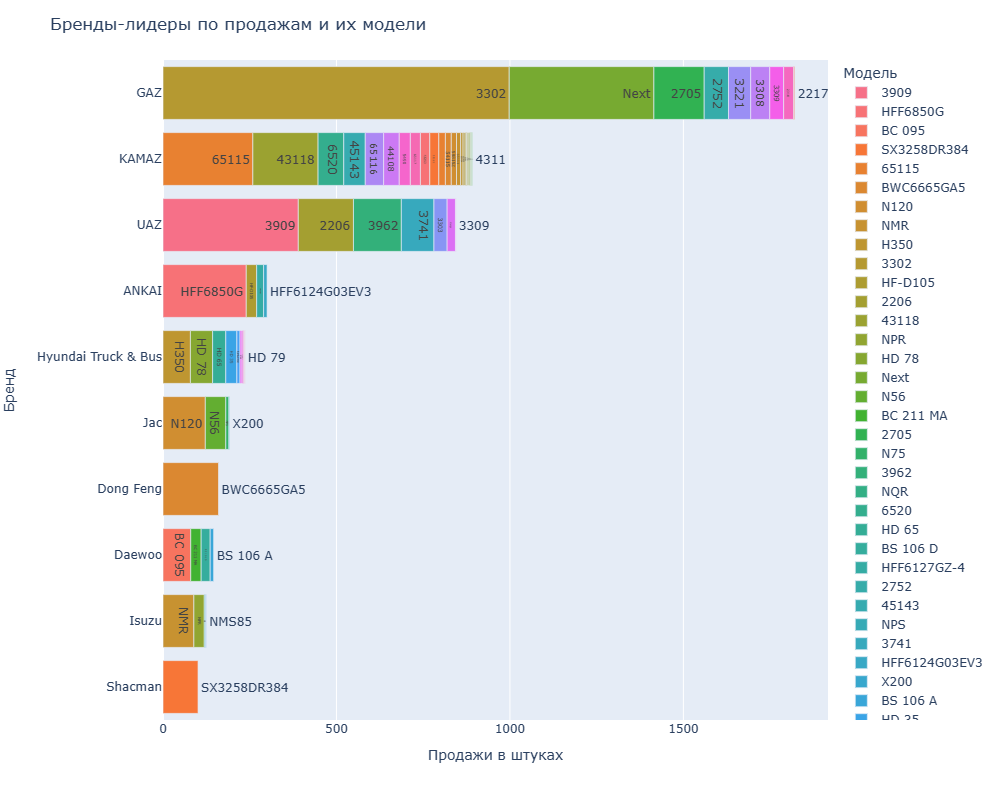

#### *Проанализируем продажи автомобилей  в долларах в разрезе бренд - модель*

In [319]:
brands_sales_commercial =\
commercial_vehicles.loc[commercial_vehicles['Бренд'].isin(best_brands_commercial)].pivot_table(index=['Бренд', 'Модель'],
                                              values='Продажа, USD',
                                 aggfunc='sum').reset_index()

In [320]:
brands_sales_commercial["rank"] = brands_sales_commercial.groupby("Бренд")["Продажа, USD"].rank(ascending=False)

In [321]:
unique_colors = sns.color_palette("husl", 50)

# Преобразование цветов в формат '#RRGGBB'
marker_color = ['#%02x%02x%02x' % (int(r * 255), int(g * 255), int(b * 255)) for r, g, b in unique_colors]

fig = px.bar(brands_sales_commercial.sort_values(by='rank'),
             y='Бренд',
             x='Продажа, USD',
             color='Модель',
             color_discrete_sequence=marker_color,
            text='Модель')

# Настройка layout
fig.update_layout(
    title='Бренды-лидеры по продажам и их модели',
    xaxis_title='Продажи в долларах',
    yaxis_title='Бренд',
    yaxis={'categoryorder':'total ascending'},
    height=800,
    width=1000
)

fig.show()

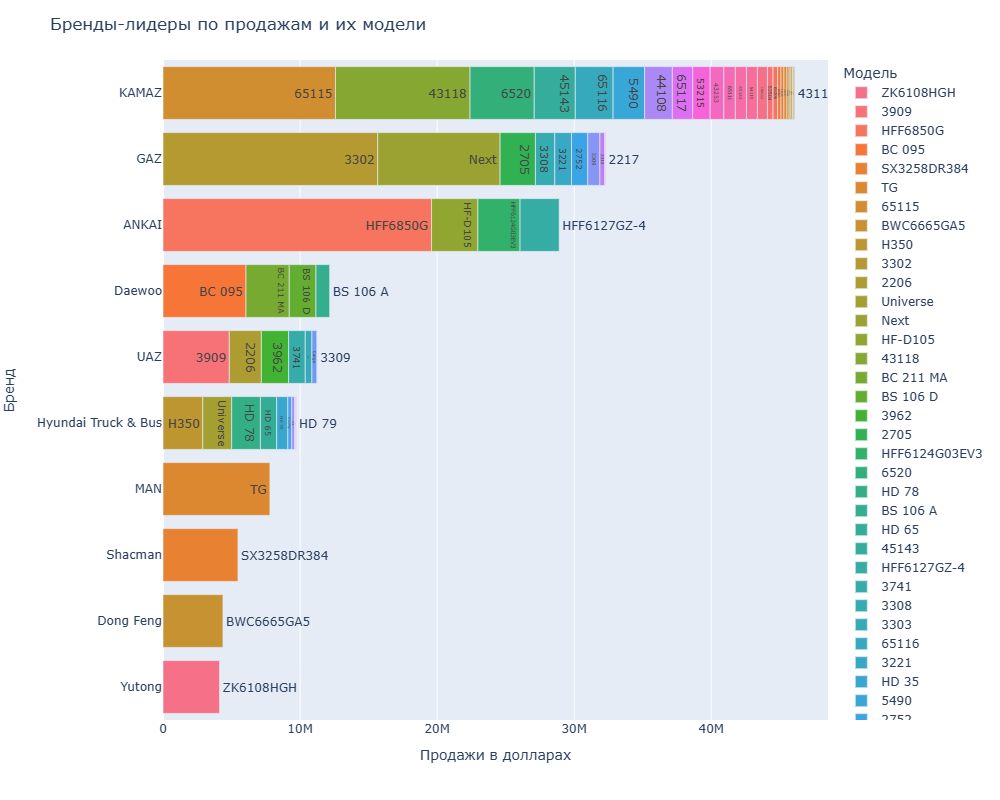

**Вывод: у GAZ самые популярные модели это 3302 и Next, у Камаза - 65115 и 43118. Также одним из преимуществ Камаза на мой взгляд является его очень широкая линейка по сравнению с другими брендами.**

#### *Проанализируем продажи автомобилей в штуках в разрезе бренд - класс автомобиля*

In [322]:
class_sales_count_commercial =\
commercial_vehicles.loc[commercial_vehicles['Бренд'].isin(best_brands_count_commercial)].pivot_table(index=['Бренд',
                                                                                                           'Новый_класс'],
                                                                                                     values='Количество',
                                                                                                     aggfunc='sum').reset_index()

class_sales_count_commercial["rank"] = class_sales_count_commercial.groupby("Бренд")["Количество"].rank(ascending=False)

In [323]:
class_colors = {
    'Большие автобусы': '#1f77b4',
    'Средние автобусы': '#ff7f0e',
    'Малотоннажные грузовики': '#2ca02c',
    'Микроавтобусы': '#d62728',
    'Среднетоннажные грузовики': '#9467bd',
    'Крупнотоннажные грузовики': '#8c564b',
    'Легкие коммерческие автомобили': '#e377c2',
}

function_plotly(table=class_sales_count_commercial,
                             x='Количество', y='Бренд',
                             color='Новый_класс', 
                             color_discrete_map=class_colors, 
                             text='Количество', 
                             title='Бренды-лидеры по продажам и классы', 
                             xaxis_title='Продажи в штуках')

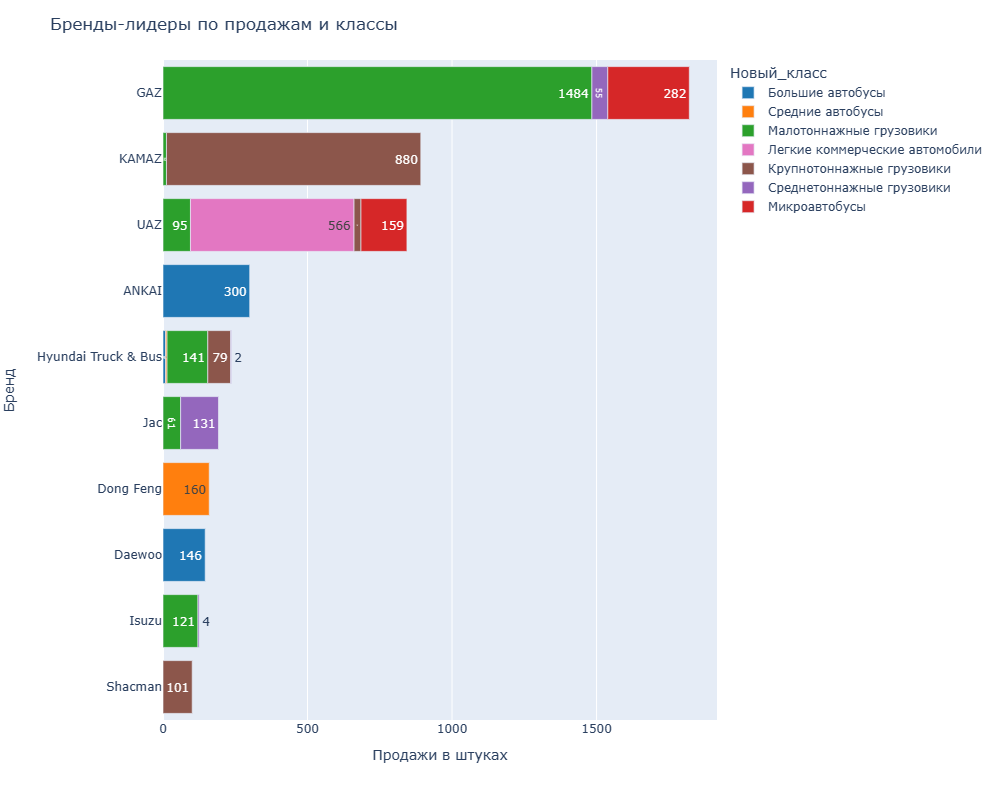

#### *Проанализируем продажи автомобилей в долларах в разрезе бренд - класс автомобиля*

In [324]:
class_sales_commercial =\
commercial_vehicles.loc[commercial_vehicles['Бренд'].isin(best_brands_commercial)].pivot_table(index=['Бренд',
                                                                                                         'Новый_класс'], 
                                                                                               values='Продажа, USD', 
                                                                                               aggfunc='sum').reset_index()

class_sales_commercial["rank"] = class_sales_commercial.groupby("Бренд")["Продажа, USD"].rank(ascending=False)

In [325]:
function_plotly(table=class_sales_commercial,
                             x='Продажа, USD', y='Бренд',
                             color='Новый_класс', 
                             color_discrete_map=class_colors, 
                             text='Продажа, USD', 
                             title='Бренды-лидеры по продажам и классы', 
                             xaxis_title='Продажи в долларах')

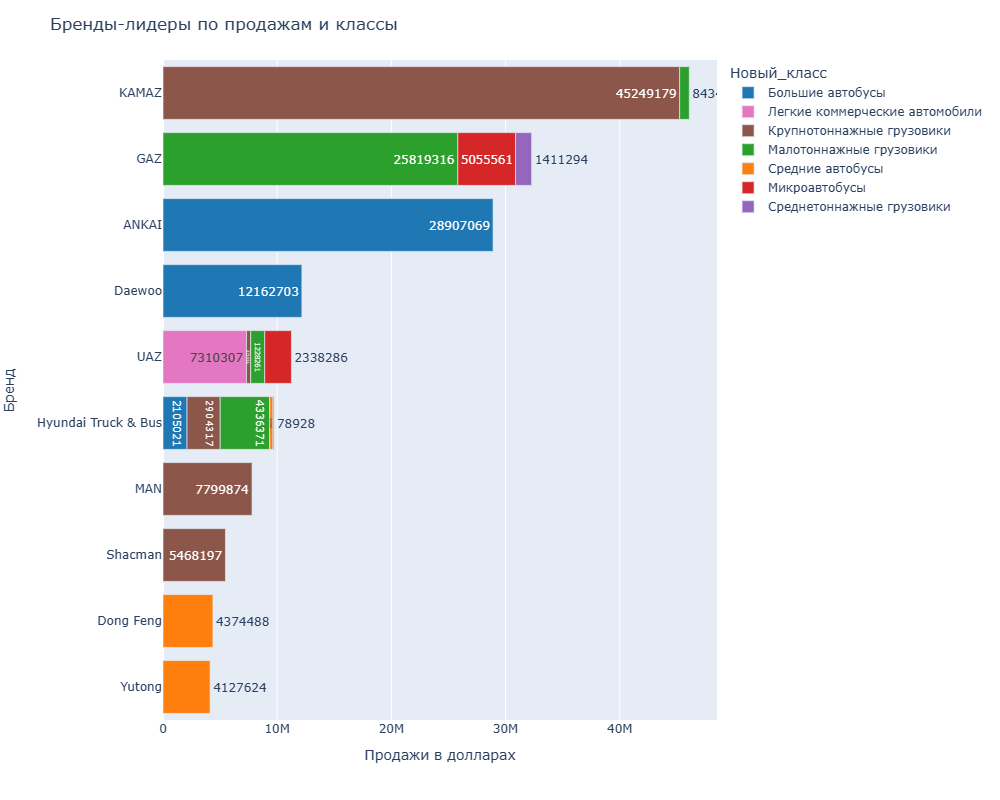

**Вывод: мы видим четкое разделение по специализациям внутри брендов-лидеров.**:
- Камаз занимается в первую очередь крупнотоннажными грузовиками
- ГАЗ - малотоннажными
- УАЗ - легкокоммерческими автомобилями
- Ankai, Daewoo - большими автобусами

**Пересечений и соответственно конкуренции, как в легковом транспорте, практически нет.**

### Проанализируем продажи по регионам

In [326]:
region_sales_commercial = commercial_vehicles.groupby('Область', as_index=False)['Продажа, USD'].agg('sum')
region_sales_count_commercial = commercial_vehicles.groupby('Область', as_index=False)['Количество'].agg('sum')

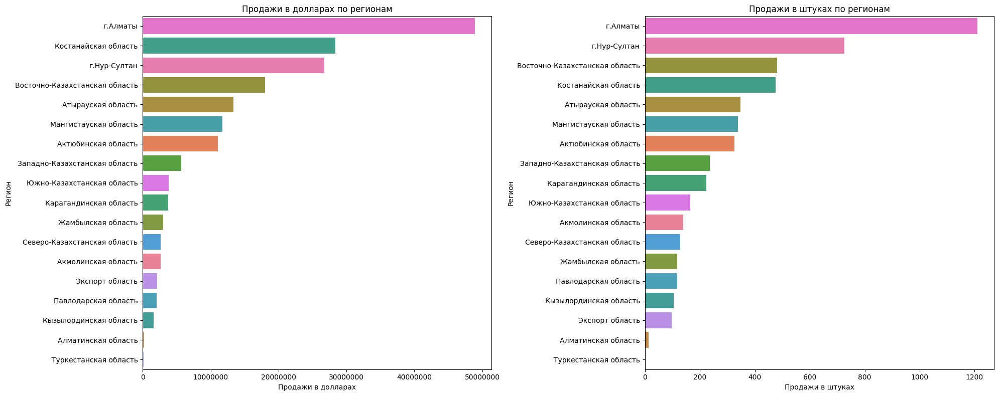

In [327]:
plt.figure(figsize=(20, 8))
ax1 = plt.subplot(1, 2, 1)
ax1 = sns.barplot(y = "Область", x='Продажа, USD',
                 data = region_sales_commercial.sort_values(by='Продажа, USD', ascending=False), palette=region_color_dict)
plt.xlabel('Продажи в долларах')
plt.ylabel('Регион')
plt.title('Продажи в долларах по регионам')
plt.ticklabel_format(useOffset=False,style='plain', axis='x')


ax2 = plt.subplot(1, 2, 2)
ax2 = sns.barplot(y ="Область", x='Количество',
                 data=region_sales_count_commercial.sort_values(by='Количество', ascending=False), palette=region_color_dict)
plt.xlabel('Продажи в штуках')
plt.ylabel('Регион')
plt.title('Продажи в штуках по регионам')
plt.ticklabel_format(useOffset=False,style='plain', axis='x')

plt.tight_layout()
plt.show()

**Вывод: мы видим, что Алматы лидер по продажам коммерческого транспорта. Что интересно, Костанайская область обходит Нурсултан по продажам в долларах.**

#### *Проанализируем продажи по регионам в разрезе брендов*

In [328]:
region_brands_sales_commercial = commercial_vehicles.pivot_table(index=['Область', 'Бренд'],
                                              values='Продажа, USD',
                                 aggfunc='sum').reset_index()

region_brands_sales_commercial["rank"] = region_brands_sales_commercial.groupby("Область")["Продажа, USD"].rank(ascending=False)

fig = px.bar(region_brands_sales_commercial.query('rank < 6').sort_values(by='rank'),
             y='Область',
             x='Продажа, USD',
             color='Бренд',
            text='Продажа, USD')

# Настройка layout
fig.update_layout(
    title='Регионы и бренды-лидеры по продажам',
    xaxis_title='Продажи в долларах',
    yaxis_title='Регион',
    yaxis={'categoryorder':'total ascending'},
    height=800,
    width=1000
)

fig.show()

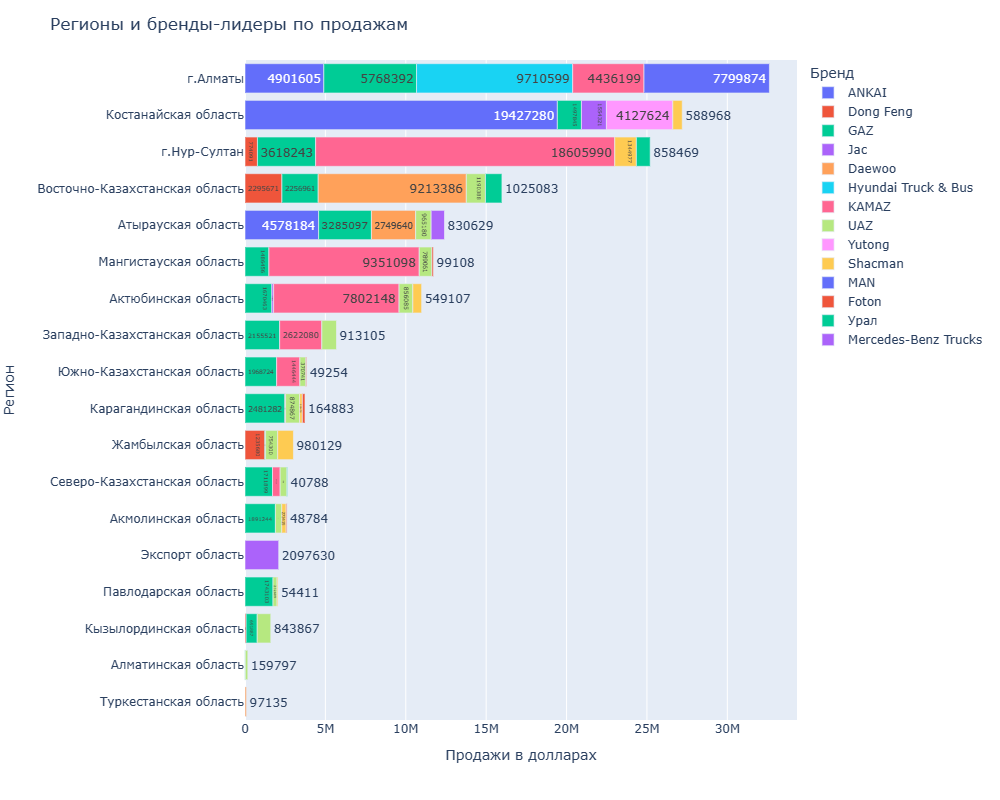

**Вывод: мы видим, что продажи в Алмате наиболее сбалансированные - там представлены все бренды-лидеры рынка. В Костанайской области преобладают продажи Ankai, в Нурсултане - Камаза.**

#### *Проанализируем продажи по регионам в разрезе классов автомобилей*

In [329]:
region_class_sales_commercial = commercial_vehicles.pivot_table(index=['Область', 'Новый_класс'],
                                              values='Продажа, USD',
                                 aggfunc='sum').reset_index()
region_class_sales_commercial["rank"] = region_class_sales_commercial.groupby("Область")["Продажа, USD"].rank(ascending=False)


In [330]:
class_colors = {
    'Большие автобусы': '#1f77b4',
    'Средние автобусы': '#ff7f0e',
    'Малотоннажные грузовики': '#2ca02c',
    'Микроавтобусы': '#d62728',
    'Среднетоннажные грузовики': '#9467bd',
    'Крупнотоннажные грузовики': '#8c564b',
    'Легкие коммерческие автомобили': '#e377c2',
}

function_plotly(table=region_class_sales_commercial,
                             x='Продажа, USD', y='Область',
                             color='Новый_класс', 
                             color_discrete_map=class_colors, 
                             text='Продажа, USD', 
                             title='Регионы и классы автомобилей', 
                             xaxis_title='Продажи в долларах')

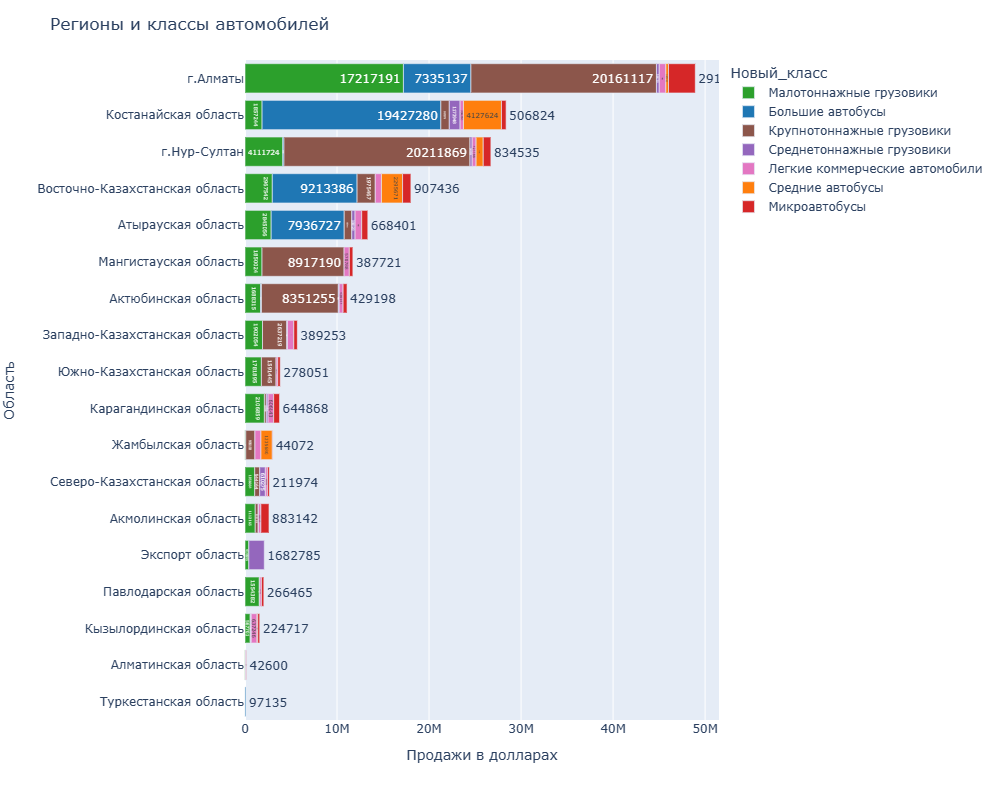

**Вывод: еще раз убеждаемся в том, что продажи в Алмате наиболее сбалансированные - там представлены все бренды-лидеры рынка. Возможно, Костанайская область опередила по продажам Нурсултан за счет скачка продаж автобусов.**

#### *Проанализируем засчет чего Костанайская область обогнала Нурсултан по продажам*

**Есть предположение, что это произошло засчет резкого роста продаж автобусов в июле. Оставим данные только по продажам Нур-Султана, Алматы, Костанайской области и для этих регионов проанализируем динамику продаж по месяцам.**

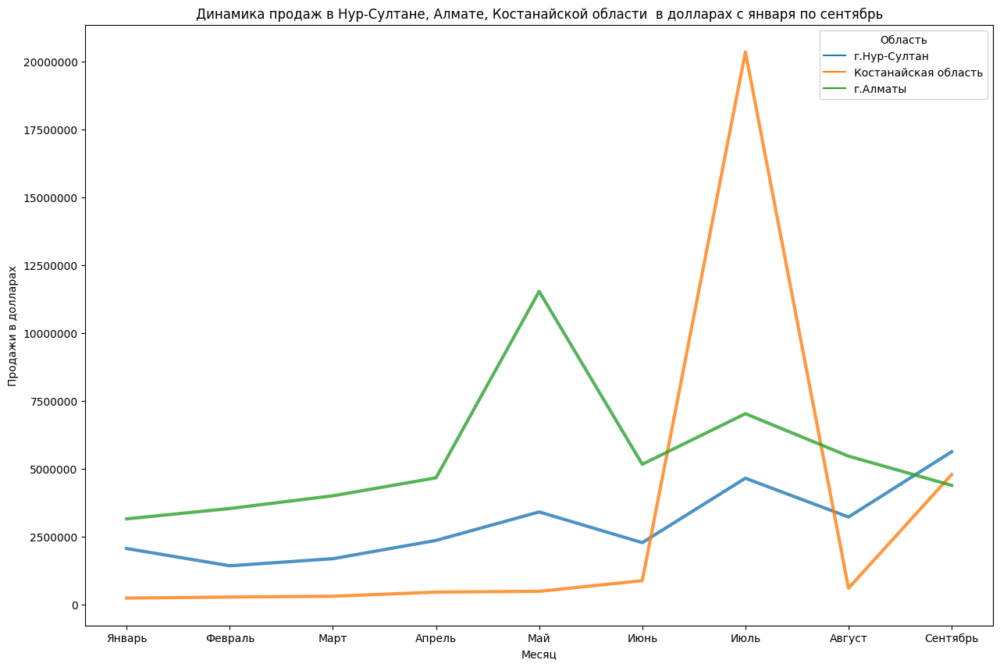

In [331]:
region_correct = commercial_vehicles.query("Область in ['г.Нур-Султан', 'г.Алматы', 'Костанайская область']")

region_dynamic = region_correct.pivot_table(index=['Месяц', 'Область'], values='Продажа, USD', aggfunc='sum').reset_index()

region_dynamic = order_months(region_dynamic , 'Месяц')

fig, ax = plt.subplots(figsize=(15, 10))
sns.lineplot(y='Продажа, USD', x='Месяц', data=region_dynamic, hue='Область', linewidth=3, alpha=0.8)
plt.xlabel('Месяц')
plt.ylabel('Продажи в долларах')
plt.title('Динамика продаж в Нур-Султане, Алмате, Костанайской области  в долларах с января по сентябрь')
plt.ticklabel_format(useOffset=False, style='plain', axis='y')
plt.legend(title='Область')
plt.show()

**Вывод: наша гипотеза подтвердилась, Костанайская область опередила по продажам Нурсултан за счет скачка продаж автобусов в июле. Так как скачок разовый, то видимо в июле была отгрузка по какому-то крупному тендеру, который так сильно повлиял на распределение продаж.**

### Проверим гипотезу о том,что стоимость автомобиля зависит от уровня развития региона (средней заработной платы по региону)

In [332]:
# Посчитаем для каждого региона медианную стоимость автомобиля
price_commercial = commercial_vehicles.pivot_table(index='Область',values='Цена, USD', aggfunc='median').reset_index()

price_salary_commercial = pd.merge(price_commercial, salary, left_on='Область', right_on='Область', how='left')
price_salary_commercial = price_salary_commercial.query('Область != "Экспорт область"')

**Проверим корреляцию между стоимостью автомобиля и средней заработной платой по региону**

Для этого будем использовать коэффициент корреляции Пирсона. Он помогает определить наличие линейной связи между величинами и принимает значения от -1 до 1. Чем ближе коэффициент корреляции Пирсона к крайним значениям 1 или -1, тем теснее линейная взаимосвязь. Если значение близко к нулю, значит, линейная связь слабая либо отсутствует вовсе.

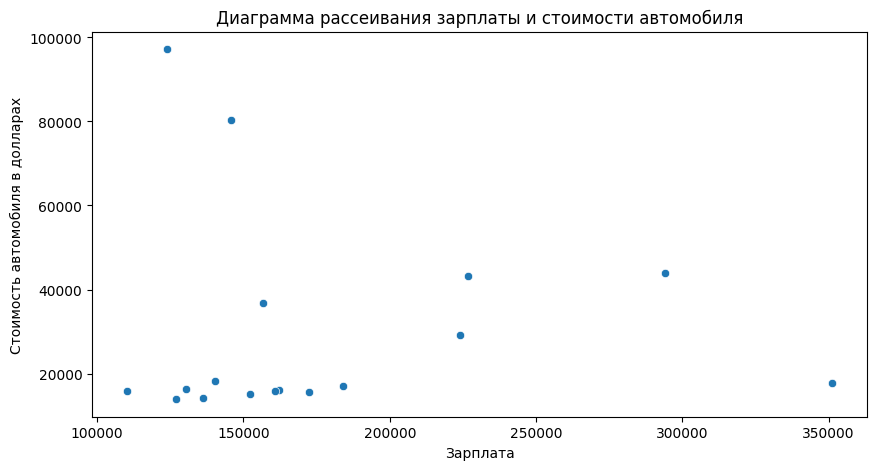

In [333]:
fig, ax = plt.subplots(figsize=(10, 5))
ax = sns.scatterplot(y='Цена, USD', x='Зарплата', data=price_salary_commercial)
ax.grid(False)
plt.title('Диаграмма рассеивания зарплаты и стоимости автомобиля')
plt.xlabel('Зарплата')
plt.ylabel('Стоимость автомобиля в долларах')
plt.show()

In [334]:
# Для проверки посчитаем коэффициент корреляции
print(price_salary_commercial['Цена, USD'].corr(price_salary_commercial['Зарплата']))

-0.03704162599252232


**Вывод: мы видим, что нет связи между ценой автомобиля и средней зарплатой в соответствующем регионе.**

### Проанализируем продажи автоцентров

#### *Проанализируем общие продажи автоцентров*

In [335]:
dealer_commercial = commercial_vehicles.pivot_table(index='Компания',values='Продажа, USD', aggfunc='sum').reset_index()
dealer_count_commercial = commercial_vehicles.pivot_table(index='Компания',values='Количество', aggfunc='sum').reset_index()

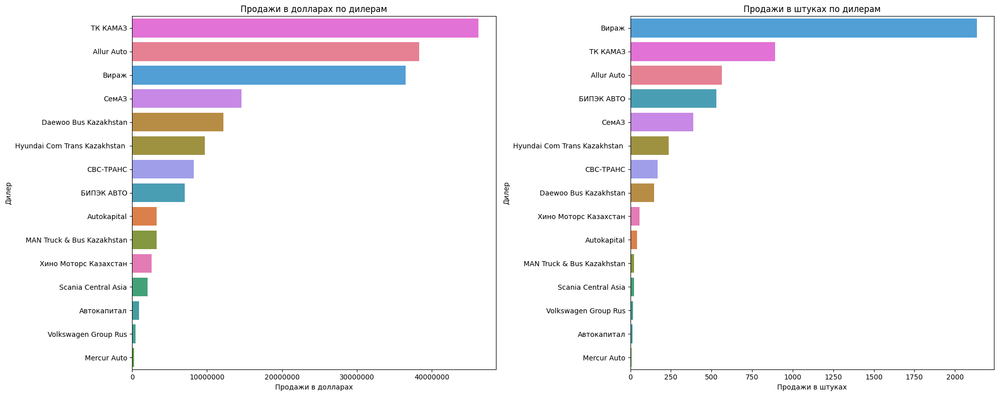

In [336]:
brands_commercial = dealer_commercial['Компания'].unique()
brand_colors_commercial = sns.color_palette("husl", n_colors=len(brands_commercial))

brand_color_dict_commercial = dict(zip(brands_commercial, brand_colors_commercial))

plt.figure(figsize=(20, 8))
ax1 = plt.subplot(1, 2, 1)
ax1 = sns.barplot(y = "Компания", x='Продажа, USD',
                 data =dealer_commercial.sort_values(by='Продажа, USD', ascending=False), palette=brand_color_dict_commercial)
ax.grid(False)
plt.xlabel('Продажи в долларах')
plt.ylabel('Дилер')
plt.title('Продажи в долларах по дилерам')
plt.ticklabel_format(useOffset=False,style='plain', axis='x')


ax2 = plt.subplot(1, 2, 2)
ax2 = sns.barplot(y = "Компания", x='Количество',
                 data = dealer_count_commercial.sort_values(by='Количество', ascending=False), 
                  palette=brand_color_dict_commercial)
ax.grid(False)
plt.xlabel('Продажи в штуках')
plt.ylabel('Дилер')
plt.title('Продажи в штуках по дилерам')
plt.ticklabel_format(useOffset=False,style='plain', axis='x')

plt.tight_layout()
plt.show()

**Вывод: мы видим трех ярко выраженных лидера рынка - ТК Камаз, Вираж, Allur Auto.**

#### *Выделим топ-10 дилеров по продажам в долларах и посчитаем для них долю рынка*

In [337]:
# Сохраним названия брендов с лучшими продажами в отдельный список
best_dealers_commercial = commercial_vehicles.pivot_table(index='Компания',
                                          values='Продажа, USD',
                                          aggfunc='sum').reset_index().nlargest(10, 'Продажа, USD')['Компания'].tolist()
best_dealers_commercial

['ТК КАМАЗ',
 'Allur Auto',
 'Вираж',
 'СемАЗ',
 'Daewoo Bus Kazakhstan',
 'Hyundai Com Trans Kazakhstan ',
 'СВС-ТРАНС',
 'БИПЭК АВТО',
 'Autokapital',
 'MAN Truck & Bus Kazakhstan']

In [338]:
# Всех дилеров, не относящихся к топам переименуем в остальные
dealer_commercial.loc[~dealer_commercial['Компания'].isin(best_dealers_commercial), 'Компания'] = "Остальные"

In [339]:
pastel_colors = px.colors.qualitative.Pastel

fig = go.Figure(data=[go.Pie(labels=dealer_commercial['Компания'],
                            values=dealer_commercial['Продажа, USD'],
                            hole=0.5,
                            textinfo='label+value+percent',
                            marker=dict(colors=pastel_colors))])

fig.update_layout(title={'text': "Дилеры лидеры рынка коммерческих автомобилей"},
                  height=800,
                  width=800)

fig.show()


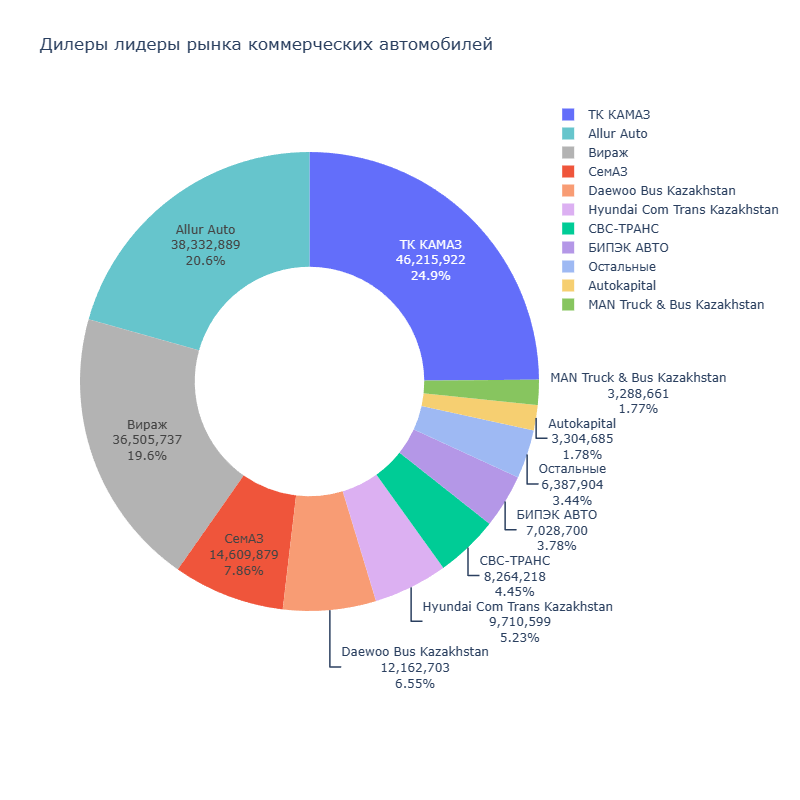

**Вывод: можно говорить о том, что рынок поделен по сути между 3 компаниями - ТК Камаз, Вираж, Allur Auto.**

#### *Проанализируем динамику продаж топ-10 дилеров*

In [340]:
best_commercial = commercial_vehicles.loc[commercial_vehicles['Компания'].isin(best_dealers_commercial)]

best_commercial = best_commercial.pivot_table(index=['Месяц', 'Компания'], values='Продажа, USD',
                                              aggfunc='sum').reset_index()

best_commercial = order_months(best_commercial, 'Месяц')

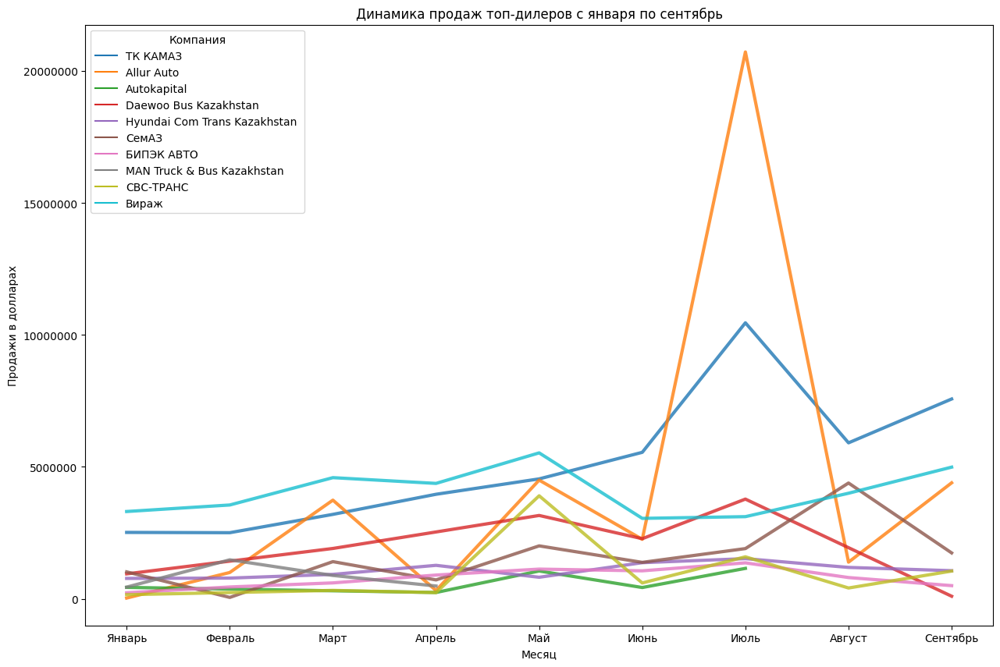

In [341]:
fig, ax = plt.subplots(figsize=(15, 10))
ax = sns.lineplot(y='Продажа, USD', x='Месяц', data=best_commercial, hue='Компания', linewidth=3, alpha=0.8)
plt.xlabel('Месяц')
plt.ylabel('Продажи в долларах')
plt.title('Динамика продаж топ-дилеров с января по сентябрь')
plt.ticklabel_format(useOffset=False, style='plain', axis='y')
plt.legend(title='Компания')
ax.grid(False)
plt.show()

**Вывод: у ТК Камаз, Allur Auto пики продаж наблюдаеются в июле, у Вираж - в мае.**

#### *Проанализируем какими брендами занимаются дилеры*

In [342]:
brand_dealer_commercial = commercial_vehicles.pivot_table(index=['Бренд', 'Компания'], values='Продажа, USD',
                                              aggfunc='sum').reset_index()

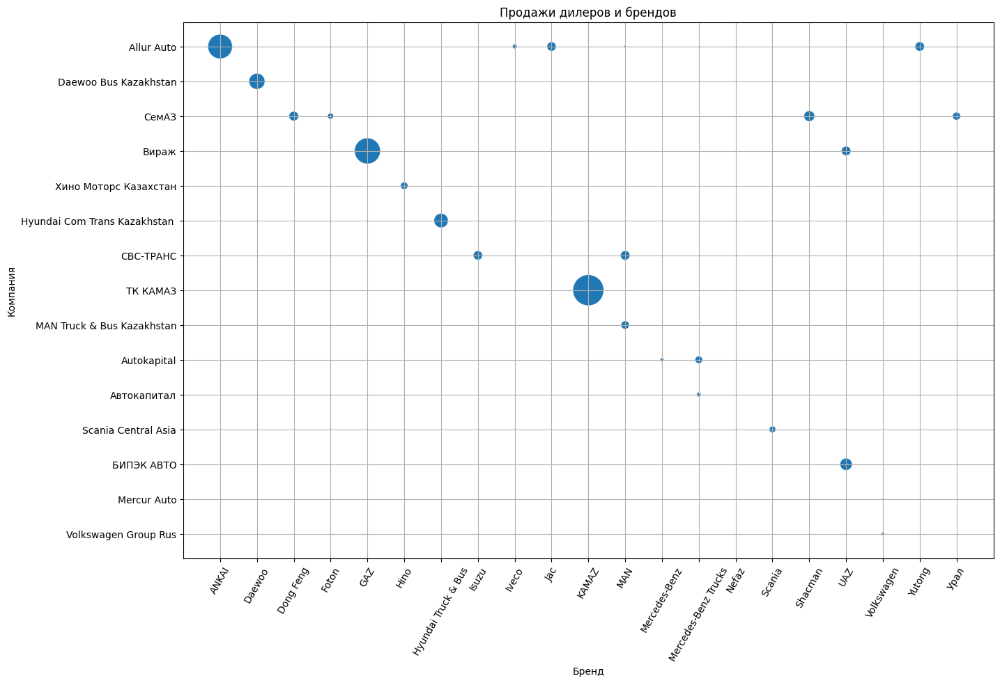

In [343]:
fig, ax = plt.subplots(figsize=(15, 10))
ax = sns.scatterplot(x='Бренд', y='Компания', data=brand_dealer_commercial, size='Продажа, USD', legend=False, sizes=(0, 1000))
plt.xlabel('Бренд')
plt.ylabel('Компания')
plt.title('Продажи дилеров и брендов')
plt.xticks(rotation=60)
ax.grid(True)
plt.show()

**Вывод: мы видим трех основных игроков на рынке и бренды за счет которых они развивают свои продажи**:
- Allur Auto - занимаются брендами Ankai и Jac
- Вираж - занимаются брендом GAZ
- ТК Камаз - занимаются брендом Камаз
**Также еще раз убеждаемся в том, что конкуренция практически отсутствует, каждая компания занимается своим брендом.*

#### *Проанализируем в каких регионах торгуют дилеры, представленные в таблице*

In [344]:
region_dealer_commercial = commercial_vehicles.pivot_table(index=['Область', 'Компания'], values='Продажа, USD',
                                              aggfunc='sum').reset_index()

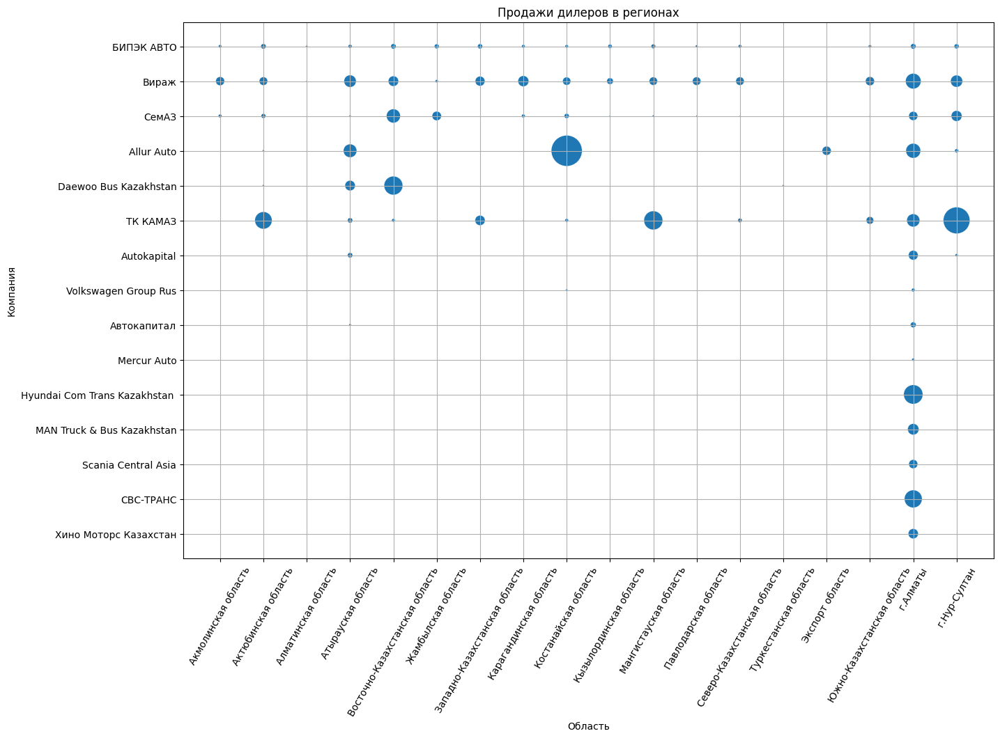

In [345]:
fig, ax = plt.subplots(figsize=(15, 10))
ax = sns.scatterplot(x='Область', y='Компания', data=region_dealer_commercial, 
                     size='Продажа, USD', legend=False, sizes=(0, 1000))
plt.xlabel('Область')
plt.ylabel('Компания')
plt.title('Продажи дилеров в регионах')
plt.xticks(rotation=60)
ax.grid(True)
plt.show()

**Вывод: мы видим, что у трех основных игроков разное распределение продаж по регионам:**
- у Виража продажи распределены практически равномерно по стране
- у ТК Камаз основыне продажи сосредоточены в Актюбинской и Мангистауской областях и в Нурсултане
- у Allur Auto практически все продажи сосредоточены в Костанайской области

**Очевидно, такое различие в распределении продаж напрямую связано с брендами, которыми занимаются компании**

### Выделим модели-лидеры на рынке

In [346]:
commercial_vehicles['Новое_значение'] = commercial_vehicles['Бренд'] + ' ' + commercial_vehicles['Модель']

models_commercial = commercial_vehicles.pivot_table(index='Новое_значение', values='Продажа, USD',
                                              aggfunc='sum').reset_index()
models_commercial = models_commercial.sort_values(by='Продажа, USD', ascending=False).head(10)
models_commercial

,Новое_значение,"Продажа, USD"
3,ANKAI HFF6850G,19592919.0
16,GAZ 3302,15664502.0
62,KAMAZ 65115,12584272.0
48,KAMAZ 43118,9818025.0
19,GAZ Next,8929638.0
70,MAN TG,7799874.0
4,Daewoo BC 095,6055574.0
83,Shacman SX3258DR384,5468197.0
88,UAZ 3909,4838732.0
65,KAMAZ 6520,4683704.0


In [347]:
models_count_commercial = commercial_vehicles.pivot_table(index='Новое_значение', values='Количество',
                                              aggfunc='sum').reset_index()
models_count_commercial = models_count_commercial.sort_values(by='Количество', ascending=False).head(10)
models_count_commercial

,Новое_значение,Количество
16,GAZ 3302,998.0
19,GAZ Next,417.0
88,UAZ 3909,390.0
62,KAMAZ 65115,259.0
3,ANKAI HFF6850G,240.0
48,KAMAZ 43118,188.0
8,Dong Feng BWC6665GA5,160.0
84,UAZ 2206,159.0
13,GAZ 2705,145.0
89,UAZ 3962,138.0


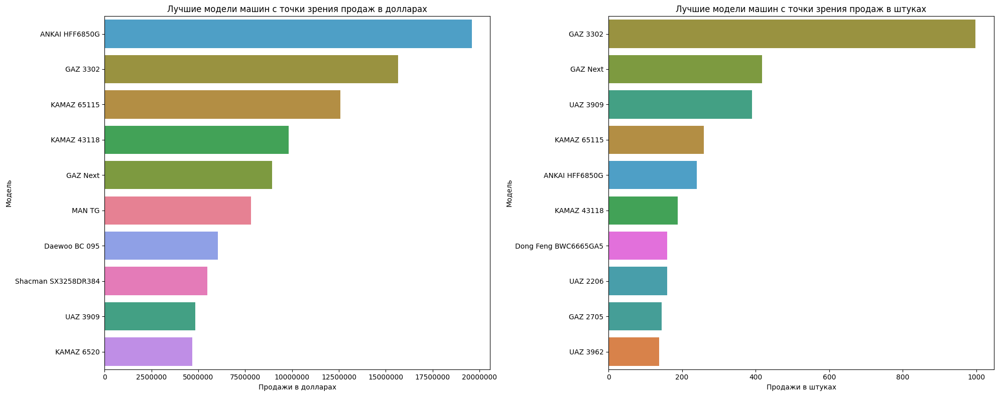

In [348]:
labels_1 = models_commercial['Новое_значение'].tolist()
labels_2 = models_count_commercial['Новое_значение'].tolist()

# Получение списка уникальных компаний
unique_models_commercial = pd.Series(list(set(labels_1) | set(labels_2)))

# Создание словаря цветов только для уникальных компаний
colors_commercial = sns.color_palette("husl", n_colors=len(unique_models_commercial))
models_color_dict_commercial = dict(zip(unique_models_commercial, colors_commercial))

plt.figure(figsize=(20, 8))
ax1 = plt.subplot(1, 2, 1)
ax1 = sns.barplot(y = "Новое_значение", x='Продажа, USD',
                 data = models_commercial.sort_values(by='Продажа, USD', ascending=False), palette=models_color_dict_commercial)
ax.grid(False)
plt.xlabel('Продажи в долларах')
plt.ylabel('Модель')
plt.title('Лучшие модели машин с точки зрения продаж в долларах')
plt.ticklabel_format(useOffset=False,style='plain', axis='x')


ax2 = plt.subplot(1, 2, 2)
ax2 = sns.barplot(y = "Новое_значение", x='Количество',
                 data = models_count_commercial.sort_values(by='Количество', ascending=False), 
                  palette=models_color_dict_commercial)
ax.grid(False)
plt.xlabel('Продажи в штуках')
plt.ylabel('Модель')
plt.title('Лучшие модели машин с точки зрения продаж в штуках')
plt.ticklabel_format(useOffset=False,style='plain', axis='x')

plt.tight_layout()
plt.show()

**Вывод: мы видим, что GAZ 3302, GAZ Next, KAMAZ 65115, KAMAZ 43118, ANKAI HFF6850G - лидеры рынка коммерческих автомобилей по продажам в штуках и долларах.**

### Выделим самые дорогие и дешевые бренды на рынке

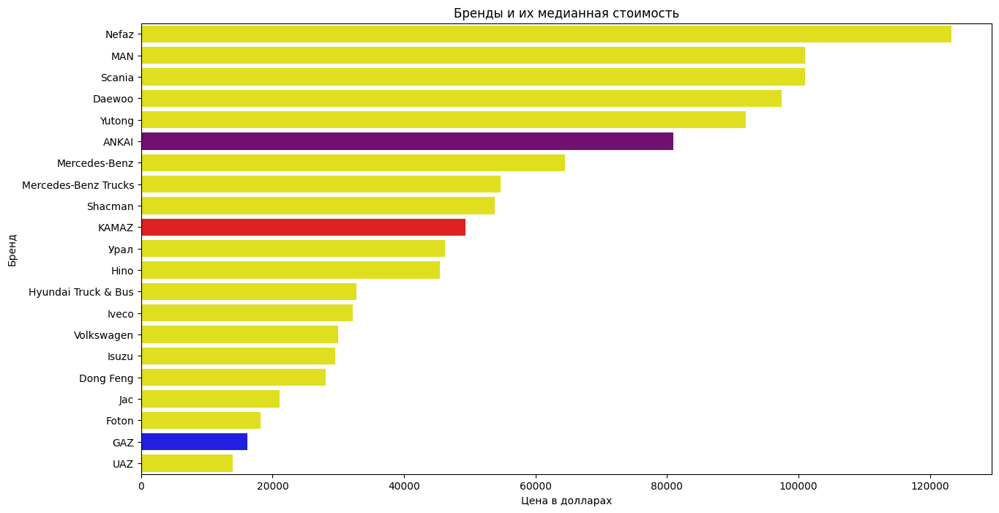

In [349]:
price_commercial = commercial_vehicles.pivot_table(index='Бренд', values='Цена, USD', aggfunc='median').reset_index()

brand_palette = {brand: 'yellow' for brand in price_commercial['Бренд'].unique()}
brand_palette['KAMAZ'] = 'red'
brand_palette['GAZ'] = 'blue'
brand_palette['ANKAI'] = 'purple'

# Строим график
fig, ax = plt.subplots(figsize=(15, 8))
ax = sns.barplot(y="Бренд", x='Цена, USD',
                 data=price_commercial.sort_values(by='Цена, USD', ascending=False),
                 palette=brand_palette)

ax.grid(False)
plt.xlabel('Цена в долларах')
plt.ylabel('Бренд')
plt.title('Бренды и их медианная стоимость')
plt.ticklabel_format(useOffset=False, style='plain', axis='x')
plt.show();

**Вывод: мы видим, что GAZ является одним из лидеров рынка, в том числе из-за своей сравнительно невысокой цены. KAMAZ - скорее умеренный по цене бренд, а ANKAI ближе к дорогим. Такэе надо отметить, что подобное сравнение достаточно условное, так как каждый бренд занимается своими классами автомобилей, значительно отличающиеся друг от друга по специфике и цене.**

### Промежуточный вывод: на данном этапе мы провели анализ рынка коммерческих автомобилей. Нам удалось установить следующее:
1. фактическая емкость рынка коммерческих автомобилей Казахстана в 2019 году на сентябрь составляет 5 246 штук и 185 811 884 долларов соответственно.
2. GAZ и KAMAZ доминируют на рынке коммерческих автомобилей, как по продажам в штуках, так и в долларах.
3. динамика продаж в штуках и долларах в целом совпадают - наблюдается рост продаж с пиком в июле и последующим снижением в августе и сентябре.
4. в июле произошел резкий рост продаж класса больших автобусов, при этом по году наиболее стабильные продажи в штуках и долларах демонстрируют малотоннажные и крупнотонажные грузовики.
5. в целом классы лидеры рынка — это большие автобусы, малотоннажные и крупнотоннажные грузовики.
6. в коммерческом сегменте рынка доминируют автомобили с механической коробкой передач, что логично.
7. у GAZ самые популярные модели это 3302 и Next, у Камаза - 65115 и 43118. Также одним из преимуществ Камаза на мой взгляд является его очень широкая линейка по сравнению с другими брендами.
8. мы видим четкое разделение по специализациям внутри брендов-лидеров:
- Камаз занимается в первую очередь крупнотоннажными грузовиками
- ГАЗ - малотоннажными
- УАЗ - легкокоммерческими автомобилями
- Ankai, Daewoo - большими автобусами
Пересечений и соответственно конкуренции, как в легковом транспорте, практически нет.
9. Алматы лидер по продажам коммерческого транспорта. Костанайская область опередила по продажам Нурсултан за счет скачка продаж автобусов в июле. Так как скачок разовый, то видимо в июле была отгрузка по какому-то крупному тендеру, который так сильно повлиял на распределение продаж.
10. продажи в Алмате наиболее сбалансированные - там представлены все бренды-лидеры рынка. В Костанайской области преобладают продажи Ankai, в Нурсултане - Камаза.
11. нет связи между ценой автомобиля и средней зарплатой в соответствующем регионе.
12. рынок поделен между тремя лидерами - ТК Камаз, Вираж, Allur Auto.
- Allur Auto - занимаются брендами Ankai и Jac
- Вираж - занимаются брендом GAZ
- ТК Камаз - занимаются брендом Камаз
13. у ТК Камаз, Allur Auto пики продаж наблюдаеются в июле, у Вираж - в мае.
- у Виража продажи распределены практически равномерно по стране
- у ТК Камаз основыне продажи сосредоточены в Актюбинской и Мангистауской областях и в Нурсултане
- у Allur Auto практически все продажи сосредоточены в Костанайской области
Очевидно, такое различие в распределении продаж напрямую связано с брендами, которыми занимаются компании.
14. GAZ 3302, GAZ Next, KAMAZ 65115, KAMAZ 43118, ANKAI HFF6850G - лидеры рынка коммерческих автомобилей по продажам в штуках и долларах.

## Шаг 8. Анализ положения Меркур Авто

### Проанализируем выручку компании: общую, по маркам, среднюю, ежемесячную, ежемесячную по маркам

#### *Проанализируем общую выручку компании*

In [350]:
mercur = data_new.query('Компания == "Mercur Auto"')

In [351]:
mercur['Продажа, USD'].sum()

19355311.0

**Вывод: общая выручка компании составляет 19 355 310 долларов**

#### *Проанализируем выручку компании в разрезе марок*

In [352]:
mercur_brands = mercur.pivot_table(index='Бренд', values='Продажа, USD',
                                              aggfunc='sum').reset_index()
mercur_brands

,Бренд,"Продажа, USD"
0,Audi,4059490.0
1,Porsche,5113514.0
2,Volkswagen,10182307.0


**Вывод: компания занимается брендами Audi, Porsche, Volkswagen. Наиболее прибыльный бренд - Volkswagen.**

#### *Проанализируем среднюю выручку компании*

In [353]:
round(mercur['Продажа, USD'].mean(),0)

30102.0

**Вывод: средняя выручка компании составляет 30 102 долларов.**

#### *Проанализируем ежемесячную выручку компании*

In [354]:
mercur_dynamic = mercur.pivot_table(index='Месяц', values='Продажа, USD',
                                              aggfunc='sum').reset_index()

mercur_dynamic = order_months(mercur_dynamic, 'Месяц')

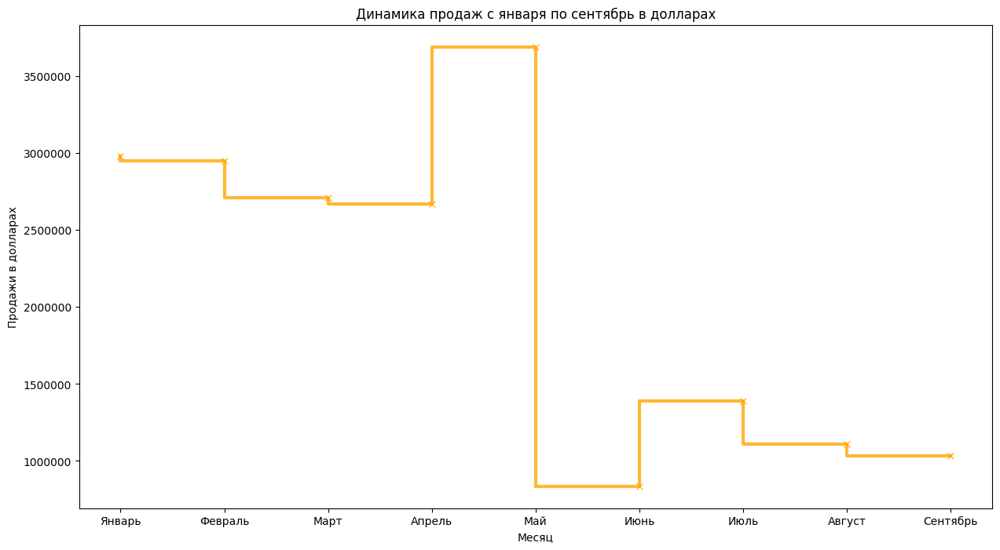

In [355]:
fig, ax = plt.subplots(figsize=(15, 8))

ax = plt.step(x=mercur_dynamic['Месяц'], y=mercur_dynamic['Продажа, USD'], marker='x', linewidth=3, alpha=0.8, color='orange')
plt.xlabel('Месяц')
plt.ylabel('Продажи в долларах')
plt.title('Динамика продаж с января по сентябрь в долларах')
plt.ticklabel_format(useOffset=False,style='plain', axis='y')

**Вывод: динамика продаж сильно отличается от общерыночной. На рынке после зимы наблюдается рост пиком в июле. Здесь же наоборот после пика в мае к лету наблюдается резкий спад продаж.**

#### *Проанализируем ежемесячную выручку компании в разрезе брендов*

In [356]:
mercur_brand_dynamic = mercur.pivot_table(index=['Месяц', 'Бренд'], values='Продажа, USD',
                                              aggfunc='sum').reset_index()

mercur_brand_dynamic = order_months(mercur_brand_dynamic, 'Месяц')

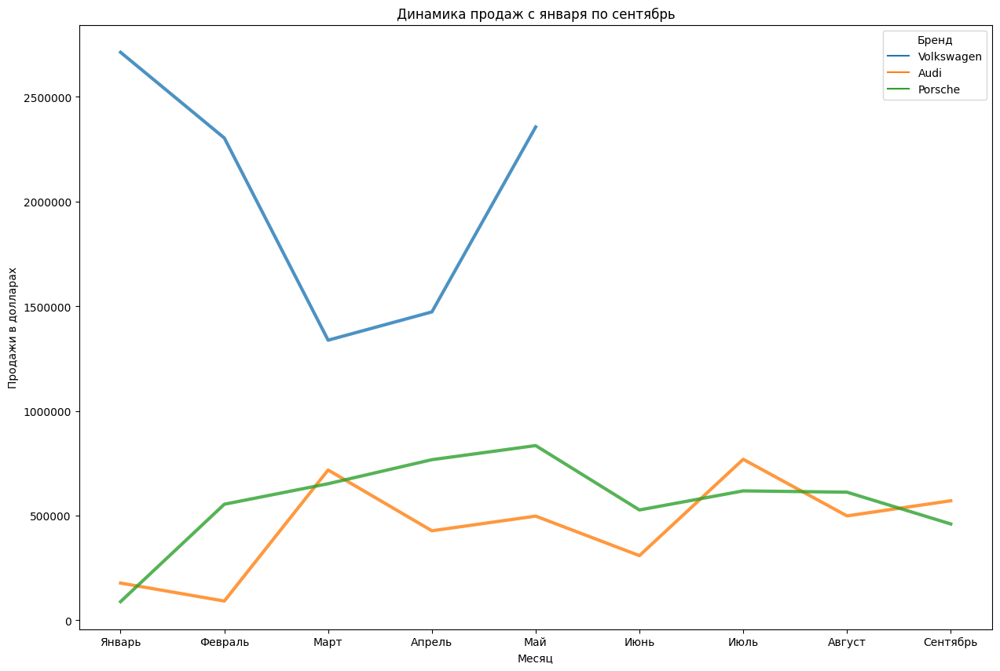

In [357]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.lineplot(y='Продажа, USD', x='Месяц', data=mercur_brand_dynamic, hue='Бренд', linewidth=3, alpha=0.8)
plt.xlabel('Месяц')
plt.ylabel('Продажи в долларах')
plt.title('Динамика продаж с января по сентябрь')
plt.ticklabel_format(useOffset=False, style='plain', axis='y')
plt.legend(title='Бренд')
plt.show()

**Вывод: судя по всему, компания собиралась делать ставку в первую очередь на Volkswagen, но по каким-то причинам продажи с самого начала года начали падать, а после мая прекратились. Возможно, были проблемы на стороне производителя - отсутствие автомобилей, нехватка комплектующих и т.д. Porsche и Audi стабильно продаются в течение года.**

#### *Проанализируем ежемесячную выручку компании в разрезе сегментов*

In [358]:
mercur_segment_dynamic = mercur.pivot_table(index=['Месяц', 'Новый_сегмент'], values='Продажа, USD',
                                              aggfunc='sum').reset_index()

mercur_segment_dynamic = order_months(mercur_segment_dynamic, 'Месяц')
mercur_segment_dynamic

,Месяц,Новый_сегмент,"Продажа, USD"
8,Январь,Коммерческий транспорт,251411.0
9,Январь,Легковой транспорт,2728013.0
7,Февраль,Легковой транспорт,2949389.0
5,Март,Легковой транспорт,2707622.0
1,Апрель,Легковой транспорт,2667282.0
4,Май,Легковой транспорт,3687797.0
3,Июнь,Легковой транспорт,835751.0
2,Июль,Легковой транспорт,1386826.0
0,Август,Легковой транспорт,1110374.0
6,Сентябрь,Легковой транспорт,1030846.0


**Вывод: судя по всему компания специализируется на легковом транспорте, но в январе была разовая продажа коммерческой техники, из-за чего динамика продаж выглядит непохожей на рыночную.**

### Проанализируем продажи по регионам: общие, по маркам

#### *Проанализируем общие продажи по регионам*

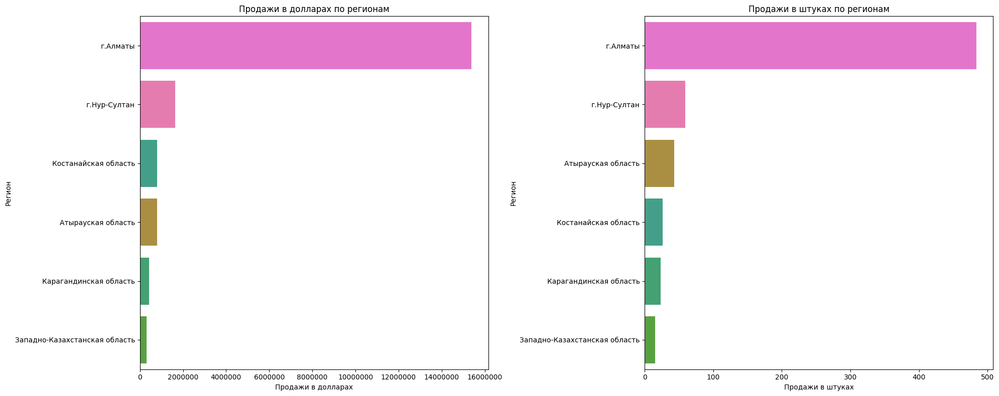

In [359]:
mercur_region_sales = mercur.groupby('Область', as_index=False)['Продажа, USD'].agg('sum')
mercur_region_sales_count = mercur.groupby('Область', as_index=False)['Количество'].agg('sum')

plt.figure(figsize=(20, 8))
ax1 = plt.subplot(1, 2, 1)
ax1 = sns.barplot(y = "Область", x='Продажа, USD',
                 data =mercur_region_sales.sort_values(by='Продажа, USD', ascending=False), palette=region_color_dict)
plt.xlabel('Продажи в долларах')
plt.ylabel('Регион')
plt.title('Продажи в долларах по регионам')
plt.ticklabel_format(useOffset=False,style='plain', axis='x')


ax2 = plt.subplot(1, 2, 2)
ax2 = sns.barplot(y = "Область", x='Количество',
                 data =mercur_region_sales_count.sort_values(by='Количество', ascending=False), palette=region_color_dict)
plt.xlabel('Продажи в штуках')
plt.ylabel('Регион')
plt.title('Продажи в штуках по регионам')
plt.ticklabel_format(useOffset=False,style='plain', axis='x')

plt.tight_layout()
plt.show()

**Вывод: практически все продажи компании сосредоточены в Алмате. Удивляет крайне малые продажи в Нурсултане, на мой взгляд это одна из точек роста компании.**

#### *Проанализируем продажи по регионам в разрезе брендов*

In [360]:
mercur_brand_region_sales = mercur.pivot_table(index=['Область', 'Бренд'],
                                              values='Продажа, USD',
                                 aggfunc='sum').reset_index()

function_plotly_without_rank(table=mercur_brand_region_sales,
                             x='Продажа, USD', y='Область',
                             color='Бренд', 
                             color_discrete_map=class_colors, 
                             text='Продажа, USD', 
                             title='Регионы и бренды автомобилей', 
                             xaxis_title='Продажи в долларах')

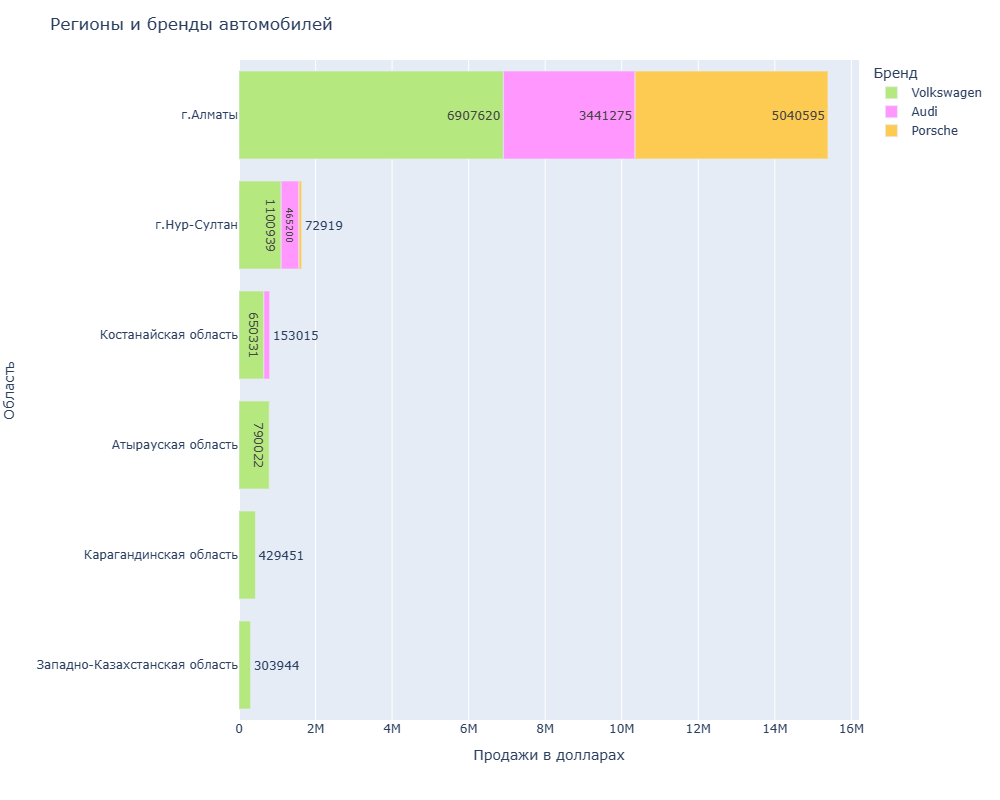

**Вывод: мы видим, что во всех регионах, кроме Алматы, компания делает ставку на продажу Volkswagen. Однако, учитывая проблемы с Volkswagen во второй половине года, получается, что компания находится в крайне уязвимом положении. В Алмате у компании также достаточно неплохо продаются Audi и Porsche.**

### Проведем конкурентный анализ

#### *Проанализируем конкурентов по бренду Volkswagen*

In [361]:
competitors = light_vehicles.query('Бренд == "Volkswagen"')
competitors['Компания'].unique()

array(['Mercur Auto', 'Volkswagen Group Rus', 'Автодом Motors KST',
       'Автомир-Центр', 'ТОО "Eurasia Motor Zhaik"'], dtype=object)

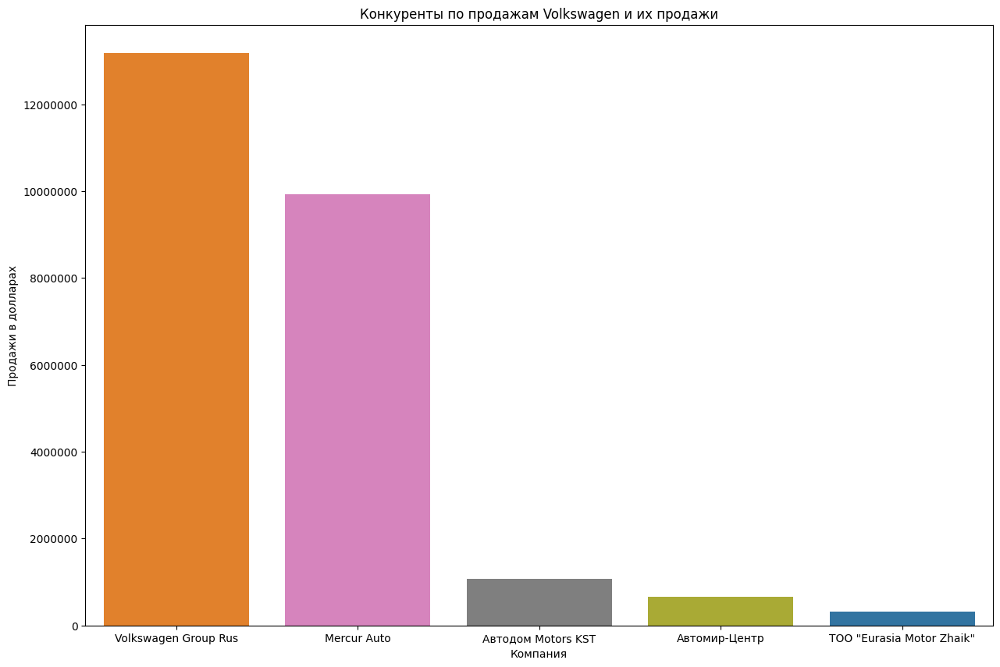

In [362]:
competitors_vw = competitors.pivot_table(index='Компания', values='Продажа, USD', aggfunc='sum').reset_index()
colors_competitors = {
    'ТОО "Eurasia Motor Zhaik"': '#1f77b4',
    'Volkswagen Group Rus': '#ff7f0e',
    'Mercur Auto': '#e377c2',
    'Автодом Motors KST': '#7f7f7f',
    'Автомир-Центр': '#bcbd22'}

fig, ax = plt.subplots(figsize=(15, 10))
sns.barplot(y='Продажа, USD', x='Компания',
            data=competitors_vw.sort_values(by='Продажа, USD', ascending=False), palette=colors_competitors)
plt.xlabel('Компания')
plt.ylabel('Продажи в долларах')
plt.title('Конкуренты по продажам Volkswagen и их продажи')
plt.ticklabel_format(useOffset=False, style='plain', axis='y')
plt.show()

In [363]:
competitors_dynamic = competitors.pivot_table(index=['Месяц', 'Компания'], values='Продажа, USD',
                                              aggfunc='sum').reset_index()

competitors_dynamic = order_months(competitors_dynamic, 'Месяц')

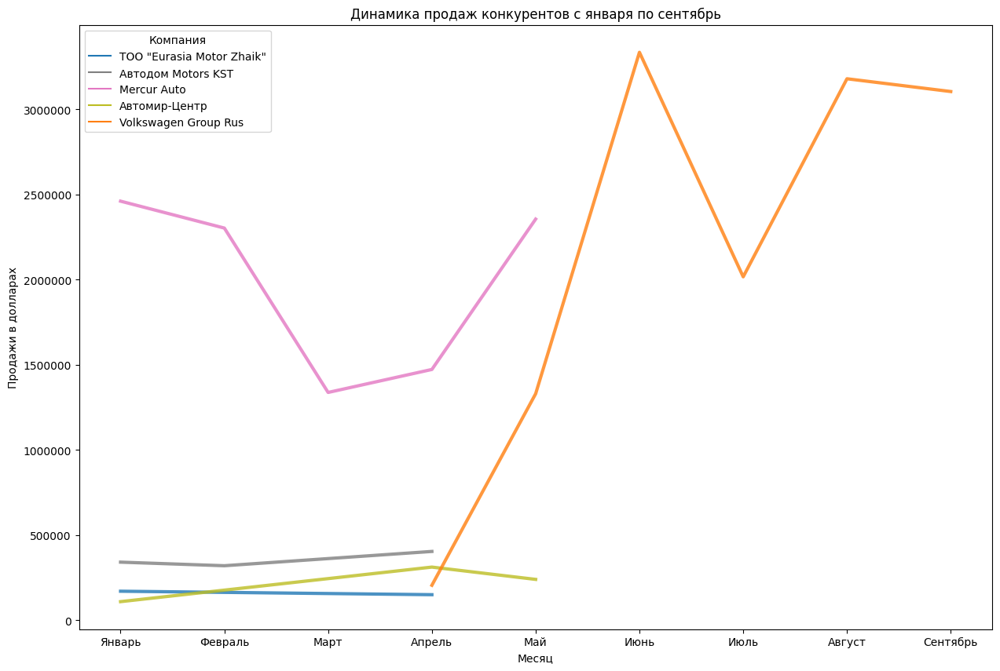

In [364]:

fig, ax = plt.subplots(figsize=(15, 10))
sns.lineplot(y='Продажа, USD', x='Месяц', data=competitors_dynamic, hue='Компания', linewidth=3, alpha=0.8, 
             palette=colors_competitors)
plt.xlabel('Месяц')
plt.ylabel('Продажи в долларах')
plt.title('Динамика продаж конкурентов с января по сентябрь')
plt.ticklabel_format(useOffset=False, style='plain', axis='y')
plt.legend(title='Компания')
plt.show()

**Вывод: мы видим, что производитель Volkswagen решил заменить 4 старых дилеров на одного, явно аффили́рованного с ним. С этим связано резкое снижение продаж компании Меркур Авто после мая. До мая Меркур Авто был лидером по продажам Volkswagen.**

In [365]:
competitors_region_sales = competitors.pivot_table(index=['Область', 'Компания'],
                                              values='Продажа, USD',
                                 aggfunc='sum').reset_index()

function_plotly_without_rank(table=competitors_region_sales,
                             x='Продажа, USD', y='Область',
                             color='Компания', 
                             color_discrete_map=colors_competitors, 
                             text='Продажа, USD', 
                             title='Регионы и фирмы конкуренты по продажам Volkswagen', 
                             xaxis_title='Продажи в долларах')

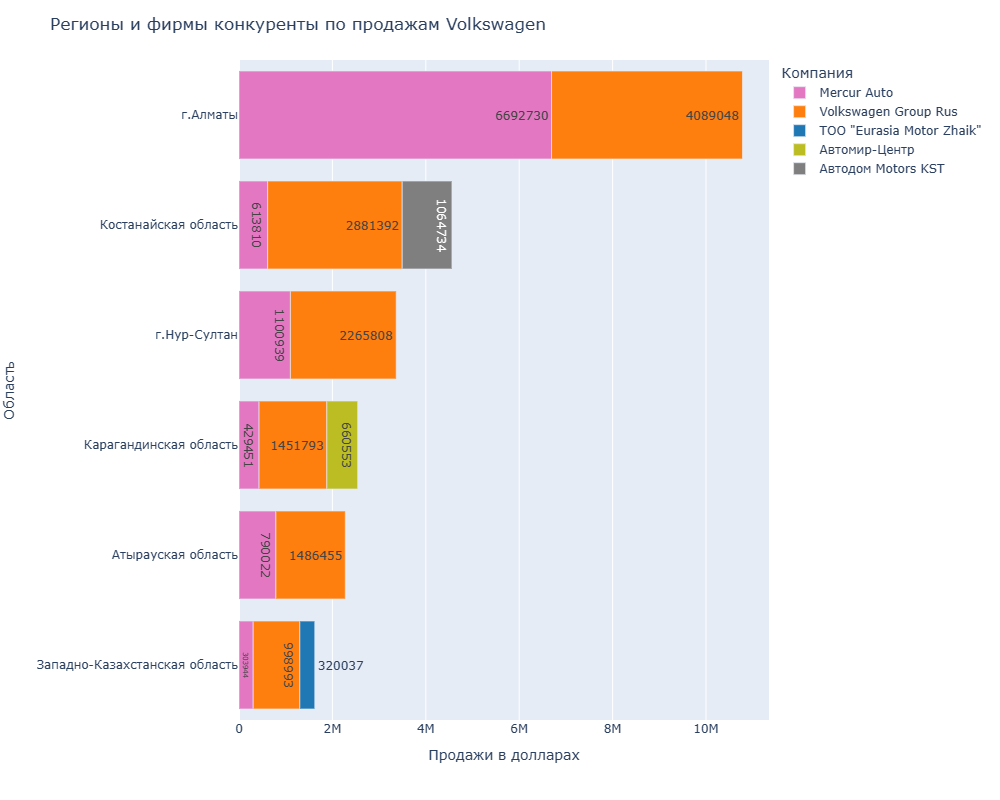

**Мы видим, что новый дилер смог превзойти старых во всех регионах, кроме самого ключевого - Алматы. В этом регионе компания Меркур Авто по-прежнему лидер по продажам.**  

#### *Проанализируем конкурентов по бренду Porsche*

In [366]:
competitors_porsche = light_vehicles.query('Бренд == "Porsche"')
competitors_porsche['Компания'].unique()

array(['Mercur Auto'], dtype=object)

#### *Проанализируем конкурентов по бренду Audi*

In [367]:
competitors_audi = light_vehicles.query('Бренд == "Audi"')
competitors_audi['Компания'].unique()

array(['Mercur Auto'], dtype=object)

**Мы видим, что Меркур Авто единственный дилер в Казахстане по брендам Porsche, Audi.**

#### *Проанализируем конкурентов по классам автомобилей*

**Найдем классы автомобилей, которыми занимается компания Меркур Авто**

In [368]:
def function_seaborn_2(table, x, y, ytitle):
    fig, ax = plt.subplots(figsize=(15, 10))
    ax = sns.barplot(x = x, y=y,
                 data = table.sort_values(by=y, ascending=False), palette=sns.color_palette("Set2"))
    plt.ylabel(f'{ytitle}')
    plt.xlabel(f'{x}')
    plt.title(f'Столбчатая диаграмма распределения {x}')
    plt.xticks(rotation=45)
    plt.ticklabel_format(useOffset=False, style='plain', axis='y')
    plt.show();

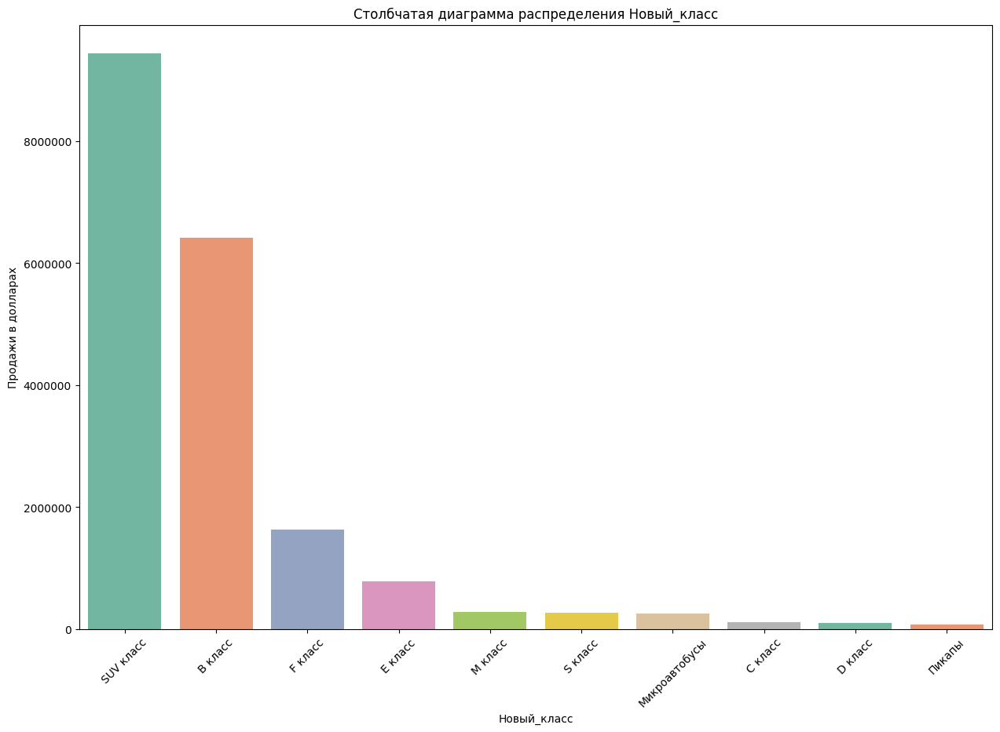

In [369]:
mercur_class = mercur.groupby('Новый_класс', as_index=False)['Продажа, USD'].agg('sum')
function_seaborn_2(table=mercur_class, x='Новый_класс', y='Продажа, USD', ytitle='Продажи в долларах')

**Мы видим, что компания больше всего продает автомобилей SUV и B классов, что полностью соответствует ситуации на рынке.**

**Отдельно рассмотрим конкурентов в SUV классе**

In [370]:
competitors_suv = light_vehicles.query('Новый_класс == "SUV класс"')

In [371]:
companies_suv = competitors_suv.pivot_table(index='Компания', values='Продажа, USD', aggfunc='sum').reset_index()
best_suv = companies_suv.sort_values(by='Продажа, USD', ascending=False).head(10)

best_suv['percentage'] = round(100 * (best_suv['Продажа, USD'] / best_suv['Продажа, USD'].sum()), 2)

In [372]:
best_suv

,Компания,"Продажа, USD",percentage
11,Toyota Motor Kazakhstan,255982631.0,42.43
2,Astana Motors,145857577.0,24.18
18,БИПЭК АВТО,53411400.0,8.85
6,Nissan Manufacturing RUS,45353320.0,7.52
0,Allur Auto,26564614.0,4.40
17,Автоцентр-Бавария,25423062.0,4.21
21,ММС Рус,15035607.0,2.49
7,Renault Россия,14022213.0,2.32
9,Subaru Kazakhstan,12152994.0,2.01
5,Mercur Auto,9432735.0,1.56


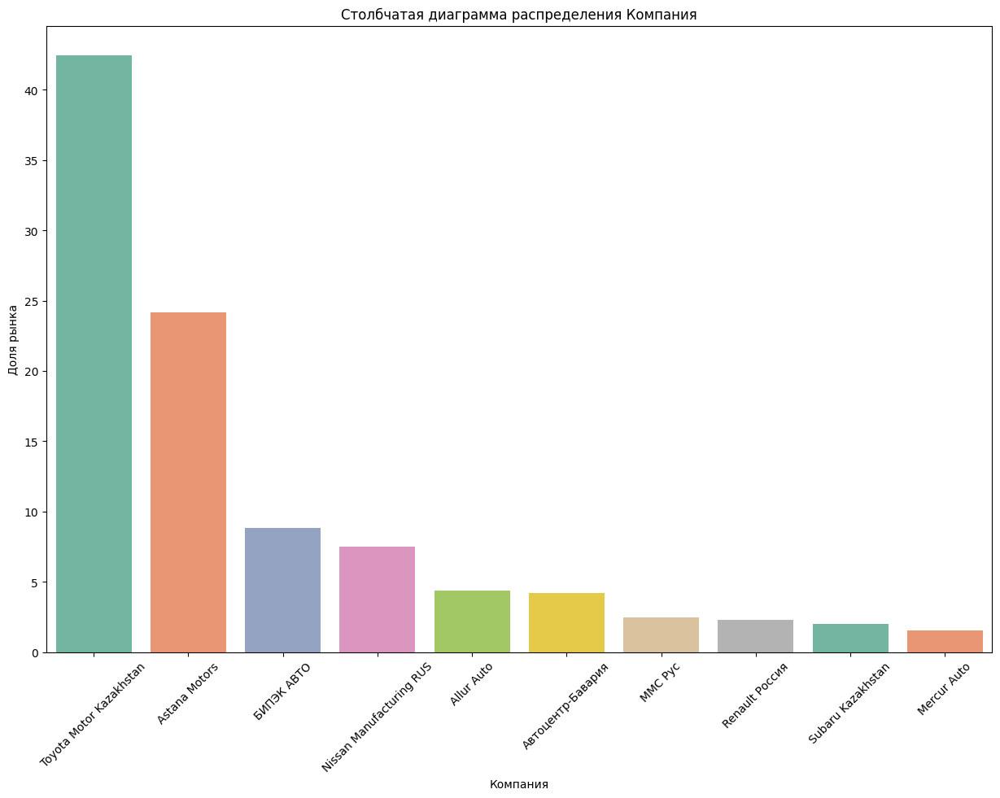

In [373]:
function_seaborn_2(table=best_suv, x='Компания', y='percentage', ytitle='Доля рынка')

**Вывод: в SUV классе компания Меркур Авто занимает порядка 2% рынка, что с одной стороны крайне мало, с другой стороны, учитывая проблемы с Volkswagen во второй половине года, совсем неплохо. Основные конкуренты со схожими долями рынка - компании Subaru Kazahstan, Renault Россия, ММС Рус, Автоцентр-Бавария, Allur Auto.**

**Для каждой компании найдем модели SUV класса, которыми они занимаются, и для каждой модели посчитаем сумму продаж.**

In [374]:
competitors_suv['Новое_значение'] = competitors_suv['Бренд'] + ' ' + competitors_suv['Модель']

**Теперь сравним продажи моделей компании Меркур Авто с моделями лидерами рынка. Для этого сначала отдельно сохраним продажи, относящиеся к Меркур Авто, далее оставим топ-15 моделей по продажам без учета Меркур Авто. Наконец, полученные таблицы объединим в итоговую final_suv.**

In [375]:
medium_suv = competitors_suv.pivot_table(index=['Компания',  'Новое_значение'],
                                         values='Продажа, USD', aggfunc='sum').reset_index()

In [376]:
mercur_suv = medium_suv.query('Компания =="Mercur Auto"')

In [377]:
medium_suv = medium_suv.query('Компания !="Mercur Auto"').sort_values(by='Продажа, USD', ascending=False).head(15)

In [378]:
final_suv = pd.concat([medium_suv, mercur_suv], axis=0)
final_suv

,Компания,Новое_значение,"Продажа, USD"
15,Astana Motors,Hyundai Tucson,87315626.0
69,Toyota Motor Kazakhstan,Toyota LC Prado,83134048.0
70,Toyota Motor Kazakhstan,Toyota LC200,57893775.0
13,Astana Motors,Hyundai Creta,35222303.0
71,Toyota Motor Kazakhstan,Toyota RAV4,33725122.0
62,Toyota Motor Kazakhstan,Lexus LX,33640552.0
64,Toyota Motor Kazakhstan,Lexus RX,24363832.0
14,Astana Motors,Hyundai Santa Fe,23288640.0
99,БИПЭК АВТО,Lada 4x4,22338600.0
0,Allur Auto,Jac S3,17847506.0


**Построим хитмэп, на котором сразу можно будет увидеть дилеров-лидеров рынка, их лучшие модели и модели компании Меркур Авто.
Для этого развернем таблицу final_suv и представим названия компаний, как названия столбцов.**

In [379]:
suv_full = final_suv.pivot_table(index='Новое_значение', columns='Компания',
                           values='Продажа, USD', aggfunc='sum').fillna(0).astype('int')

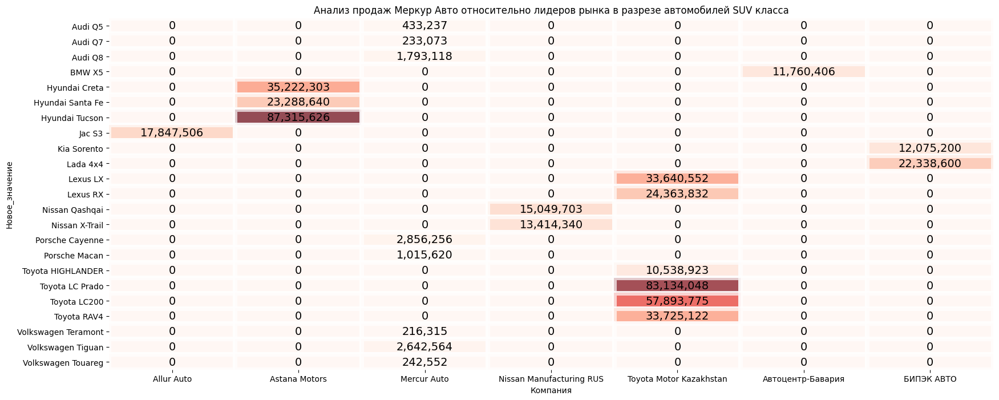

In [380]:
plt.figure(figsize=(20, 8))

# Создаем параметры для аннотаций
annot_kws = {"ha": 'center', "va": 'center', "fontsize": 14, "color": 'black'}

sns.heatmap(suv_full, annot=True, cbar=False, cmap='Reds', fmt=',.0f', linewidth=5, alpha=0.7, annot_kws=annot_kws)

plt.title('Анализ продаж Меркур Авто относительно лидеров рынка в разрезе автомобилей SUV класса')
plt.show()

**Вывод: Toyota LC Prado, LC200, Hyundai Tucson - лидеры рынка в классе SUV. В портфеле Меркур Авто в этом классе представлено 8 моделей, лучше всего продаются Porsche Cayenne и Volkswagen Tiguan. Учитывая проблемы с Volkswagen, возможно компании стоит взять дилерство по новому бренду. Если с лидерами рынка Toyota, Hyundai, Lada договориться не получится, то на мой взгляд можно присмотреться к таким брендам, как Jac, Nissan, Kia.**

**Отдельно рассмотрим конкурентов в B классе**

In [381]:
competitors_b = light_vehicles.query('Новый_класс == "B класс"')

In [382]:
companies_b = competitors_b.pivot_table(index='Компания', values='Продажа, USD', aggfunc='sum').reset_index()
best_b = companies_b.sort_values(by='Продажа, USD', ascending=False).head(10)
best_b['percentage'] = round(100 * (best_b['Продажа, USD'] / best_b['Продажа, USD'].sum()), 2)
best_b

,Компания,"Продажа, USD",percentage
9,БИПЭК АВТО,81290280.0,50.59
1,Astana Motors,36481919.0,22.70
10,Равон Моторс Казахстан,14938185.0,9.30
4,Renault Россия,9420432.0,5.86
5,Volkswagen Group Rus,8154598.0,5.07
3,Mercur Auto,6418799.0,3.99
12,УзАвто-Казахстан,1531552.0,0.95
0,Allur Auto,1444409.0,0.90
6,Автодом Motors KST,588373.0,0.37
7,Автомир-Центр,423971.0,0.26


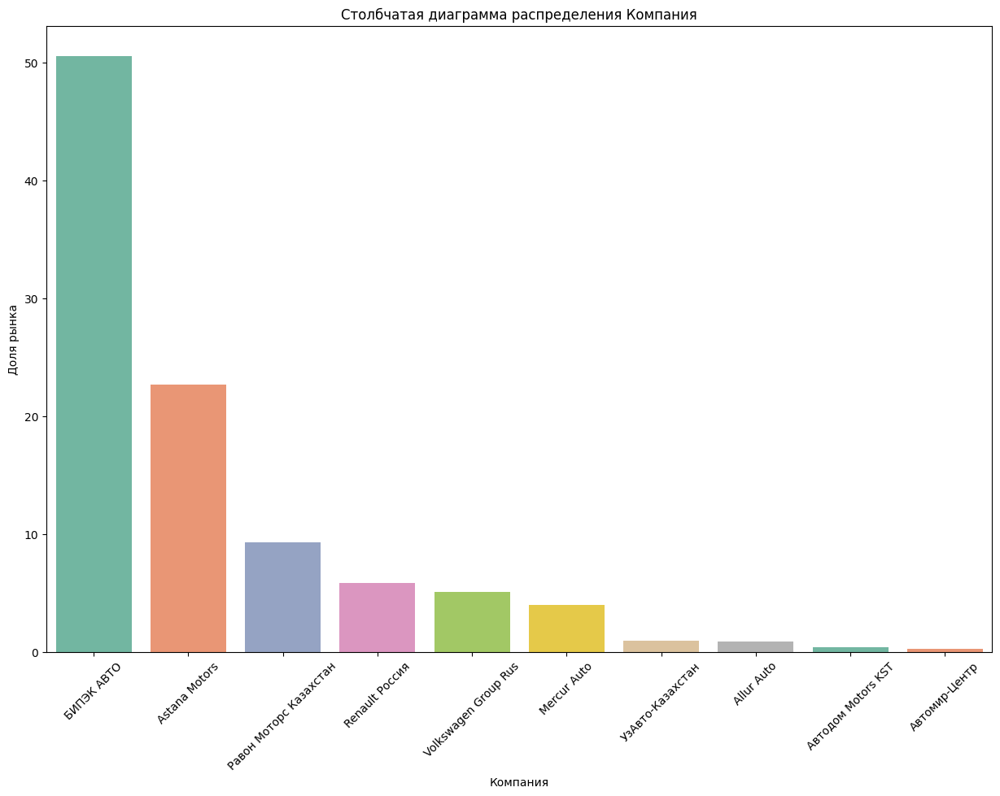

In [383]:
function_seaborn_2(table=best_b, x='Компания', y='percentage', ytitle='Доля рынка')

**Вывод: в В классе компания Меркур Авто занимает порядка 4% рынка, что с одной стороны крайне мало, с другой стороны, учитывая проблемы с Volkswagen во второй половине года, совсем неплохо. Основные конкуренты со схожими долями рынка - компании Volkswagen Group Rus (к которой перешло дилерство по Volkswagen), Renault Россия, Равон Моторс Казахстан.**

In [384]:
competitors_b['Новое_значение'] = competitors_b['Бренд'] + ' ' + competitors_b['Модель']
companies_b = competitors_b.pivot_table(index=['Компания',  'Новое_значение'],
                                         values='Продажа, USD', aggfunc='sum').reset_index()

In [385]:
mercur_b = companies_b.query('Компания =="Mercur Auto"')

In [386]:
companies_b = companies_b.query('Компания !="Mercur Auto"').sort_values(by='Продажа, USD', ascending=False).head(15)

In [387]:
final_b = pd.concat([companies_b, mercur_b], axis=0)

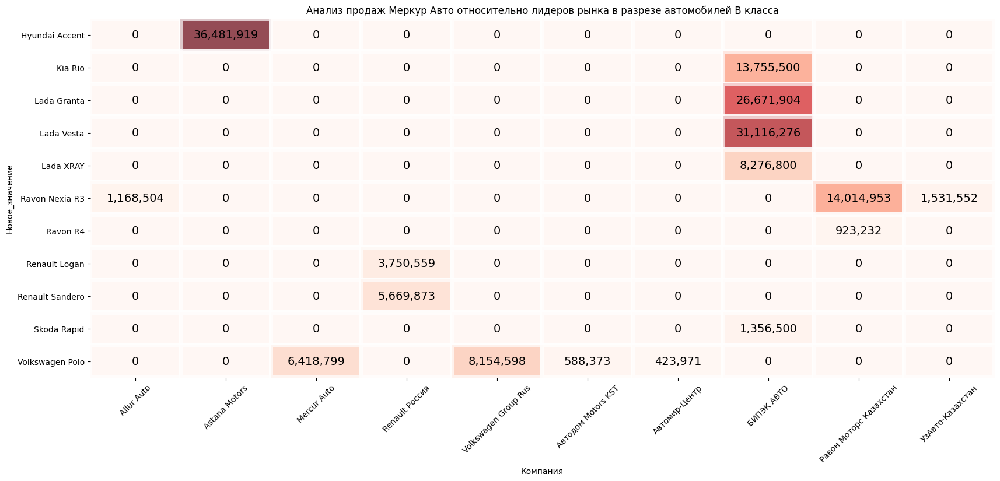

In [388]:
b_full = final_b.pivot_table(index='Новое_значение', columns='Компания',
                           values='Продажа, USD', aggfunc='sum').fillna(0).astype('int')

plt.figure(figsize = (20, 8))
annot_kws = {"ha": 'center', "va": 'center', "fontsize": 14, "color": 'black'}

sns.heatmap(b_full, annot=True, cbar=False, cmap='Reds', fmt=',.0f', linewidth=5, alpha=0.7, annot_kws=annot_kws)

plt.title('Анализ продаж Меркур Авто относительно лидеров рынка в разрезе автомобилей В класса')
plt.xticks(rotation='45')
plt.show()

**Вывод: Lada Granta, Vesta, Hyundai Accent - лидеры рынка в классе B. В портфеле Меркур Авто в этом классе представлена 1 модель- Volkswagen Polo. Новый дилер Volkswagen Group Rus превзошел Меркур Авто по продажам данной модели. Учитывая проблемы с Volkswagen, возможно компании стоит взять дилерство по новому бренду. Если с лидерами рынка Hyundai, Lada договориться не получится, то на мой взгляд можно присмотреться к таким брендам, как Ravon, Renault.**

#### *Проанализируем конкурентов по городу Нурсултан*

**Как мы заметили ранее, компания Меркур Авто имеет достаточно низкие продажи в городе Нурсултан, одним из ключевых городов по продажам автомобилей. Проверим, какие модели и лидеры представлены в этом городе в классах B и SUV.**

In [389]:
competitors_nursultan = light_vehicles.query('Область == "г.Нур-Султан"')

In [390]:
nursultan_suv = competitors_nursultan.query('Новый_класс == "SUV класс"').pivot_table(index='Компания',
                                         values='Продажа, USD', aggfunc='sum').reset_index()
nursultan_suv.sort_values(by='Продажа, USD', ascending=False).head()

,Компания,"Продажа, USD"
8,Toyota Motor Kazakhstan,67960617.0
1,Astana Motors,34702072.0
12,Автоцентр-Бавария,10194886.0
4,Nissan Manufacturing RUS,8771250.0
13,БИПЭК АВТО,8385300.0


In [391]:
nursultan_b = competitors_nursultan.query('Новый_класс == "B класс"').pivot_table(index='Компания',
                                         values='Продажа, USD', aggfunc='sum').reset_index()
nursultan_b.sort_values(by='Продажа, USD', ascending=False).head()

,Компания,"Продажа, USD"
6,БИПЭК АВТО,9774053.0
1,Astana Motors,8029728.0
7,Равон Моторс Казахстан,1806659.0
3,Renault Россия,1710499.0
4,Volkswagen Group Rus,1074807.0


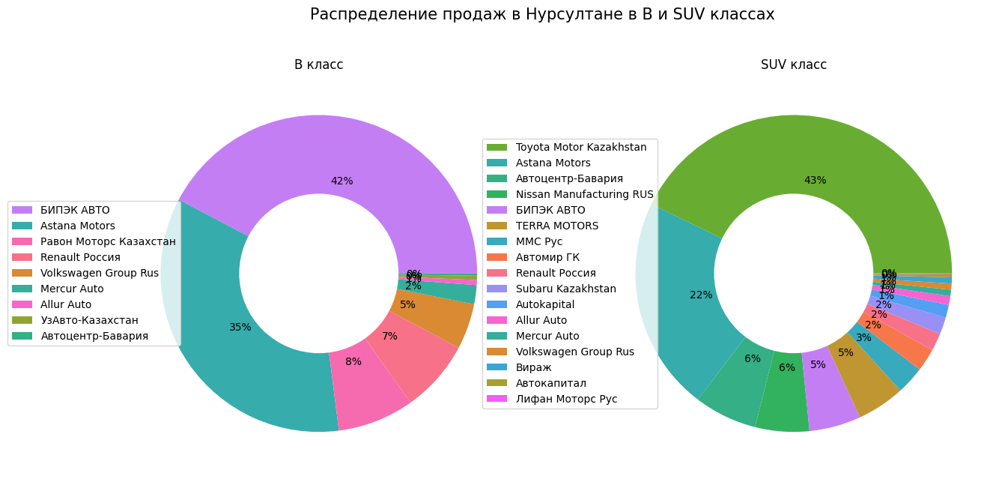

In [392]:
values_1 = nursultan_b['Продажа, USD'].tolist()
labels_1 = nursultan_b['Компания'].tolist()

values_2 = nursultan_suv['Продажа, USD'].tolist()
labels_2 = nursultan_suv['Компания'].tolist()

# Получение списка уникальных компаний
unique_companies = pd.Series(list(set(labels_1) | set(labels_2)))

# Создание словаря цветов только для уникальных компаний
colors = sns.color_palette("husl", n_colors=len(unique_companies))
company_color_dict = dict(zip(unique_companies, colors))

# Сортировка значений и меток
sorted_data_1 = sorted(zip(values_1, labels_1), reverse=True)
sorted_values_1, sorted_labels_1 = zip(*sorted_data_1)

sorted_data_2 = sorted(zip(values_2, labels_2), reverse=True)
sorted_values_2, sorted_labels_2 = zip(*sorted_data_2)

# Построение графика
plt.figure(figsize=(15, 10))
plt.suptitle('Распределение продаж в Нурсултане в В и SUV классах', fontsize=15, y=0.85)

plt.subplot(1, 2, 1)
plt.pie(sorted_values_1, autopct='%.0f%%', labels=None, colors=[company_color_dict[label] for label in sorted_labels_1])
plt.title('B класс')
circle_1 = plt.Circle((0, 0), 0.5, color='white')
p = plt.gcf()
p.gca().add_artist(circle_1)
plt.legend(sorted_labels_1, loc='center left', bbox_to_anchor=(-0.3, 0.5))

plt.subplot(1, 2, 2)
plt.pie(sorted_values_2, autopct='%.0f%%', labels=None, colors=[company_color_dict[label] for label in sorted_labels_2])
plt.title('SUV класс')
circle_2 = plt.Circle((0, 0), 0.5, color='white')
p = plt.gcf()
p.gca().add_artist(circle_2)
plt.legend(sorted_labels_2, loc='center left', bbox_to_anchor=(-0.3, 0.5))

plt.show()

**Вывод: мы видим, что в SUV классе Меркур Авто в Нурсултане имеет такую же долю, что и в целом по рынку - порядка 2%, а в В классе наблюдается серьезная просадка - всего 1% по сравнению с 4% в общем по рынку.**

**Теперь сравним продажи моделей компании Меркур Авто в Нурсултане с показателями лидеров в этом городе. Отдельно для В и SUV классов.**

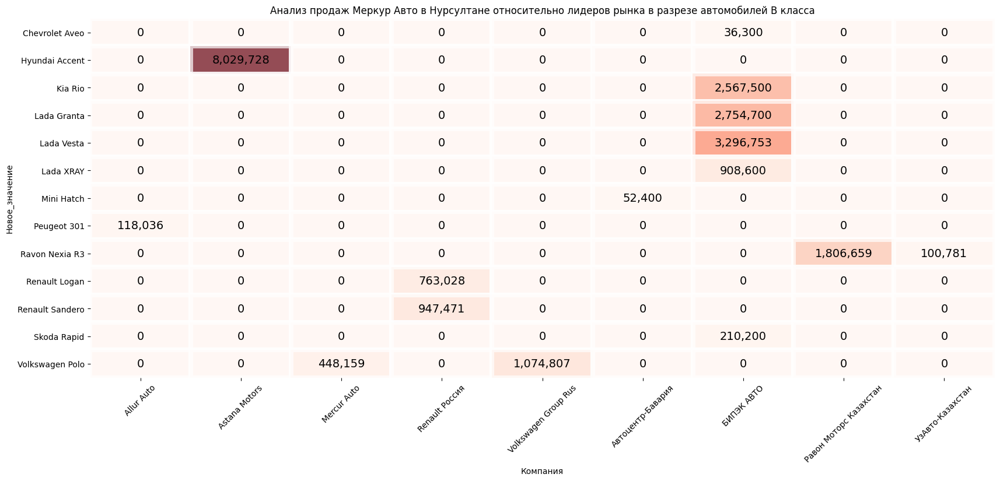

In [393]:
b_nursultan = competitors_nursultan.query('Новый_класс == "B класс"').pivot_table(index='Новое_значение', columns='Компания',
                           values='Продажа, USD', aggfunc='sum').fillna(0).astype('int')

plt.figure(figsize = (20, 8))  # задаём размер графика
annot_kws = {"ha": 'center', "va": 'center', "fontsize": 14, "color": 'black'}

sns.heatmap(b_nursultan, annot=True, cbar=False, cmap='Reds', fmt=',.0f', linewidth=5, alpha=0.7, annot_kws=annot_kws)

plt.title('Анализ продаж Меркур Авто в Нурсултане относительно лидеров рынка в разрезе автомобилей В класса')
plt.xticks(rotation='45')
plt.show()

**Вывод: мы видим, что если в целом по рынку Volkswagen Group Rus превзошел Меркур Авто по продажам в В классе в 1,27 раз, то конкретно в Нурсултане разница составляет 2,39 раза. В целом, в Нурсултане структура продаж почти такая же, как и в целом по рынку: Lada Granta, Vesta, Hyundai Accent - лидеры. Разница в том, что в Нурсултане Kia Rio продается лучше чем в целом по рынку и обгоняет Ravon Nexia R3. Соответственно, если возвращаться к вопросу о новом дилерстве, то помимо обозначенных выше Hyundai, Lada,Ravon, Renault, можно также рекомендовать взять дилерство по Kia. Это позволит значительно нарастить продажи компании в Нурсултане в В классе**

In [394]:
suv_nursultan = competitors_nursultan.query('Новый_класс == "SUV класс"').pivot_table(index=['Компания',  'Новое_значение'],
                                         values='Продажа, USD', aggfunc='sum').reset_index()

suv_mercur = suv_nursultan.query('Компания =="Mercur Auto"')

suv_nursultan = suv_nursultan.query('Компания !="Mercur Auto"').sort_values(by='Продажа, USD', ascending=False).head(15)

In [395]:
suv_final = pd.concat([suv_mercur, suv_nursultan], axis=0)
suv_final

,Компания,Новое_значение,"Продажа, USD"
11,Mercur Auto,Audi Q5,107823.0
12,Mercur Auto,Audi Q7,72215.0
13,Mercur Auto,Audi Q8,154525.0
14,Mercur Auto,Porsche Cayenne,72919.0
15,Mercur Auto,Volkswagen Tiguan,530884.0
16,Mercur Auto,Volkswagen Touareg,81676.0
6,Astana Motors,Hyundai Tucson,20613979.0
47,Toyota Motor Kazakhstan,Toyota LC Prado,17126359.0
40,Toyota Motor Kazakhstan,Lexus LX,12914991.0
48,Toyota Motor Kazakhstan,Toyota LC200,11660846.0


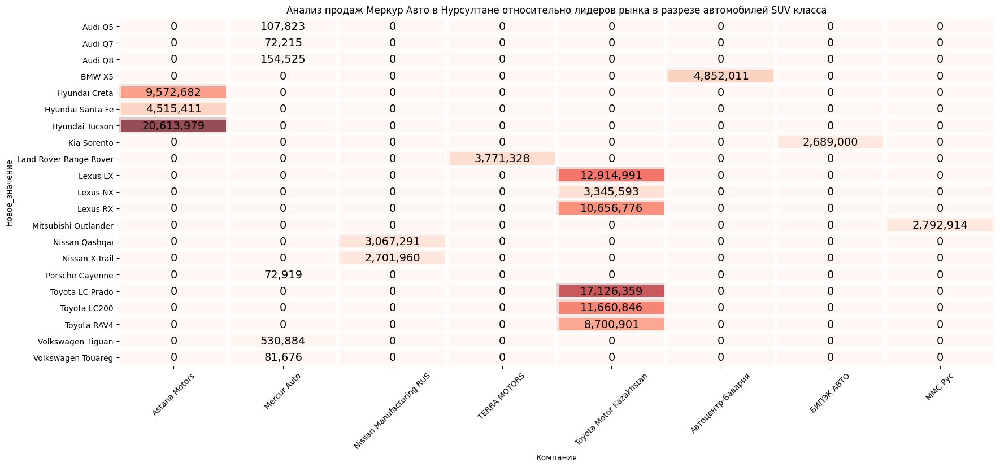

In [396]:
full_suv = suv_final.pivot_table(index='Новое_значение', columns='Компания',
                           values='Продажа, USD', aggfunc='sum').fillna(0).astype('int')

plt.figure(figsize = (20, 8))  # задаём размер графика
annot_kws = {"ha": 'center', "va": 'center', "fontsize": 14, "color": 'black'}

sns.heatmap(full_suv, annot=True, cbar=False, cmap='Reds', fmt=',.0f', linewidth=5, alpha=0.7, annot_kws=annot_kws)

plt.title('Анализ продаж Меркур Авто в Нурсултане относительно лидеров рынка в разрезе автомобилей SUV класса')
plt.xticks(rotation='45')
plt.show()

**Вывод: мы видим, что по сравнению с рынком в целом в Нурсултане у Меркур Авто практически не продается Porsche Cayenne, лучше всего продается Volkswagen Tiguan. В целом мы видим, что в Нурсултане структура продаж в SUV классе немного отличается от рынка - здесь гораздо лучше продаются Lexus LX, RX. Hyundai Creta, а Lada 4x4 отсутствует в списке лидеров. Если рассматривать вопрос нового дилерства, то рекомендации без изменений - если с лидерами рынка Toyota, Hyundai, Lada договориться не получится, то на мой взгляд можно присмотреться к таким брендам, как Jac, Nissan, Kia.**

### Проведем BCG анализ марок, которыми торгует компания Меркур Авто

Метод BCG-матрицы (Boston Consulting Group) является инструментом стратегического управления портфелем продуктов или бизнес-единиц компании. Разработанный бизнес-консультантами в 1970-х годах, этот метод представляет собой двумерную матрицу, основанную на анализе доли рынка и темпа роста продукции или бизнес-единицы. Четыре квадранта BCG-матрицы определяют стратегическую позицию продукта или бизнеса: «Звезды», «Трудные дети», «Дойные коровы» и «Дохлые Собаки».
- Звезды имеют высокую долю рынка и высокий темп роста, требуя дополнительных инвестиций.
- Трудные дети – это новые продукты с высоким ростом и неопределенной долей рынка.
- Дойные коровы – устоявшиеся продукты с высокой долей рынка и низким темпом роста.
- Дохлые Собаки – продукты с низкой долей рынка и низким темпом роста, требующие внимательного рассмотрения для определения их будущего вклада в портфель компании.

Этот метод помогает компаниям принимать стратегические решения относительно распределения ресурсов и инвестиций в соответствии с потенциалом роста и прибыли.

**Для проведения BCG анализа для каждой модели посчитаем ежемесячные продажи и итоговые продажи. Это позволит для каждой модели найти ее долю рынка внутри Меркур Авто. Далее, для каждой модели найдем первую и последнюю продажи, это позволит высчитать темп роста продаж для каждой модели.**

In [397]:
bcg = mercur.pivot_table(index=['Месяц', 'Модель'], values='Продажа, USD', aggfunc='sum').reset_index()
bcg.fillna(0, inplace=True)
bcg = order_months(bcg, 'Месяц')
bcg['Итоговые продажи'] = bcg.groupby('Модель')['Продажа, USD'].transform('sum')
bcg['Доля рынка'] = round(100 * (bcg['Итоговые продажи'] / bcg['Итоговые продажи'].sum()), 3)
bcg['Последняя продажа'] = bcg.groupby('Модель')['Продажа, USD'].transform('last')
bcg['Первая продажа'] = bcg.groupby(['Модель'])['Продажа, USD'].transform('first')
bcg['Темп роста'] = round(100 * ((bcg['Последняя продажа'] / bcg['Первая продажа']) - 1), 3)
bcg.head()

,Месяц,Модель,"Продажа, USD",Итоговые продажи,Доля рынка,Последняя продажа,Первая продажа,Темп роста
69,Январь,Transporter Kombi,36521.0,36521.0,0.035,36521.0,36521.0,0.000
67,Январь,Tiguan,359877.0,2642564.0,2.549,586139.0,359877.0,62.872
66,Январь,Q5,47836.0,433237.0,0.418,58723.0,47836.0,22.759
65,Январь,Polo,1977536.0,6418799.0,6.190,1717738.0,1977536.0,-13.137
64,Январь,Multivan,70395.0,211161.0,0.204,70371.0,70395.0,-0.034


In [398]:
# На примере модели Panamera проверим, что все вычисления сделаны корректно
bcg.query('Модель == "Panamera"')

,Месяц,Модель,"Продажа, USD",Итоговые продажи,Доля рынка,Последняя продажа,Первая продажа,Темп роста
9,Апрель,Panamera,152442.0,1079062.0,1.041,126037.0,152442.0,-17.321
30,Май,Panamera,436131.0,1079062.0,1.041,126037.0,152442.0,-17.321
24,Июнь,Panamera,364452.0,1079062.0,1.041,126037.0,152442.0,-17.321
51,Сентябрь,Panamera,126037.0,1079062.0,1.041,126037.0,152442.0,-17.321


In [399]:
# Оставим только те столбцы, которые понадобятся нам для построения матрицы BCG
final = bcg.pivot_table(index='Модель', values=['Доля рынка', 'Темп роста', 'Итоговые продажи'],
                     aggfunc={'Доля рынка': 'max', 'Темп роста': 'max', 'Итоговые продажи' : 'sum'}).reset_index()
final.sort_values(by='Темп роста', ascending=False)

,Модель,Доля рынка,Итоговые продажи,Темп роста
3,A6,0.586,3038465.0,313.204
7,Cayenne,2.755,25706304.0,275.291
2,A4,0.092,191716.0,99.556
5,A8,0.538,1673397.0,89.018
18,Tiguan,2.549,13212820.0,62.872
14,Q7,0.225,466146.0,62.617
9,Macan,0.979,6093720.0,48.837
13,Q5,0.418,1732948.0,22.759
1,A3,0.058,120724.0,14.697
0,911 Carrera S,0.157,162576.0,0.000


In [400]:
# Для каждой модели, в зависимости от доли рынка и темпа роста присвоим значение согласно BCG классификации
final['Классификация'] = 'Другие'
final.loc[(final['Доля рынка'] >= 5.0) & (final['Темп роста'] >= 50.0), 'Классификация'] = 'Звезды'
final.loc[(final['Доля рынка'] >= 5.0) & (final['Темп роста'] < 50.0), 'Классификация'] = 'Дойные коровы'
final.loc[(final['Доля рынка'] < 5.0) & (final['Темп роста'] >= 50.0), 'Классификация'] = 'Трудные дети'
final.loc[(final['Доля рынка'] < 5.0) & (final['Темп роста'] < 50.0), 'Классификация'] = 'Дохлые собаки'
final

,Модель,Доля рынка,Итоговые продажи,Темп роста,Классификация
0,911 Carrera S,0.157,162576.0,0.000,Дохлые собаки
1,A3,0.058,120724.0,14.697,Дохлые собаки
2,A4,0.092,191716.0,99.556,Трудные дети
3,A6,0.586,3038465.0,313.204,Трудные дети
4,A7,0.165,171100.0,0.000,Дохлые собаки
5,A8,0.538,1673397.0,89.018,Трудные дети
6,Amarok,0.070,73042.0,0.000,Дохлые собаки
7,Cayenne,2.755,25706304.0,275.291,Трудные дети
8,Jetta,0.052,53434.0,0.000,Дохлые собаки
9,Macan,0.979,6093720.0,48.837,Дохлые собаки


In [401]:
fig = px.scatter(final[final['Доля рынка'] > 0.5],
                 x="Доля рынка",
                 y="Темп роста",
                 size="Итоговые продажи",
                 color="Классификация",  # Используем столбец "Классификация" для цвета
                 size_max=75,
                 text='Модель',
                 title="BCG матрица для компании Меркур Авто (для моделей с долей рынка больше 0,5%)",
                 width=1000,
                 height=600,
                 category_orders={"Классификация": ["Звезды", "Дойные коровы", "Дохлые собаки", "Трудные дети"]})

fig.show()

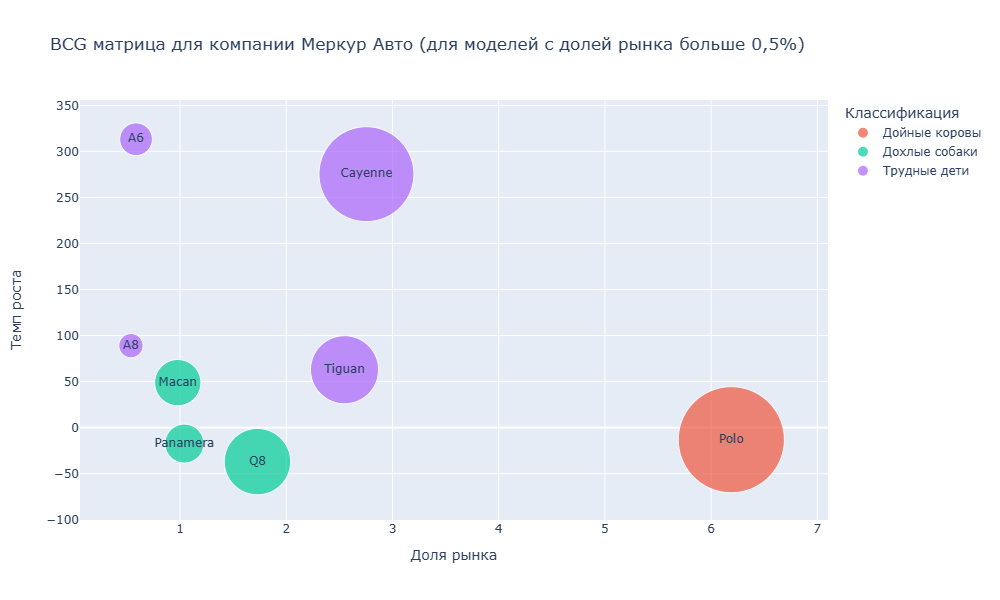

**Вывод: мы построили BCG матрицу для самых продаваемых моделей компании Меркур Авто. Надо отметить, что бренд Volkswagen продавался только первые 5 месяцев года, что напрямую повлияло на распределение категорий. На данный момент мы видим следующее:**
- Категория "Звезды" отсутствует, что на мой взгляд крайне плохо, но объяснимо проблемами с Volkswagen в течение года.
- В категорию "Дойные коровы" попала только 1 модель, что также на мой взгляд является тревожным сигналом для компании.
- В категорию "Дохлые собаки" попали 2 модели Porsche и 1 модель Audi. На мой взгляд выводить их из портфеля не нужно, так как Меркур Авто имеет эксклюзив по данным брендам. Возможно, стоит провести какие-то маркетинговые компании с участием этих брендов.

### Промежуточный вывод: на данном этапе мы провели анализ положения Меркур Авто на рынке. Нам удалось установить следующее:
1. общая выручка компании составляет 19 355 310 долларов, средняя выручка компании составляет 30 102 долларов
2. компания занимается брендами Audi, Porsche, Volkswagen. Наиболее прибыльный бренд - Volkswagen. Меркур Авто единственный дилер в Казахстане по брендам Porsche, Audi.
3. динамика продаж компании сильно отличается от общерыночной. На рынке после зимы наблюдается рост пиком в июле. У компании наоборот после пика в мае к лету наблюдается резкий спад продаж. Это связано с тем, что производитель Volkswagen решил заменить 4 старых дилеров на одного, явно аффили́рованного с ним. До мая Меркур Авто был лидером по продажам Volkswagen.
4. новый дилер смог превзойти старых во всех регионах, кроме самого ключевого - Алматы. В этом регионе компания Меркур Авто по-прежнему лидер по продажам.
5. практически все продажи компании сосредоточены в Алмате. У компании крайне малые продажи в Нурсултане, это одна из точек роста компании.
6. компания больше всего продает автомобилей SUV и B классов, что полностью соответствует ситуации на рынке.
7. в SUV классе компания Меркур Авто занимает порядка 2% рынка. Основные конкуренты со схожими долями рынка - компании Subaru Kazahstan, Renault Россия, ММС Рус, Автоцентр-Бавария, Allur Auto.
8. Toyota LC Prado, LC200, Hyundai Tucson - лидеры рынка в классе SUV. В портфеле Меркур Авто в этом классе представлено 8 моделей, лучше всего продаются Porsche Cayenne и Volkswagen Tiguan.
9. в В классе компания Меркур Авто занимает порядка 4% рынка. Основные конкуренты со схожими долями рынка - компании Volkswagen Group Rus (к которой перешло дилерство по Volkswagen), Renault Россия, Равон Моторс Казахстан.
10. Lada Granta, Vesta, Hyundai Accent - лидеры рынка в классе B. В портфеле Меркур Авто в этом классе представлена 1 модель- Volkswagen Polo. Новый дилер Volkswagen Group Rus превзошел Меркур Авто по продажам данной модели.
11. мы видим, что в SUV классе Меркур Авто в Нурсултане имеет такую же долю, что и в целом по рынку - порядка 2%, а в В классе наблюдается серьезная просадка - всего 1% по сравнению с 4% в общем по рынку.
12. в Нурсултане структура продаж в В классе почти такая же, как и в целом по рынку: Lada Granta, Vesta, Hyundai Accent - лидеры. Разница в том, что в Нурсултане Kia Rio продается лучше чем в целом по рынку и обгоняет Ravon Nexia R3.
13. в Нурсултане структура продаж в SUV классе немного отличается от рынка - здесь гораздо лучше продаются Lexus LX, RX, Hyundai Creta, а Lada 4x4 отсутствует в списке лидеров. По сравнению с рынком в целом в Нурсултане у Меркур Авто практически не продается Porsche Cayenne, лучше всего продается Volkswagen Tiguan.
14. был проведен BCG анализ моделей Меркур Авто, было установлено следующее:
- Категория "Звезды" отсутствует, что крайне плохо, но объяснимо проблемами с Volkswagen в течение года.
- В категорию "Дойные коровы" попала только 1 модель, что также является тревожным сигналом для компании.
- В категорию "Дохлые собаки" попали 2 модели Porsche и 1 модель Audi. Выводить их из портфеля не нужно, так как Меркур Авто имеет эксклюзив по данным брендам. Возможно, стоит провести какие-то маркетинговые компании с участием этих брендов.

## Рекомендации, которые можно дать компании Меркур Авто по развитию бизнеса:
1. Попробовать вернуть дилерство по Volkswagen, так как это наиболее прибыльный бренд компании. Одним из аргументов для возвращения дилерства: новый дилер не справляется с поддержанием уровня продаж в Алмате - ключевом городе по продажам автомобилей.
2. Если с Volkswagen договоиться не удастся, то чтобы сохранить и нарастить долю на рынке, компании необходимо брать дилерство по какому-то новому бренду (или нескольким брендам). Если с лидерами рынка - Toyota, Hyundai, Lada договориться не получится, то на мой взгляд можно присмотреться к таким брендам, как Jac, Nissan, Kia, Ravon, Renault.
3. На мой взгляд оптимальным решением было бы выбрать бренд Kia, так как он позволит значительно нарастить продажи в В классе, особенно в Нурсултане, где у компания явно не добирает в потенциальных продажах. Безусловно, данное предложение исходя из предположения, что ни с кем из лидеров - Toyota, Hyundai, Lada договориться не получится. Данные бренды поделили между собой рынок и вряд ли заинтересованы в появлении новых дилеров.
4. Для увеличения объема продаж компания может начать развивать направление коммерческого транспорта. Если с лидерами рынка - Камаз, ГАЗ, договориться не получится, то на мой взгляд можно присмотреться к таким брендам, как Daewoo, UAZ, Hyundai Truck, MAN.
5. На мой взгляд оптимальным решением было бы выбрать бренд Hyundai Truck или MAN, так как эти бренды отлично продаются в Алмате, где у Меркур Авто самые сильные позиции. Если компания решит увеличивать продажи в Нурсултане, в том числе засчет коммерческого сегмента, то в таком случае обязательно надо брать дилерство по Камазу, так как этот бренд лучше всего продается в данном городе.